<div style="border:solid Chocolate 2px; padding: 40px">

Привет, меня зовут Александр Куимов. Я буду ревьюером твоего проекта. Ты можешь обращаться ко мне на "ты"😏 Надеюсь, тебя также не смутит, если я буду обращаться к тебе на "ты", но если это неудобно, обязательно скажи об этом!

**Пожалуйста, не удаляй мои комментарии**, они будут особенно полезны для нашей работы в случае повторной проверки проекта. 

Ты также можешь реагировать на мои комментарии своими по шаблону, показанному чуть ниже. Это нужно, чтобы не создавалась путаница😉

Ты можешь найти мои комментарии, обозначенные <font color='green'>зеленым</font>, <font color='gold'>желтым</font> и <font color='red'>красным</font> цветами, например:

<br/>

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> В случае, если решение на отдельном шаге является полностью правильным.
</div>

<br/>

<div class="alert alert-warning">
    <h2> Комментарий ревьюера <a class="tocSkip"> </h2>
    
<b>Некоторые замечания и рекомендации💡:</b> В случае, когда решение на отдельном шаге станет еще лучше, если внести небольшие коррективы.
</div>


<br/>
<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера <a class="tocSkip"></h2>

    
<b>На доработку🤔:</b>
 В случае, когда решение на отдельном шаге требует существенной переработки и внесения правок. Напоминаю, что проект не может быть принят с первого раза, если ревью содержит комментарии, рекомендующие доработать шаги.
</div>
    
    
<br/>    
<div class="alert alert-info">
<h2> Комментарий студента: <a class="tocSkip"> </h2>

<b>👋:</b> В такой цветовой ячейке я прошу тебя оставлять свои комментарии. Если исправляешь проект на второй итерации и выше, не забывай пожалуйста указывать номер итерации, например, "Комментарий студента v.2".
</div> 

<br/>    
    
Увидев у тебя неточность, в первый раз я лишь укажу на ее наличие и дам тебе возможность самому найти и исправить ее. На реальной работе твой руководитель будет поступать также, и я пытаюсь подготовить тебя именно к работе датасаентистом. Но если ты пока не справишься с такой задачей - при следующей проверке я дам более точную подсказку!🤓

# Прогнозирование температуры плавления стали

<font size="3">
    
**Цель работы:** построить модель, которая будет прогнозировать температуру сплава стали. Полученная модель будет использована для имитации технологического процесса с целью уменьшения потребления электроэнергии на этапе обработки стали.

**Описание данных:** для проведения исследования доступна база данных заказчика. Она состоит из нескольких таблиц:
* `steel.data_arc` — данные об электродах;
* `steel.data_bulk` — данные об объёме сыпучих материалов;
* `steel.data_bulk_time` — данные о времени подачи сыпучих материалов;
* `steel.data_gas` — данные о продувке сплава газом;
* `steel.data_temp` — данные об измерениях температуры;
* `steel.data_wire` — данные об объёме проволочных материалов;
* `steel.data_wire_time` — данные о времени подачи проволочных материалов.

**План проведения исследования:**
1. Загрузим данные;
2. Проведём исследовательский анализ и предобработку данных;
3. Объединими таблицы и подготовим данные для обучения;
4. Обучим модели на разных алгоритмах и выберем лучшую модель с помощью метрики `MAE`;
5. Протестируем лучшую модель на тестовых данных;
6. Подготовим выводы и бизнес-рекомендации заказчику.

**Возможные особенности:**  заказчик предупредил о некоторых особенностях и нюансах технологического процесса обработки стали:

- заказчиком предосталено детальное описание процесса обработки стали;
- известно, что во все партии точно добавлялись сыпучие и проволочные материалы, везде была выполнена продувка газом и сплав всегда нагревался;
- иногда наблюдается асинхронность в заданном времени разных датчиков, в связи с чем полученная хронология может не соответствовать описанию процесса обработки стали;
- также заказчик предупредил, что значения температуры ниже 1500 градусов — аномальные.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> 
    
Вижу твое добавленное описание проекта. Молодец! Это поможет тебе расставлять акценты в выводах

<hr style="width: 100%; height: 2px; background-color: #99b9b6;">


## Загрузка данных и библиотек

###  Импорт библиотек

<font size="3"> Импортируем необходимые библиотеки:

In [1]:
pip install missingno phik catboost optuna==3.6 optuna-integration shap==0.42.0 matplotlib==3.8.3 scikit-learn==1.3.0 numpy==1.23.5 numba==0.60.0 -q

Note: you may need to restart the kernel to use updated packages.


In [2]:
import gc
import re
import warnings
from functools import reduce
from warnings import simplefilter

import matplotlib.pyplot as plt
import missingno as msno
import numpy as np
import optuna
import pandas as pd
import phik
import plotly.express as px
import seaborn as sns
import sqlite3
import tensorflow as tf
from catboost import CatBoostRegressor, Pool, cv
from optuna import create_study, Trial, distributions
from optuna.integration import TFKerasPruningCallback
from optuna.samplers import TPESampler
from phik.report import plot_correlation_matrix
from pylab import rcParams
from sklearn.dummy import DummyRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_absolute_error, r2_score
from sklearn.model_selection import KFold, train_test_split, cross_val_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler
from tensorflow import keras
from tensorflow.keras.layers import (
    BatchNormalization,
    Dense,
    Dropout,
    Flatten,
    GlobalAveragePooling2D,
)
from tensorflow.keras.metrics import MeanAbsoluteError
from tensorflow.keras.models import Sequential
from tensorflow.keras.optimizers import Adam
import shap

In [3]:
# настройки Pandas
pd.options.display.float_format ='{:,.3f}'.format
pd.set_option('display.max_columns', None)
pd.set_option('display.max_colwidth', 512)

# зададим константу
SEED = 111124 #дата начала написания проекта

# настройки графиков
PLOT_DPI = 150
sns.set_theme(style="darkgrid", palette="crest")
rcParams['figure.figsize'] = 12, 6
plt.rc(
       'axes',
       labelweight='bold',
       titlesize=16,
       titlepad=10,
      )

# остальные настройки
simplefilter(action="ignore", category=pd.errors.PerformanceWarning)
warnings.filterwarnings("ignore")

### Подключение к БД

In [4]:
# загрузка файла ds-plus-final.db
!wget https://code.s3.yandex.net/data-scientist/ds-plus-final.db -q

In [5]:
# подключение к базе данных SQLite
conn = sqlite3.connect('ds-plus-final.db')

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> 
    
Отлично, что есть подключение к базам данных)

### Первичное исследование таблиц

<font size="3"> Получим список доступных таблиц в базе данных.

In [6]:
# получим список доступных таблиц в базе данных SQLite
query = "SELECT name FROM sqlite_master WHERE type='table';"
tables = pd.read_sql_query(query, conn)

# выведем список таблиц
print(tables)

              name
0         data_arc
1        data_bulk
2   data_bulk_time
3   data_wire_time
4         contract
5         personal
6            phone
7         internet
8         data_gas
9        data_temp
10       data_wire


<font size="3">
    
В базе данных заказчика присутствуют все 7 заявленных таблиц c наборами данных, запишем таблицы в отдельные датафреймы.

In [7]:
# считаем таблицы из SQLite в DataFrame
data_arc = pd.read_sql_query("SELECT * FROM data_arc;", conn)
data_bulk = pd.read_sql_query("SELECT * FROM data_bulk;", conn)
data_bulk_time = pd.read_sql_query("SELECT * FROM data_bulk_time;", conn)
data_gas = pd.read_sql_query("SELECT * FROM data_gas;", conn)
data_temp = pd.read_sql_query("SELECT * FROM data_temp;", conn)
data_wire = pd.read_sql_query("SELECT * FROM data_wire;", conn)
data_wire_time = pd.read_sql_query("SELECT * FROM data_wire_time;", conn)

# закроем соединение
conn.close()

In [8]:
# создадим список имен таблиц с данными
dataframes = [
    data_arc,
    data_bulk,
    data_bulk_time,
    data_gas,
    data_temp,
    data_wire,
    data_wire_time,
]

<font size="3"> Ознакомимся с полученными датафреймами.

In [9]:
# функция знакомства с данными
def first_look(df):
    print(f"Первые 5 строк:")
    display(df.head())
    print(f"\n Тип данных:")
    display(df.info())
    print(f"\n Полнота данных:")
    msno.bar(df)

<font size="3">
    
> **Таблица data_arc**

Первые 5 строк:


,key,Начало нагрева дугой,Конец нагрева дугой,Активная мощность,Реактивная мощность
0,1,2019-05-03 11:02:14,2019-05-03 11:06:02,0.305,0.211
1,1,2019-05-03 11:07:28,2019-05-03 11:10:33,0.766,0.477
2,1,2019-05-03 11:11:44,2019-05-03 11:14:36,0.580,0.430
3,1,2019-05-03 11:18:14,2019-05-03 11:24:19,0.518,0.380
4,1,2019-05-03 11:26:09,2019-05-03 11:28:37,0.867,0.644



 Тип данных:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   key                   14876 non-null  int64  
 1   Начало нагрева дугой  14876 non-null  object 
 2   Конец нагрева дугой   14876 non-null  object 
 3   Активная мощность     14876 non-null  float64
 4   Реактивная мощность   14876 non-null  float64
dtypes: float64(2), int64(1), object(2)
memory usage: 581.2+ KB


None


 Полнота данных:


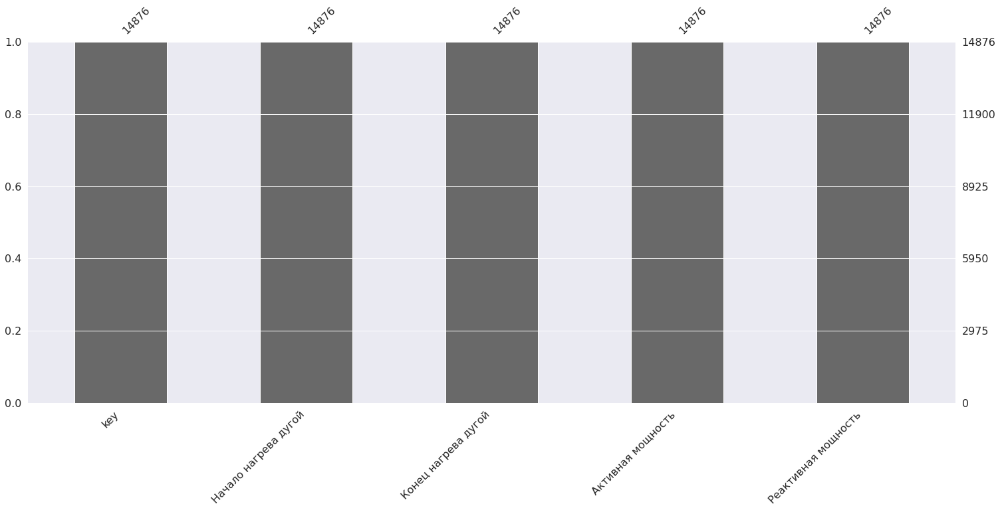

In [10]:
first_look(data_arc)

⠀**Таблица `steel.data_arc`**
* `key` — номер партии;
* `BeginHeat` — время начала нагрева;
* `EndHeat` — время окончания нагрева;
* `ActivePower` — значение активной мощности;
* `ReactivePower` — значение реактивной мощности.

---
<font size="3">
    
> **Таблица data_bulk**

Первые 5 строк:


,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,NaN,NaN,NaN,43.000,None,None,None,None,None,None,None,206.0,None,150.0,154.0
1,2,NaN,NaN,NaN,73.000,None,None,None,None,None,None,None,206.0,None,149.0,154.0
2,3,NaN,NaN,NaN,34.000,None,None,None,None,None,None,None,205.0,None,152.0,153.0
3,4,NaN,NaN,NaN,81.000,None,None,None,None,None,None,None,207.0,None,153.0,154.0
4,5,NaN,NaN,NaN,78.000,None,None,None,None,None,None,None,203.0,None,151.0,152.0



 Тип данных:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   key      3129 non-null   int64  
 1   Bulk 1   252 non-null    float64
 2   Bulk 2   22 non-null     float64
 3   Bulk 3   1298 non-null   float64
 4   Bulk 4   1014 non-null   float64
 5   Bulk 5   77 non-null     object 
 6   Bulk 6   576 non-null    object 
 7   Bulk 7   25 non-null     object 
 8   Bulk 8   1 non-null      object 
 9   Bulk 9   19 non-null     object 
 10  Bulk 10  176 non-null    object 
 11  Bulk 11  177 non-null    object 
 12  Bulk 12  2450 non-null   object 
 13  Bulk 13  18 non-null     object 
 14  Bulk 14  2806 non-null   object 
 15  Bulk 15  2248 non-null   object 
dtypes: float64(4), int64(1), object(11)
memory usage: 391.2+ KB


None


 Полнота данных:


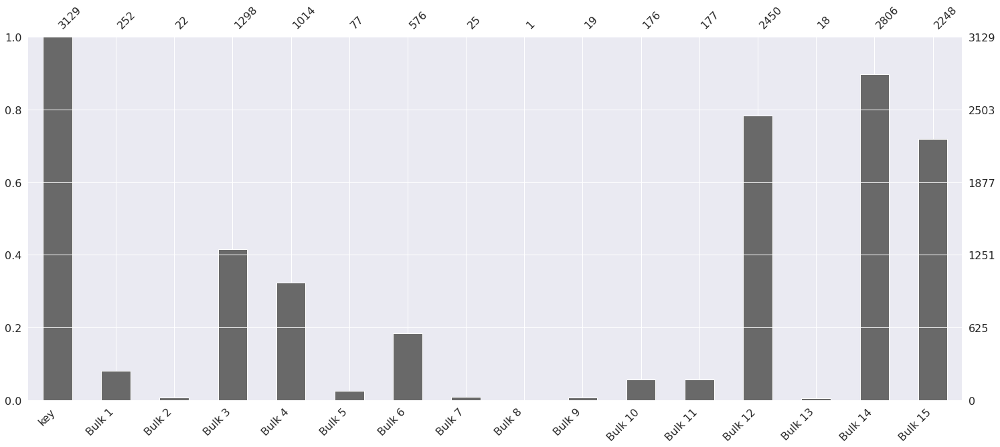

In [11]:
first_look(data_bulk)

⠀**Таблица `steel.data_bulk`**
* `key` — номер партии;
* `Bulk1` … `Bulk15` — объём подаваемого материала.

---
<font size="3">
    
> **Таблица data_bulk_time**

Первые 5 строк:


,key,Bulk 1,Bulk 2,Bulk 3,Bulk 4,Bulk 5,Bulk 6,Bulk 7,Bulk 8,Bulk 9,Bulk 10,Bulk 11,Bulk 12,Bulk 13,Bulk 14,Bulk 15
0,1,None,None,None,2019-05-03 11:28:48,None,None,None,None,None,None,None,2019-05-03 11:24:31,None,2019-05-03 11:14:50,2019-05-03 11:10:43
1,2,None,None,None,2019-05-03 11:36:50,None,None,None,None,None,None,None,2019-05-03 11:53:30,None,2019-05-03 11:48:37,2019-05-03 11:44:39
2,3,None,None,None,2019-05-03 12:32:39,None,None,None,None,None,None,None,2019-05-03 12:27:13,None,2019-05-03 12:21:01,2019-05-03 12:16:16
3,4,None,None,None,2019-05-03 12:43:22,None,None,None,None,None,None,None,2019-05-03 12:58:00,None,2019-05-03 12:51:11,2019-05-03 12:46:36
4,5,None,None,None,2019-05-03 13:30:47,None,None,None,None,None,None,None,2019-05-03 13:30:47,None,2019-05-03 13:34:12,2019-05-03 13:30:47



 Тип данных:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   key      3129 non-null   int64 
 1   Bulk 1   252 non-null    object
 2   Bulk 2   22 non-null     object
 3   Bulk 3   1298 non-null   object
 4   Bulk 4   1014 non-null   object
 5   Bulk 5   77 non-null     object
 6   Bulk 6   576 non-null    object
 7   Bulk 7   25 non-null     object
 8   Bulk 8   1 non-null      object
 9   Bulk 9   19 non-null     object
 10  Bulk 10  176 non-null    object
 11  Bulk 11  177 non-null    object
 12  Bulk 12  2450 non-null   object
 13  Bulk 13  18 non-null     object
 14  Bulk 14  2806 non-null   object
 15  Bulk 15  2248 non-null   object
dtypes: int64(1), object(15)
memory usage: 391.2+ KB


None


 Полнота данных:


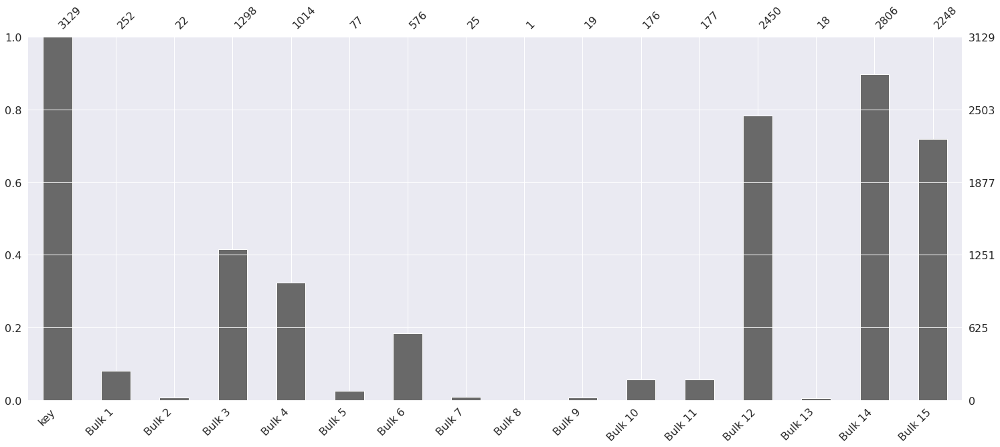

In [12]:
first_look(data_bulk_time)

⠀**Таблица `steel.data_bulk_time`**
* `key` — номер партии;
* `Bulk1` … `Bulk15` — время подачи материала.

---
<font size="3">
    
> **Таблица data_gas**

Первые 5 строк:


,key,Газ 1
0,1,29.750
1,2,12.556
2,3,28.555
3,4,18.841
4,5,5.414



 Тип данных:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3239 entries, 0 to 3238
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3239 non-null   int64  
 1   Газ 1   3239 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 50.7 KB


None


 Полнота данных:


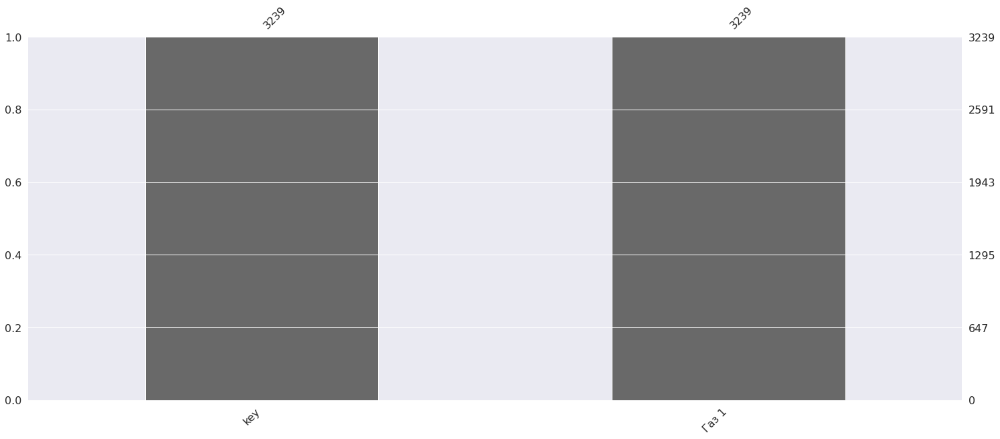

In [13]:
first_look(data_gas)

⠀**Таблица `steel.data_gas`**
* `key` — номер партии;
* `gas` — объём подаваемого газа.

---
<font size="3">
    
> **Таблица data_temp**

Первые 5 строк:


,key,Время замера,Температура
0,1,2019-05-03 11:02:04,1571.0
1,1,2019-05-03 11:07:18,1604.0
2,1,2019-05-03 11:11:34,1618.0
3,1,2019-05-03 11:18:04,1601.0
4,1,2019-05-03 11:25:59,1606.0



 Тип данных:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18092 entries, 0 to 18091
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   key           18092 non-null  int64 
 1   Время замера  18092 non-null  object
 2   Температура   14665 non-null  object
dtypes: int64(1), object(2)
memory usage: 424.2+ KB


None


 Полнота данных:


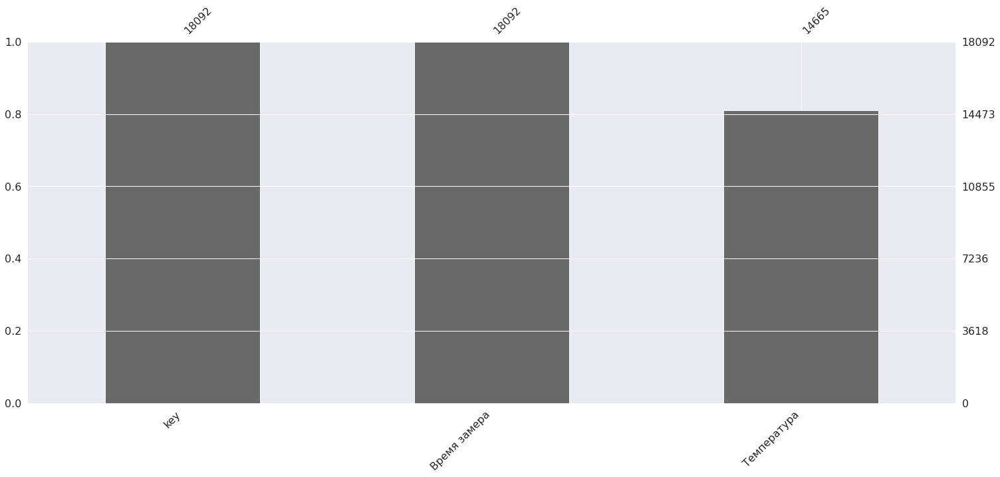

In [14]:
first_look(data_temp)

⠀**Таблица `steel.data_temp`**
* `key` — номер партии;
* `MesaureTime` — время замера;
* `Temperature` — значение температуры.

---
<font size="3">
    
> **Таблица data_wire**

Первые 5 строк:


,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,60.060,None,None,None,None,None,None,None,None
1,2,96.052,None,None,None,None,None,None,None,None
2,3,91.160,None,None,None,None,None,None,None,None
3,4,89.064,None,None,None,None,None,None,None,None
4,5,89.238,9.11456,None,None,None,None,None,None,None



 Тип данных:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3081 non-null   int64  
 1   Wire 1  3055 non-null   float64
 2   Wire 2  1079 non-null   object 
 3   Wire 3  63 non-null     object 
 4   Wire 4  14 non-null     object 
 5   Wire 5  1 non-null      object 
 6   Wire 6  73 non-null     object 
 7   Wire 7  11 non-null     object 
 8   Wire 8  19 non-null     object 
 9   Wire 9  29 non-null     object 
dtypes: float64(1), int64(1), object(8)
memory usage: 240.8+ KB


None


 Полнота данных:


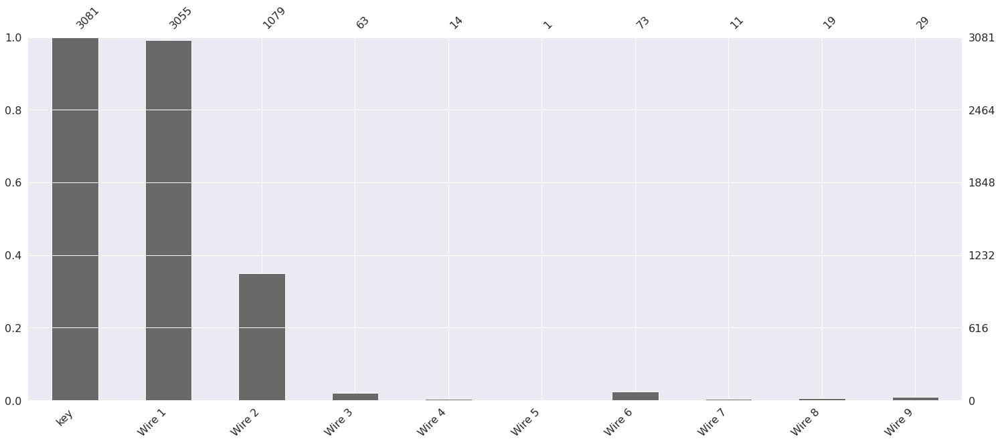

In [15]:
first_look(data_wire)

⠀**Таблица `steel.data_wire`**
* `key` — номер партии;
* `Wire1` … `Wire9` — объём подаваемых проволочных материалов.

---
<font size="3">
    
> **Таблица data_wire_time**

Первые 5 строк:


,key,Wire 1,Wire 2,Wire 3,Wire 4,Wire 5,Wire 6,Wire 7,Wire 8,Wire 9
0,1,2019-05-03 11:06:19,None,None,None,None,None,None,None,None
1,2,2019-05-03 11:36:50,None,None,None,None,None,None,None,None
2,3,2019-05-03 12:11:46,None,None,None,None,None,None,None,None
3,4,2019-05-03 12:43:22,None,None,None,None,None,None,None,None
4,5,2019-05-03 13:20:44,2019-05-03 13:15:34,None,None,None,None,None,None,None



 Тип данных:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   key     3081 non-null   int64 
 1   Wire 1  3055 non-null   object
 2   Wire 2  1079 non-null   object
 3   Wire 3  63 non-null     object
 4   Wire 4  14 non-null     object
 5   Wire 5  1 non-null      object
 6   Wire 6  73 non-null     object
 7   Wire 7  11 non-null     object
 8   Wire 8  19 non-null     object
 9   Wire 9  29 non-null     object
dtypes: int64(1), object(9)
memory usage: 240.8+ KB


None


 Полнота данных:


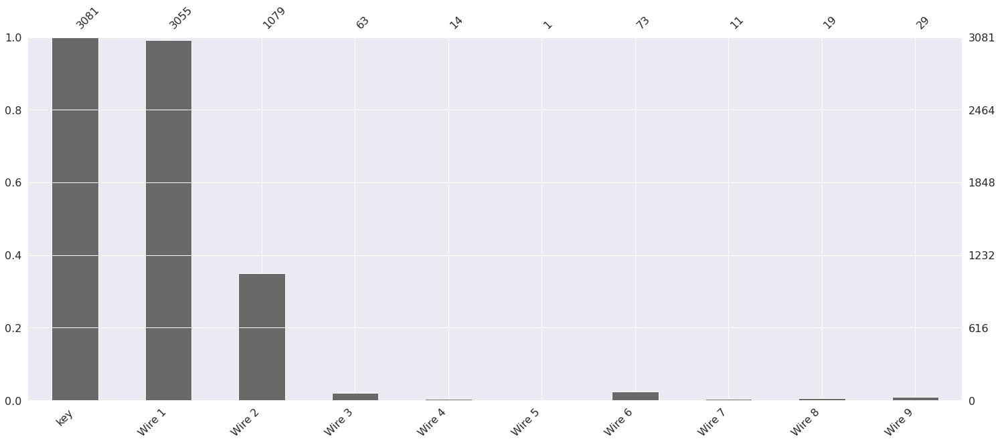

In [16]:
first_look(data_wire_time)

⠀**Таблица `steel.data_wire_time`**
* `key` — номер партии;
* `Wire1` … `Wire9` — время подачи проволочных материалов.

<font size="3">
    
**Вывод**
    
Для проведения исследования получены следующие данные:

* `data_arc` — данные об электродах;
* `data_bulk` — данные об объёме сыпучих материалов;
* `data_bulk_time` — данные о времени подачи сыпучих материалов;
* `data_gas` — данные о продувке сплава газом;
* `data_temp` — данные об измерениях температуры;
* `data_wire` — данные об объёме проволочных материалов;
* `data_wire_time` — данные о времени подачи проволочных материалов.

Известно, что во всех датафреймах столбец `key` содержит номер партии. В таблицах может быть несколько строк с одинаковым значением `key`: они соответствуют разным итерациям обработки.    
    
Во всех таблицах необходимо переименовать столбцы для удобства последующей обработки, а также подробнее изучить пропущенные значения. 
    
Предварительно можно отметить, что количество записей об объёме и времени подачи совпадает как для сыпучих, так и проволочных материалов.
    
Предварительно можно утверждать, что данных достаточно для проведения исследования.

<hr style="width: 100%; height: 2px; background-color: #99b9b6;">

## Анализ и обработка данных

<font size="3"> Изучим подробнее полученные данные.

### Именование столбцов


<font size="3"> Прежде всего приведём названия столбцов датафреймов к нижнему регистру и к `snake case` для удобства последующего изучения данных. 

In [17]:
# функция исправления именования столбцов
def clean_column_names(df):
    df.columns = [
        re.sub(r'\s+', '_', column).lower()
        for column in df.columns
    ]
    print(df.columns) # проверим результат
    return df

In [18]:
# применим функцию к каждому датафрейму
dataframes = [clean_column_names(df) for df in dataframes]

Index(['key', 'начало_нагрева_дугой', 'конец_нагрева_дугой',
       'активная_мощность', 'реактивная_мощность'],
      dtype='object')
Index(['key', 'bulk_1', 'bulk_2', 'bulk_3', 'bulk_4', 'bulk_5', 'bulk_6',
       'bulk_7', 'bulk_8', 'bulk_9', 'bulk_10', 'bulk_11', 'bulk_12',
       'bulk_13', 'bulk_14', 'bulk_15'],
      dtype='object')
Index(['key', 'bulk_1', 'bulk_2', 'bulk_3', 'bulk_4', 'bulk_5', 'bulk_6',
       'bulk_7', 'bulk_8', 'bulk_9', 'bulk_10', 'bulk_11', 'bulk_12',
       'bulk_13', 'bulk_14', 'bulk_15'],
      dtype='object')
Index(['key', 'газ_1'], dtype='object')
Index(['key', 'время_замера', 'температура'], dtype='object')
Index(['key', 'wire_1', 'wire_2', 'wire_3', 'wire_4', 'wire_5', 'wire_6',
       'wire_7', 'wire_8', 'wire_9'],
      dtype='object')
Index(['key', 'wire_1', 'wire_2', 'wire_3', 'wire_4', 'wire_5', 'wire_6',
       'wire_7', 'wire_8', 'wire_9'],
      dtype='object')


<font size="3"> Столбцы датафреймов именованы корректно.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

### Таблица `data_arc`

<font size="3"> Изучим подробнее таблицу, содержащую данные об электродах.

<font size="4">
    
#### Тип данных

In [19]:
data_arc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   key                   14876 non-null  int64  
 1   начало_нагрева_дугой  14876 non-null  object 
 2   конец_нагрева_дугой   14876 non-null  object 
 3   активная_мощность     14876 non-null  float64
 4   реактивная_мощность   14876 non-null  float64
dtypes: float64(2), int64(1), object(2)
memory usage: 581.2+ KB


<font size="3"> Приведём столбцы `начало_нагрева_дугой` и `конец_нагрева_дугой` к формату **datetime**.

In [20]:
# преобразуем 'начало_нагрева_дугой' и 'конец_нагрева_дугой' в формат datetime
data_arc['начало_нагрева_дугой'] = pd.to_datetime(data_arc['начало_нагрева_дугой'])
data_arc['конец_нагрева_дугой'] = pd.to_datetime(data_arc['конец_нагрева_дугой'])

In [21]:
# проверим результат
data_arc.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14876 entries, 0 to 14875
Data columns (total 5 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   key                   14876 non-null  int64         
 1   начало_нагрева_дугой  14876 non-null  datetime64[ns]
 2   конец_нагрева_дугой   14876 non-null  datetime64[ns]
 3   активная_мощность     14876 non-null  float64       
 4   реактивная_мощность   14876 non-null  float64       
dtypes: datetime64[ns](2), float64(2), int64(1)
memory usage: 581.2 KB


<font size="3"> Все столбцы датафрейма содержат корректный тип данных.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">
    
#### Проверка пропусков

<font size="3"> Гистограммы `msno` показали наличие пропущенных значений в датафреймах, изучим их подробнее.

In [22]:
# функция подсчёта пропущенных значений
def missing_count(df):
    # считаем кол-во пропусков в каждом столбце
    display(df.isna().sum())
    
    # считаем кол-во пропусков в процентах
    for col in df.columns:
        pct_missing = np.mean(df[col].isnull())
        print('{} - {}%'.format(col, round(pct_missing*100)))

In [23]:
missing_count(data_arc)

key                     0
начало_нагрева_дугой    0
конец_нагрева_дугой     0
активная_мощность       0
реактивная_мощность     0
dtype: int64

key - 0%
начало_нагрева_дугой - 0%
конец_нагрева_дугой - 0%
активная_мощность - 0%
реактивная_мощность - 0%


<font size="3"> Пропущенные значения отсутствуют.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">

#### Проверка дубликатов

<font size="3"> Проверим наличие дубликатов в датафрейме.

In [24]:
print(f'Количество дубликатов в датафрейме: {data_arc.duplicated().sum()}')

Количество дубликатов в датафрейме: 0


<font size="3"> Явные дубликаты отсутствуют.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">

#### Исследовательский анализ данных

<font size="3"> Проведём исследовательский анализ всех признаков датафрейма.

<font size="3"> **Количественные признаки**

Напишем функцию `visuals`, которая построит гистограмму распределения, коробчатую диаграмму и выведет метод `describe()`:

In [25]:
def visuals(df, feature):    
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(12,6), dpi=PLOT_DPI)
    
    display(df[feature].describe())
    
    df[feature].plot(kind='hist', bins=30, ax=axes[0])
    axes[0].set_title(f'Гистограмма распределения признака \n {feature}', fontsize=14)
    axes[0].set_ylabel('Частота встречаемости', fontweight='bold')
    axes[0].set_xlabel('Наблюдаемые значения', fontweight='bold')
    
    df[feature].plot(kind='box', ax=axes[1], rot=0)
    axes[1].set_title(f'Разброс значений признака \n {feature}', fontsize=14)
    axes[1].set_xlabel('Признак', fontweight='bold')
    axes[1].set_ylabel('Наблюдаемые значения', fontweight='bold')
    
    plt.tight_layout()
    plt.show()

<font size="3">
    
- Признак **активная_мощность**

count   14,876.000
mean         0.663
std          0.259
min          0.223
25%          0.467
50%          0.600
75%          0.830
max          1.464
Name: активная_мощность, dtype: float64

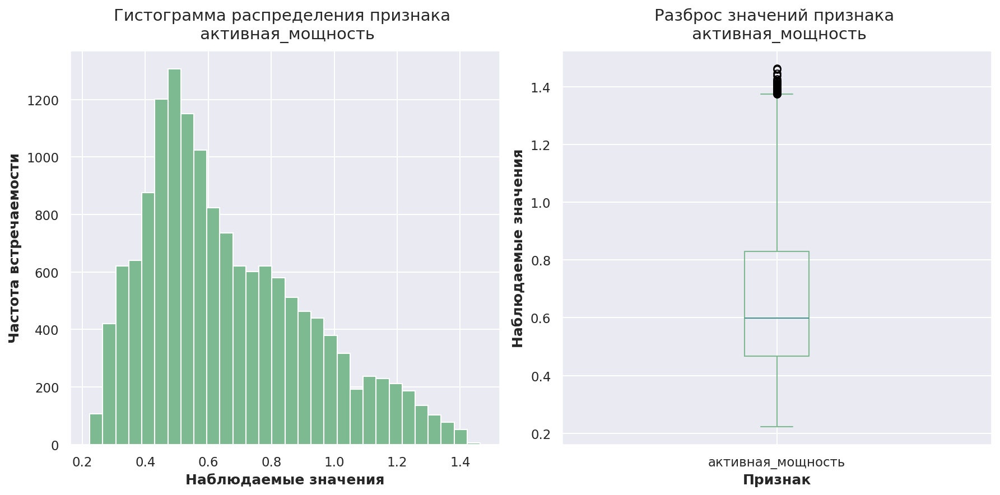

In [26]:
visuals(data_arc, 'активная_мощность')

<font size="3">
    
**Вывод**

Признак `активная_мощность` - значение активной мощности. 
    
Распределение признака асимметрично вправо с небольшим хвостом, среднее значение больше, чем медиана. 
    
Большинство значений располагается в промежутке от **0.467 до 0.830**, пик находится в районе **0.5** с довольно плавным затуханием.
    
Стандартное отклонение составляет **0.259**, что указывает на умеренный разброс значений относительно среднего.
    
Можно заключить, что значения мощности выглядят разумными, учитывая, что мощность, скорее всего, поддерживается на определённом уровне, чтобы не допустить перегрева или недогрева стали.

<font size="3">
    
- Признак **реактивная_мощность**

count   14,876.000
mean         0.439
std          5.873
min       -715.480
25%          0.337
50%          0.442
75%          0.608
max          1.270
Name: реактивная_мощность, dtype: float64

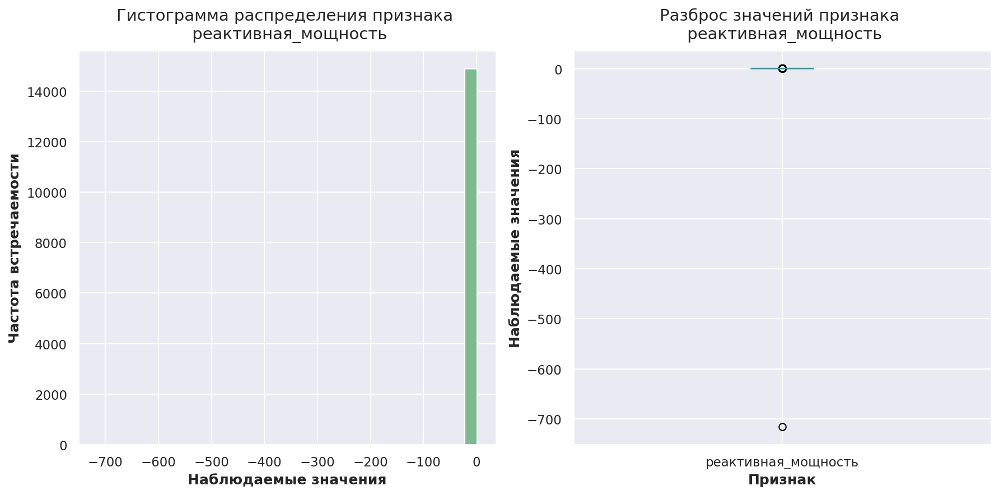

In [27]:
visuals(data_arc, 'реактивная_мощность')

<font size="3"> Визуализация показывает наличие аномалий, выбивающихся из распределения. Проверим количество отрицательных значений реактивной мощности в выборке: 

In [28]:
data_arc[data_arc['реактивная_мощность'] <= 0]

,key,начало_нагрева_дугой,конец_нагрева_дугой,активная_мощность,реактивная_мощность
9780,2116,2019-07-28 02:22:08,2019-07-28 02:23:57,0.705,-715.480


<font size="3"> Только один объект имеет аномальное значение.
    
Поскольку активная и реактивная мощности — два компонента мощности, потребляемой во время нагрева стали, можно предположить, что их значения изменяются согласованно. Для выявления монотонной зависимости между признаками построим диаграмму рассеяния и вычислим корреляцию методом Спирмана.
    
<br> Если активная и реактивная мощности действительно связаны, рассчитаем соотношение между ними, используя похожие наблюдения, чтобы вычислить пропущенное значение.

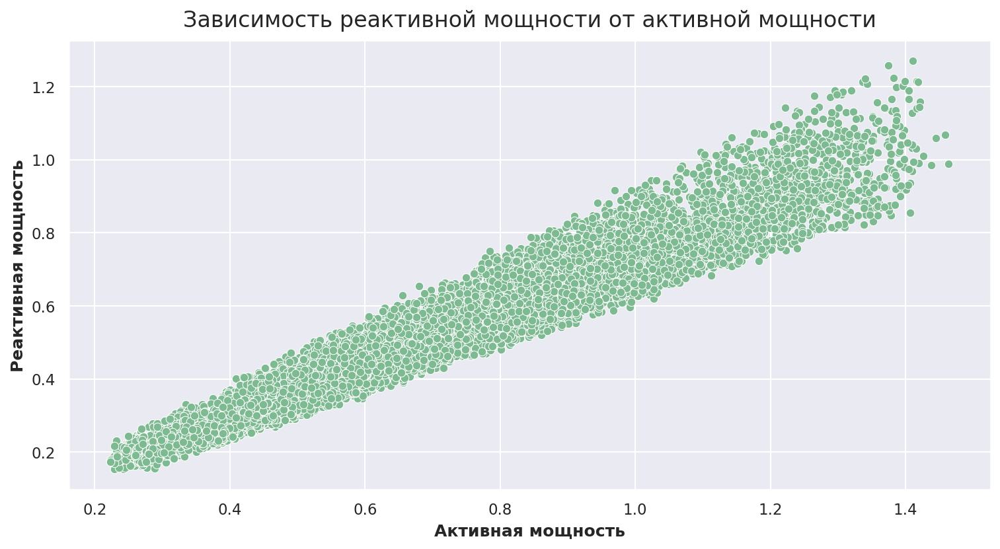

In [29]:
plt.figure(figsize=(12, 6), dpi=PLOT_DPI)
sns.scatterplot(
    data=data_arc.query("реактивная_мощность > 0"), # исключим аномалию
    x="активная_мощность",
    y="реактивная_мощность",
)
plt.title('Зависимость реактивной мощности от активной мощности')
plt.xlabel('Активная мощность')
plt.ylabel('Реактивная мощность')
plt.show();

In [30]:
# корреляция между реактивной и активной мощностью
data_arc[['активная_мощность', 'реактивная_мощность']].corr(method='spearman')

,активная_мощность,реактивная_мощность
активная_мощность,1.000,0.971
реактивная_мощность,0.971,1.000


<font size="3"> Визуализация показывает довольно сильную линейную зависимость признаков: большим значениям активной мощности соответствуют большие значения реактивной мощности.
    
Значение корреляции Спирмана в 0.971 подтверждает, что признаки имеют монотонную линейную зависимость, а значит можно использовать активную мощность для оценки недостающего значения реактивной.
    
<br> Вычислим отношение реактивной мощности к активной и используем данный показатель для корректировки выбивающегося значения.

In [31]:
# вычисляем средний коэффициент отношения реактивной мощности к активной
ratio_mean = (
    data_arc.query("реактивная_мощность > 0")["реактивная_мощность"] # исключаем аномалию
    / data_arc.query("реактивная_мощность > 0")["активная_мощность"]
).mean()

print(f'Cредний коэффициент отношения реактивной мощности к активной: {ratio_mean}')

Cредний коэффициент отношения реактивной мощности к активной: 0.7349235684961124


<font size="3"> Согласно расчётам, в среднем реактивная мощность составляет 0.73 от активной. Используем данное значение для замены выбивающегося. Таким образом удаётся сохранить согласованность данных и получить близкое к реальности значение.

In [32]:
# заменим аномальное значение на расчётное
data_arc.loc[data_arc["реактивная_мощность"] < 0, "реактивная_мощность"] = (
    data_arc["активная_мощность"] * ratio_mean
)

<font size="3"> Изучим повторно распределение признака. 

count   14,876.000
mean         0.487
std          0.198
min          0.154
25%          0.337
50%          0.442
75%          0.608
max          1.270
Name: реактивная_мощность, dtype: float64

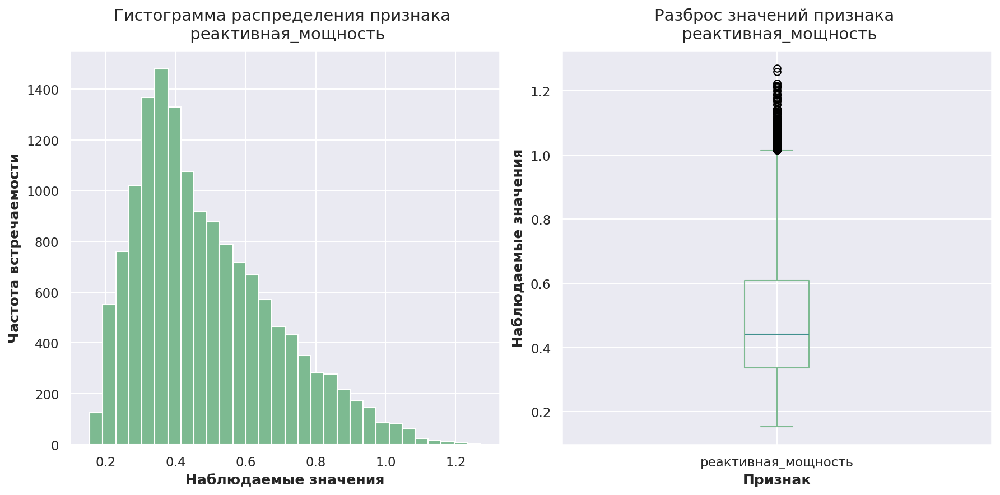

In [33]:
visuals(data_arc, 'реактивная_мощность')

<font size="3">
    
**Вывод**

Признак `реактивная_мощность` - значение реактивной мощности. 
    
Распределение признака асимметрично вправо с небольшим хвостом, среднее значение больше, чем медиана. 
    
Большинство значений располагается в промежутке от **0.337 до 0.608**, пик находится в районе **0.35** с довольно плавным затуханием.
    
Стандартное отклонение составляет **0.198**, что указывает на умеренный разброс значений относительно среднего.
    
Также не наблюдается резких скачков или "разрывов" в распределении признака, что указывает на отсутствие значимых выбросов.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> 
    
Отлично, что обработано наблюдение с отрицательной реактивной мощностью

<hr style="width: 100%; height: 1.5px; background-color: #99b9b6;">

<font size="3"> **Категориальные признаки**

<font size="3"> Для категориального признака `key` убедимся, что:
- время окончания нагрева всегда наступает после времени его начала;
- начало следующего нагрева всегда наступает после завершения предыдущего.

<font size="3">
    
- **Проверка начала и окончания нагрева для каждой партии**

In [34]:
# получим записи, где `конец_нагрева_дугой` наступил раньше `начало_нагрева_дугой`
incorrect_time_order = data_arc[data_arc['конец_нагрева_дугой'] <= data_arc['начало_нагрева_дугой']]

if incorrect_time_order.empty:
    print('Данные временных признаков корректны')
else:
    print('Найдены аномальные сочетания временных признаков')
    display(incorrect_time_order)

Данные временных признаков корректны


<font size="3">
    
**Вывод**
    
Временные признаки каждой партии корректны.

<font size="3">
    
- **Проверка начала следующего нагрева для каждой партии**

In [35]:
# рассчитаем время между каждым этапом нагрева в пределах одной партии
data_arc['время_между_нагревами'] = data_arc.groupby('key')['начало_нагрева_дугой'].transform(lambda x: x - x.shift(1))

# проверим наличие отрицательных значений, что может указывать на неправильный порядок нагревов
incorrect_time_between = data_arc[data_arc['время_между_нагревами'] < pd.Timedelta(0)]

# проверим результат
if incorrect_time_between.empty:
    print('Данные временных признаков корректны: начало следующего нагрева после окончания предыдущего')
else:
    print('Найдены аномальные сочетания временных признаков (отрицательное время между нагревами)')
    display(incorrect_time_between[['key', 'начало_нагрева_дугой', 'время_между_нагревами']])

Данные временных признаков корректны: начало следующего нагрева после окончания предыдущего


In [36]:
# добавим в выборку признак `время_между_нагревами`
data_arc['время_между_нагревами'] = data_arc['время_между_нагревами'].dt.total_seconds()

<font size="3">
    
**Вывод**
    
В рамках каждой партии начало нагрева происходит только после окончания предыдущего нагрева. Созданный признак `время_между_нагревами` используем в дальнейшем анализе.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">

#### Добавление признаков

<font size="3"> Для задачи предсказания температуры плавления стали полезными могут быть следующие признаки:
- **Время нагрева электродами для каждого технологического цикла** (`продолжительность_нагрева`) – логично предположить, что время нагрева влияет на достижение нужной температуры;
- **Соотношение активной и реактивной мощности** (`отношение_мощностей`) – соотношение покажет, насколько эффективно используется активная мощность по сравнению с реактивной, что может помочь понять особенности процесса нагрева;
- **Число нагревов металла в рамках партии** (`количество_нагревов`) – получим общее количество нагревов металла в рамках одной партии, что может помочь оценить, сколько раз металл происходил процесс нагрева и насколько интенсивно на него воздействовали;
- **Промежуток времени между нагревами в рамках партии** (`время_между_нагревами`) – может дополнить информацию о том, насколько быстро или медленно происходит нагрев в рамках одного технологического цикла;
- **Импульс нагрева** (`энергия`) – может быть полезен для оценки того, сколько энергии было передано в металл, что потенциально напрямую влияет на температуру.

<hr style="width: 100%; height: 1px; background-color: #ccceaf;">

<font size="3">
    
- **Время нагрева электродами для каждого технологического цикла**

<font size="3"> Нам уже известно, что в ходе обработки одной партии может применяться несколько интервалов нагрева.  
    
Создадим столбец `продолжительность_нагрева`, в котором рассчитаем время для каждого интервала в секундах, что поможет обнаружить слишком короткие нагревы (когда, возможно, процесс был прерван или не завершен) или слишком долгие нагревы (когда процесс мог выйти за пределы нормы).

In [37]:
# добавим длительность каждого нагрева
data_arc["продолжительность_нагрева"] = (
    data_arc["конец_нагрева_дугой"] - data_arc["начало_нагрева_дугой"]
).dt.total_seconds()

In [38]:
# проверим результат
data_arc.sample(5, random_state=SEED)

,key,начало_нагрева_дугой,конец_нагрева_дугой,активная_мощность,реактивная_мощность,время_между_нагревами,продолжительность_нагрева
14532,3162,2019-09-03 20:02:55,2019-09-03 20:04:26,0.753,0.615,459.000,91.000
10455,2271,2019-08-02 03:48:37,2019-08-02 03:50:08,0.889,0.791,470.000,91.000
5266,1143,2019-06-16 02:19:42,2019-06-16 02:27:42,0.503,0.363,330.000,480.000
5539,1203,2019-06-18 01:36:28,2019-06-18 01:37:38,0.511,0.326,127.000,70.000
13344,2902,2019-08-25 19:07:15,2019-08-25 19:08:32,0.446,0.320,384.000,77.000


<font size="3"> Исследуем полученный признак: 

count   14,876.000
mean       171.671
std         98.187
min         11.000
25%        107.000
50%        147.000
75%        214.000
max        907.000
Name: продолжительность_нагрева, dtype: float64

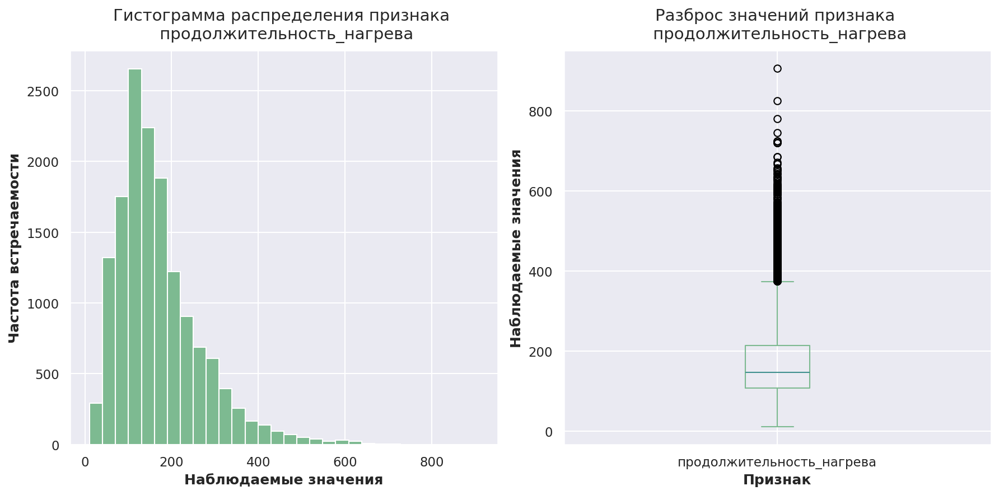

In [39]:
visuals(data_arc, 'продолжительность_нагрева')

<font size="3">
    
**Вывод**

Признак `продолжительность_нагрева` - длительность каждого интервала нагрева в каждой партии.
    
Большинство значений располагается в промежутке от **107** до **214**, пик находится в районе 160 секунд.

Стандартное отклонение составляет **98** секунд, что указывает на значительную вариативность в данных.
    
Можно отметить, что максимальное время нагрева (**907**) сильно удалено от 75% квартиля (**214**), что говорит о наличии выбивающихся значений. Такие длительные нагревы, вероятно, могут быть связаны с такими факторами как, например, тип и количество добавленного сырья.

<hr style="width: 100%; height: 1px; background-color: #ccceaf;">

<font size="3">
    
- **Соотношение активной и реактивной мощности**

<font size="3"> Рассчитывая соотношение активной и реактивной мощности для каждого интервала нагрева, мы получаем более детализированное представление об эффективности нагрева на каждом этапе. 
    
Это может быть полезно, потому что:

  - активная мощность отвечает за непосредственно выделяемое тепло, которое влияет на температуру плавления;
  - реактивная мощность не влияет на нагрев, но говорит о технологических особенностях процесса.

Можно предположить, что данный признак будет полезен для предсказания температуры плавления, так как эффективность нагрева может быть связана с тем, насколько равномерно и быстро нагревается металл.

In [40]:
# добавим признак в выборку
data_arc['отношение_мощностей'] = data_arc["активная_мощность"] / data_arc["реактивная_мощность"] 

In [41]:
# проверим результат
data_arc.sample(5, random_state=SEED)

,key,начало_нагрева_дугой,конец_нагрева_дугой,активная_мощность,реактивная_мощность,время_между_нагревами,продолжительность_нагрева,отношение_мощностей
14532,3162,2019-09-03 20:02:55,2019-09-03 20:04:26,0.753,0.615,459.000,91.000,1.224
10455,2271,2019-08-02 03:48:37,2019-08-02 03:50:08,0.889,0.791,470.000,91.000,1.124
5266,1143,2019-06-16 02:19:42,2019-06-16 02:27:42,0.503,0.363,330.000,480.000,1.385
5539,1203,2019-06-18 01:36:28,2019-06-18 01:37:38,0.511,0.326,127.000,70.000,1.566
13344,2902,2019-08-25 19:07:15,2019-08-25 19:08:32,0.446,0.320,384.000,77.000,1.393


<font size="3"> Исследуем рапределение признака:

count   14,876.000
mean         1.373
std          0.131
min          1.002
25%          1.280
50%          1.380
75%          1.471
max          1.857
Name: отношение_мощностей, dtype: float64

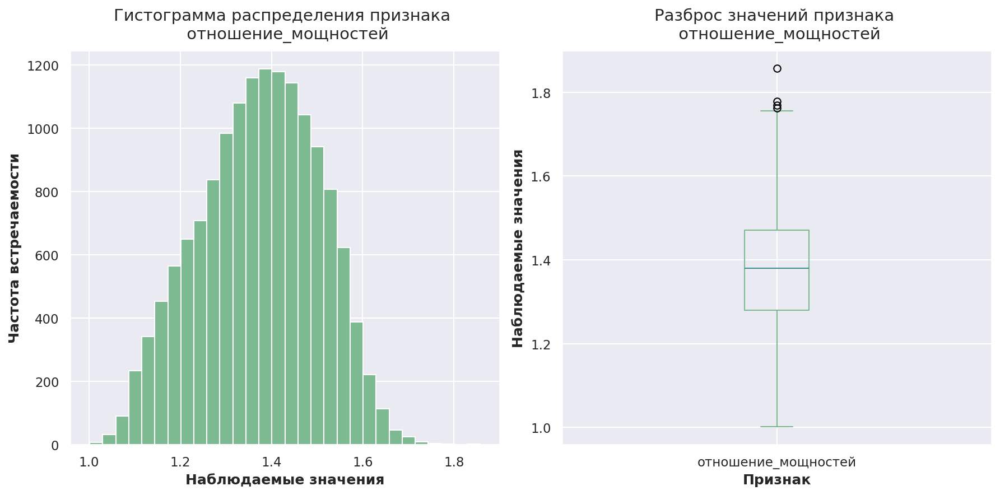

In [42]:
visuals(data_arc, 'отношение_мощностей')

<font size="3">
    
**Вывод**

Признак `отношение_мощностей` - соотношение активной и реактивной мощности для каждого интервала нагрева.
    
Признак имеет нормальное распределение, большинство значений располагается в промежутке от **1.280** до **1.471**, пик находится в районе 1.4.

Стандартное отклонение составляет **0.131**, что указывает на достаточно малый разброс значений относительно среднего, что может свидетельствовать о стабильности процесса.
    
Выбросы и аномалии в данных отсутствуют.

<hr style="width: 100%; height: 1px; background-color: #ccceaf;">

<font size="3">
    
- **Число нагревов металла рамках партии**

<font size="3"> 
    
Количество нагревов может дать представление о сложности технологического процесса, добавим его в выборку. 

In [43]:
# добавим количество нагревов в партии
data_arc['количество_нагревов'] = data_arc.groupby('key')['key'].transform('count')

In [44]:
# проверим результат
data_arc.sample(5, random_state=SEED)

,key,начало_нагрева_дугой,конец_нагрева_дугой,активная_мощность,реактивная_мощность,время_между_нагревами,продолжительность_нагрева,отношение_мощностей,количество_нагревов
14532,3162,2019-09-03 20:02:55,2019-09-03 20:04:26,0.753,0.615,459.000,91.000,1.224,6
10455,2271,2019-08-02 03:48:37,2019-08-02 03:50:08,0.889,0.791,470.000,91.000,1.124,3
5266,1143,2019-06-16 02:19:42,2019-06-16 02:27:42,0.503,0.363,330.000,480.000,1.385,6
5539,1203,2019-06-18 01:36:28,2019-06-18 01:37:38,0.511,0.326,127.000,70.000,1.566,8
13344,2902,2019-08-25 19:07:15,2019-08-25 19:08:32,0.446,0.320,384.000,77.000,1.393,8


<font size="3"> Изучим рапределение полученного признака:

count   14,876.000
mean         5.187
std          1.750
min          1.000
25%          4.000
50%          5.000
75%          6.000
max         16.000
Name: количество_нагревов, dtype: float64

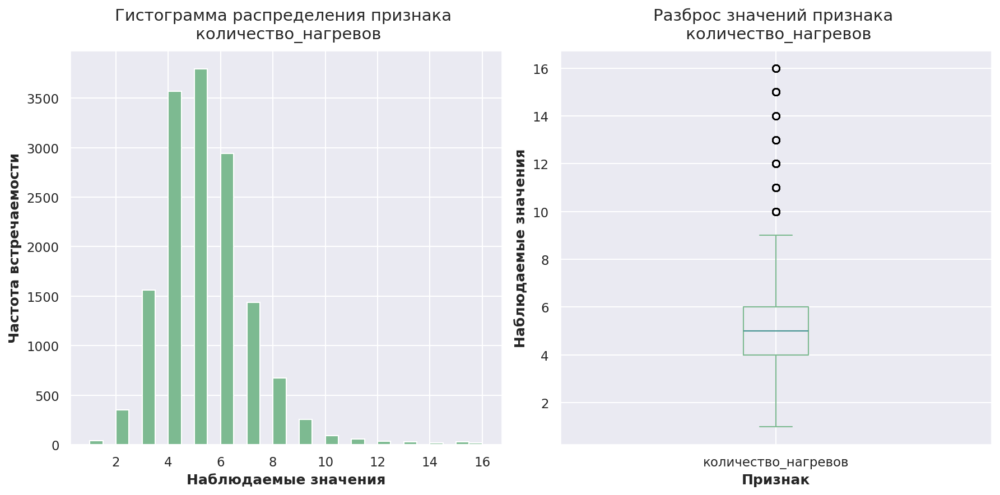

In [45]:
visuals(data_arc, 'количество_нагревов')

<font size="3">
    
**Вывод**

Признак `количество_нагревов` - количество интревалов нагрева в каждой партии.
    
Большинство значений располагается в промежутке от **4** до **6**, пик находится в районе 4 нагревов на партию.

Можно отметить, что максимальное количество нагревов (**16**) сильно удалено от 75% квартиля (**6**), что говорит о наличии выбивающихся значений. 
    
Описание процесса обработки, предоставленное заказчиком, действительно предполагает несколько этапов повышения температуры и добавления материалов, что может включать несколько циклов нагрева: 
    
> Прежде чем в первый раз ввести легирующие добавки, специалисты производят химический анализ стали и измеряют её температуру. Потом температуру на несколько минут повышают, уже после этого добавляют легирующие материалы и продувают сталь инертным газом, чтобы перемешать, а затем снова проводят измерения. Такой цикл повторяется до тех пор, пока не будут достигнуты нужный химический состав стали и оптимальная температура плавки.
    
На данном этапе исследования сохраним партии с выбивающимся количеством нагревов: если есть процессы, где партия может многократно подвергаться циклам нагрева, то такие значения могут быть технически оправданы.

<hr style="width: 100%; height: 1px; background-color: #ccceaf;">

<font size="3">
    
- **Импульс нагрева**

<font size="3"> Импульс нагрева — это энергия, которая передается в металл за время нагрева, и её можно рассчитать как произведение полной мощности на длительность нагрева. <br>Добавим столбец, который рассчитывает импульс нагрева для каждого этапа, дополнительно получим признак `полная_мощность`.

In [46]:
# рассчитаем полную мощность
data_arc['полная_мощность'] = (data_arc['активная_мощность']**2 + data_arc['реактивная_мощность']**2)**0.5

# рассчитаем импульс нагрева
data_arc['энергия'] = data_arc['полная_мощность'] * data_arc['продолжительность_нагрева']

In [47]:
# проверим результат
data_arc.sample(5, random_state=SEED)

,key,начало_нагрева_дугой,конец_нагрева_дугой,активная_мощность,реактивная_мощность,время_между_нагревами,продолжительность_нагрева,отношение_мощностей,количество_нагревов,полная_мощность,энергия
14532,3162,2019-09-03 20:02:55,2019-09-03 20:04:26,0.753,0.615,459.000,91.000,1.224,6,0.972,88.420
10455,2271,2019-08-02 03:48:37,2019-08-02 03:50:08,0.889,0.791,470.000,91.000,1.124,3,1.189,108.229
5266,1143,2019-06-16 02:19:42,2019-06-16 02:27:42,0.503,0.363,330.000,480.000,1.385,6,0.620,297.685
5539,1203,2019-06-18 01:36:28,2019-06-18 01:37:38,0.511,0.326,127.000,70.000,1.566,8,0.607,42.464
13344,2902,2019-08-25 19:07:15,2019-08-25 19:08:32,0.446,0.320,384.000,77.000,1.393,8,0.549,42.282


<font size="3"> Изучим рапределение полученных признаков:

count   14,876.000
mean         0.823
std          0.323
min          0.276
25%          0.579
50%          0.747
75%          1.030
max          1.898
Name: полная_мощность, dtype: float64

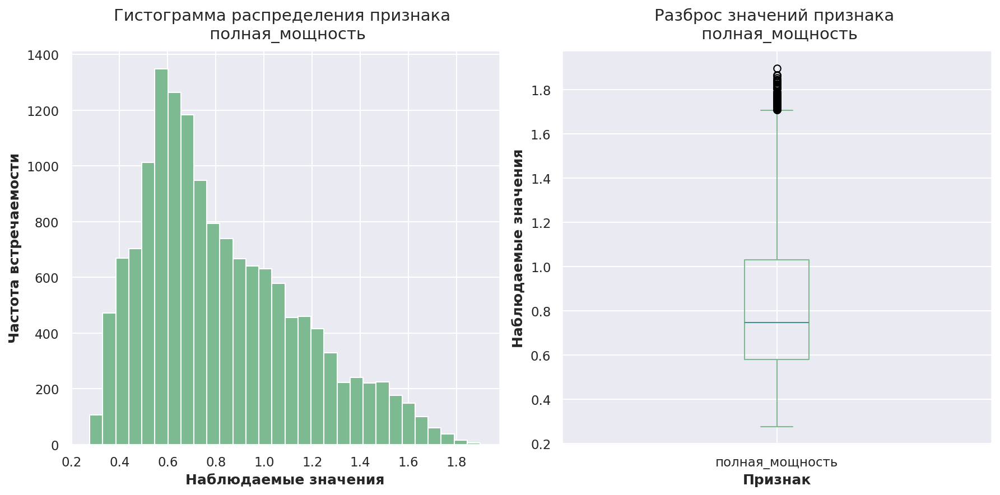

In [48]:
visuals(data_arc, 'полная_мощность')

<font size="3">
    
**Вывод**

Признак `полная_мощность` - векторальная сумма активной и реактивной мощности.
    
Распределение признака асимметрично вправо с небольшим хвостом, среднее значение больше, чем медиана.
    
Большинство значений располагается в промежутке от **0.579** до **1.030**, пик находится в районе 0.6.

Стандартное отклонение составляет **0.323**, что указывает на умеренный разброс значений относительно среднего.
    
Значимые выбросы и аномалии в данных отсутствуют.

count   14,876.000
mean       141.644
std        103.198
min          6.410
25%         71.158
50%        114.463
75%        181.346
max      1,084.729
Name: энергия, dtype: float64

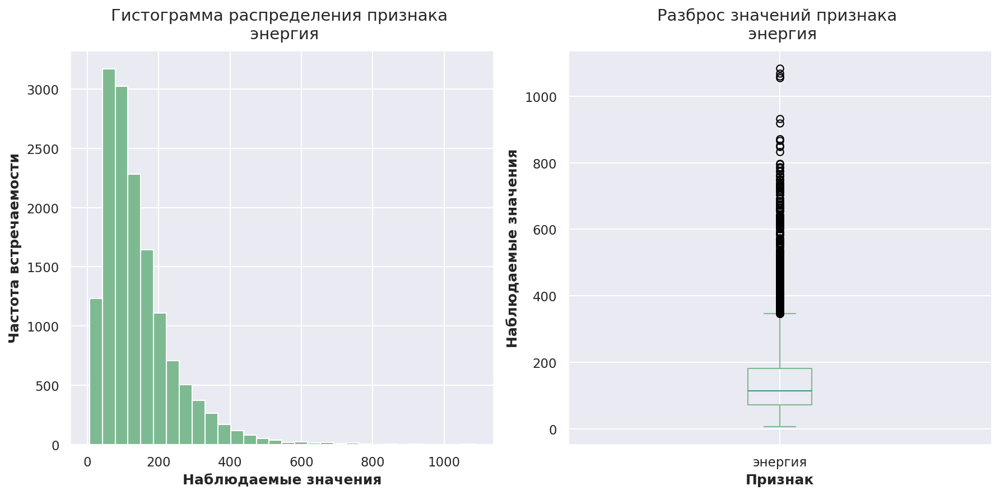

In [49]:
visuals(data_arc, 'энергия')

<font size="3">
    
**Вывод**

Признак `энергия` - энергия, которая передается в металл за время нагрева.
    
Распределение признака асимметрично вправо с длинным хвостом, среднее значение больше медианы, что может свидетельствовать о неравномерности процессов нагрева.
    
Большинство значений располагается в промежутке от **71.158** до **181.346**, пик находится в районе 50.

Стандартное отклонение составляет **103.198**, что указывает на довольно сильный разброс значений относительно среднего.
    
Можно также отметить, что максимальное значение энергии (1084) сильно удалено от 75% квартиля (181), что говорит о наличии выбивающихся значений.
    
Разброс значений в признаке связан с длительностью нагрева: чем дольше нагрев, тем больше энергии потребуется для поддержания нужной температуры. На данном этапе исследования оставим все значения в выборке: определённые группы партий или типы сырья могут требовать больших энергозатрат и длительного нагрева.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">

#### Агрегирование наблюдений

<font size="3"> Для дальнейшего исследования необходимо привести таблицу `data_arc` к виду: каждой партии должно соответствовать одно наблюдение.
    
Используем `groupby.agg` для группировки со следующими параметрами: 
- **активная_мощность** (`mean`): cреднее значение активной мощности за все периоды нагрева в одной партии позволяет понять, какая мощность в среднем использовалась;
- **реактивная_мощность** (`mean`): cреднее значение реактивной мощности также позволяет понять, какая мощность в среднем использовалась;
- **время_между_нагревами** (`sum`): сумма интервалов между нагревами даст полное время простоя между активными периодами нагрева для всей партии;
- **продолжительность_нагрева** (`sum`): сумма всех временных интервалов нагрева даст общую продолжительность нагревания партии, что полезно для анализа энергозатрат и скорости обработки;
- **отношение_мощностей** (`mean`): cреднее значение отношения активной и реактивной мощности в одной партии;
- **количество_нагревов** (`first`):  количество нагревов в каждой партии;
- **энергия** (`sum`): сумма потреблённой энергии отражает общий расход энергии на нагрев партии.

In [50]:
data_arc_agg = data_arc.groupby('key').agg({
    'активная_мощность'   : 'mean',
    'реактивная_мощность' : 'mean',
    'время_между_нагревами' : 'sum',
    'продолжительность_нагрева' : 'sum',
    'отношение_мощностей' : 'mean',
    'количество_нагревов' : 'first', 
    'полная_мощность' : 'sum', 
    'энергия' : 'sum'
    }).reset_index()

In [51]:
# проверим результат
data_arc_agg.head()

,key,активная_мощность,реактивная_мощность,время_между_нагревами,продолжительность_нагрева,отношение_мощностей,количество_нагревов,полная_мощность,энергия
0,1,0.607,0.429,"1,435.000","1,098.000",1.422,5,3.719,770.282
1,2,0.535,0.363,934.000,811.000,1.479,4,2.588,481.760
2,3,0.813,0.587,"1,460.000",655.000,1.396,5,5.019,722.838
3,4,0.677,0.514,815.000,741.000,1.307,4,3.400,683.456
4,5,0.563,0.422,"1,291.000",869.000,1.329,4,2.817,512.170


In [52]:
data_arc_agg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3214 entries, 0 to 3213
Data columns (total 9 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   key                        3214 non-null   int64  
 1   активная_мощность          3214 non-null   float64
 2   реактивная_мощность        3214 non-null   float64
 3   время_между_нагревами      3214 non-null   float64
 4   продолжительность_нагрева  3214 non-null   float64
 5   отношение_мощностей        3214 non-null   float64
 6   количество_нагревов        3214 non-null   int64  
 7   полная_мощность            3214 non-null   float64
 8   энергия                    3214 non-null   float64
dtypes: float64(7), int64(2)
memory usage: 226.1 KB


In [53]:
data_arc_agg.key.nunique()

3214

<font size="3">
    
**Вывод**
    
В результате агрерирования в таблице осталось 3214 записей, каждая соответствует уникальной партии.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

### Таблица `data_bulk`

<font size="3"> Изучим подробнее таблицу, содержащую данные об объёме сыпучих материалов.

<font size="4">
    
#### Тип данных

In [54]:
data_bulk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   key      3129 non-null   int64  
 1   bulk_1   252 non-null    float64
 2   bulk_2   22 non-null     float64
 3   bulk_3   1298 non-null   float64
 4   bulk_4   1014 non-null   float64
 5   bulk_5   77 non-null     object 
 6   bulk_6   576 non-null    object 
 7   bulk_7   25 non-null     object 
 8   bulk_8   1 non-null      object 
 9   bulk_9   19 non-null     object 
 10  bulk_10  176 non-null    object 
 11  bulk_11  177 non-null    object 
 12  bulk_12  2450 non-null   object 
 13  bulk_13  18 non-null     object 
 14  bulk_14  2806 non-null   object 
 15  bulk_15  2248 non-null   object 
dtypes: float64(4), int64(1), object(11)
memory usage: 391.2+ KB


<font size="3"> Приведём столбцы с объёмом подаваемого материала к формату **float**.

In [55]:
# преобразуем столбцы типа object в числовой формат
data_bulk.iloc[:, 1:] = data_bulk.iloc[:, 1:].apply(pd.to_numeric, errors='coerce')

In [56]:
# проверим результат
data_bulk.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   key      3129 non-null   int64  
 1   bulk_1   252 non-null    float64
 2   bulk_2   22 non-null     float64
 3   bulk_3   1298 non-null   float64
 4   bulk_4   1014 non-null   float64
 5   bulk_5   77 non-null     object 
 6   bulk_6   576 non-null    object 
 7   bulk_7   25 non-null     object 
 8   bulk_8   1 non-null      object 
 9   bulk_9   19 non-null     object 
 10  bulk_10  176 non-null    object 
 11  bulk_11  177 non-null    object 
 12  bulk_12  2450 non-null   object 
 13  bulk_13  18 non-null     object 
 14  bulk_14  2806 non-null   object 
 15  bulk_15  2248 non-null   object 
dtypes: float64(4), int64(1), object(11)
memory usage: 391.2+ KB


<font size="3"> Все столбцы датафрейма содержат корректный тип данных.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">
    
#### Проверка пропусков

<font size="3"> Гистограммы `msno` показали наличие пропущенных значений в датафреймах, изучим их подробнее.

In [57]:
missing_count(data_bulk)

key           0
bulk_1     2877
bulk_2     3107
bulk_3     1831
bulk_4     2115
bulk_5     3052
bulk_6     2553
bulk_7     3104
bulk_8     3128
bulk_9     3110
bulk_10    2953
bulk_11    2952
bulk_12     679
bulk_13    3111
bulk_14     323
bulk_15     881
dtype: int64

key - 0%
bulk_1 - 92%
bulk_2 - 99%
bulk_3 - 59%
bulk_4 - 68%
bulk_5 - 98%
bulk_6 - 82%
bulk_7 - 99%
bulk_8 - 100%
bulk_9 - 99%
bulk_10 - 94%
bulk_11 - 94%
bulk_12 - 22%
bulk_13 - 99%
bulk_14 - 10%
bulk_15 - 28%


<font size="3"> Все столбцы имеют пропущенные значения, при этом большинство признаков в выборке имеют более 50% пропусков.
    
Нам известно, что во все партии точно добавлялись сыпучие и проволочные материалы, таким образом, стоит исключить партии, где присутствует пропуск для каждого из подаваемых материалов. 

In [58]:
# отберём строки, где все значения по сыпучим материалам являются NaN
bulk_columns = data_bulk.columns[1:16]
missing_bulk_data = data_bulk[data_bulk[bulk_columns].isna().all(axis=1)]
print(missing_bulk_data)

Empty DataFrame
Columns: [key, bulk_1, bulk_2, bulk_3, bulk_4, bulk_5, bulk_6, bulk_7, bulk_8, bulk_9, bulk_10, bulk_11, bulk_12, bulk_13, bulk_14, bulk_15]
Index: []


<font size="3"> В таблице отсутствуют объекты с пропусками для каждого из подаваемых материалов.
    
Также нам известно, что наличие пропуска означает, что материал не добавляли в партию. Заменим пропуски значений в объёме подаваемого материала на **0**.

In [59]:
# заполним пропуски нулями
data_bulk.fillna(0, inplace=True)

In [60]:
# проверим результат
data_bulk.isna().sum()

key        0
bulk_1     0
bulk_2     0
bulk_3     0
bulk_4     0
bulk_5     0
bulk_6     0
bulk_7     0
bulk_8     0
bulk_9     0
bulk_10    0
bulk_11    0
bulk_12    0
bulk_13    0
bulk_14    0
bulk_15    0
dtype: int64

<font size="3"> Пропущенные значения обработаны.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">

#### Проверка дубликатов

<font size="3"> Проверим наличие дубликатов в датафрейме.

In [61]:
print(f'Количество дубликатов в датафрейме: {data_bulk.duplicated().sum()}')

Количество дубликатов в датафрейме: 0


<font size="3"> Явные дубликаты отсутствуют.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">

#### Исследовательский анализ данных

<font size="3"> Проведём исследовательский анализ всех признаков датафрейма.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="3"> **Количественные признаки**

<font size="3">
    
- Признаки **bulk_1 - bulk_15**

<font size="3"> Передадим в функцию только те строки, где объем материала больше 0, чтобы изучить распределения добавленных объёмов без влияния заполненных пропусков (материал не добавляли в партию).

count   252.000
mean     39.242
std      18.278
min      10.000
25%      27.000
50%      31.000
75%      46.000
max     185.000
Name: bulk_1, dtype: float64

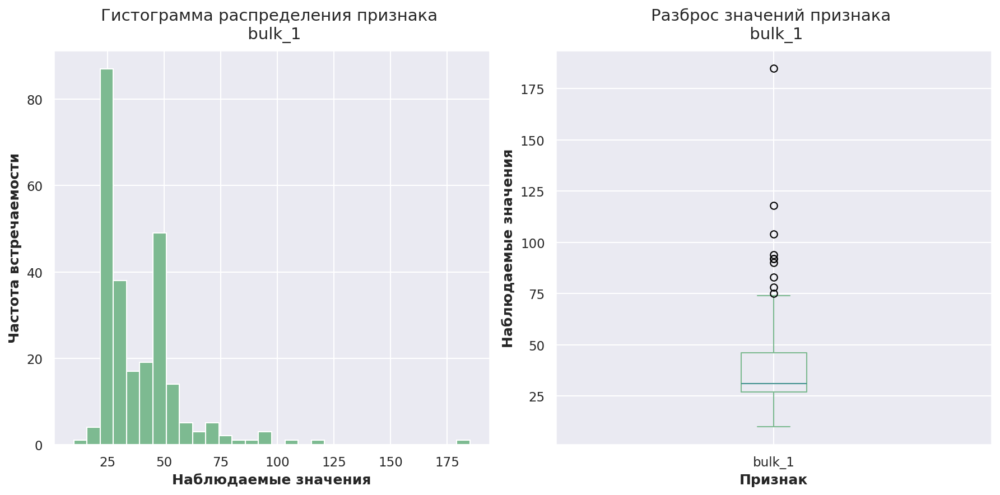

count    22.000
mean    253.045
std      21.181
min     228.000
25%     242.000
50%     251.500
75%     257.750
max     325.000
Name: bulk_2, dtype: float64

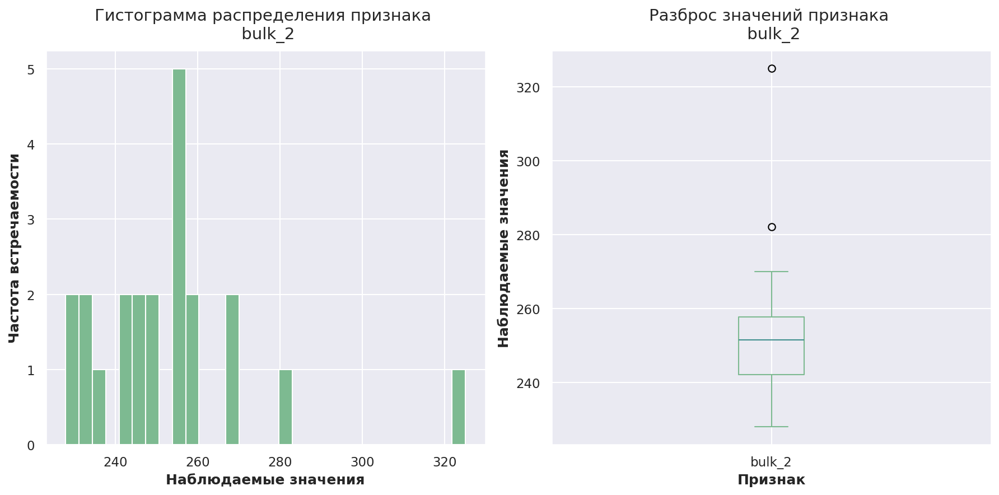

count   1,298.000
mean      113.879
std        75.483
min         6.000
25%        58.000
50%        97.500
75%       152.000
max       454.000
Name: bulk_3, dtype: float64

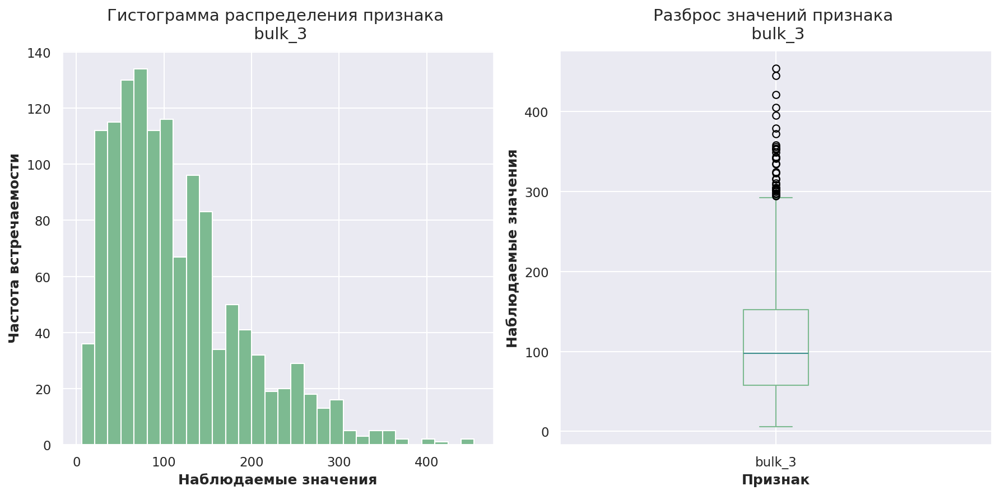

count   1,014.000
mean      104.394
std        48.184
min        12.000
25%        72.000
50%       102.000
75%       133.000
max       281.000
Name: bulk_4, dtype: float64

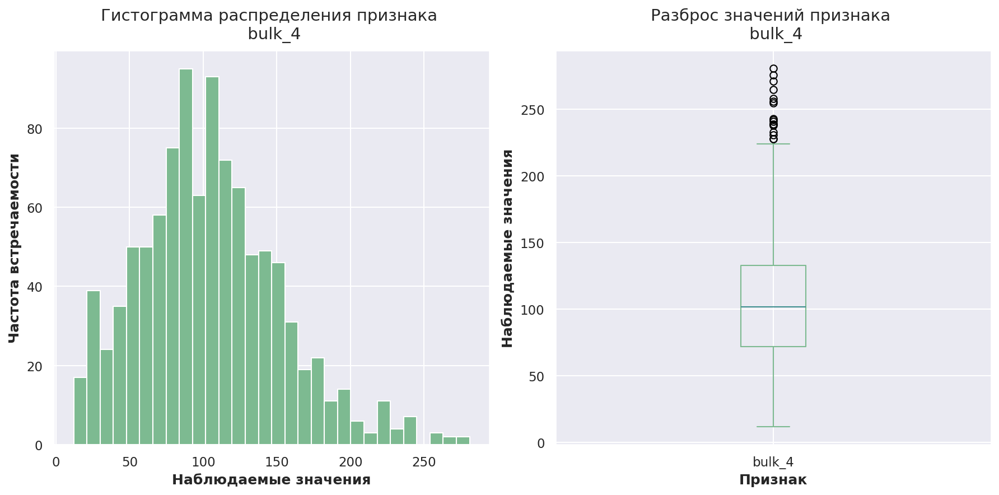

count    77.000
mean    107.026
std      81.791
min      11.000
25%      70.000
50%      86.000
75%     132.000
max     603.000
Name: bulk_5, dtype: float64

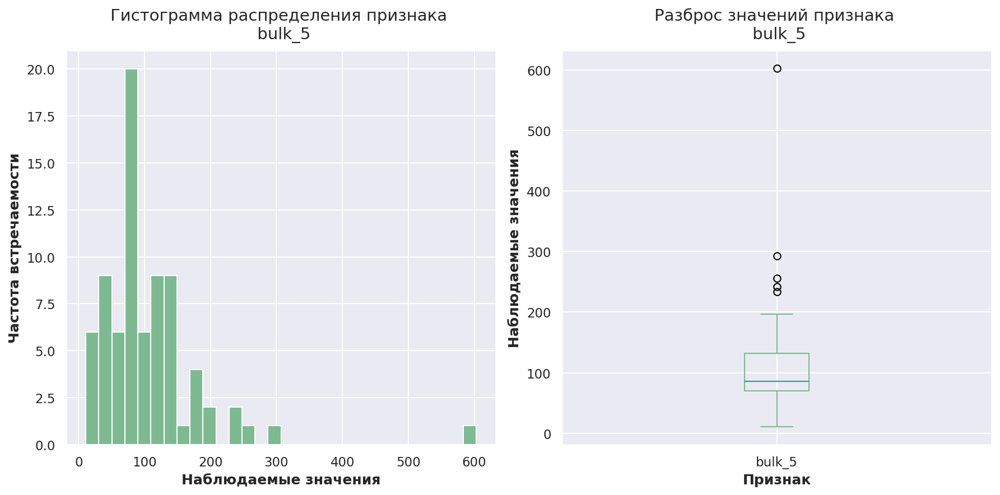

count   576.000
mean    118.925
std      72.058
min      17.000
25%      69.750
50%     100.000
75%     157.000
max     503.000
Name: bulk_6, dtype: float64

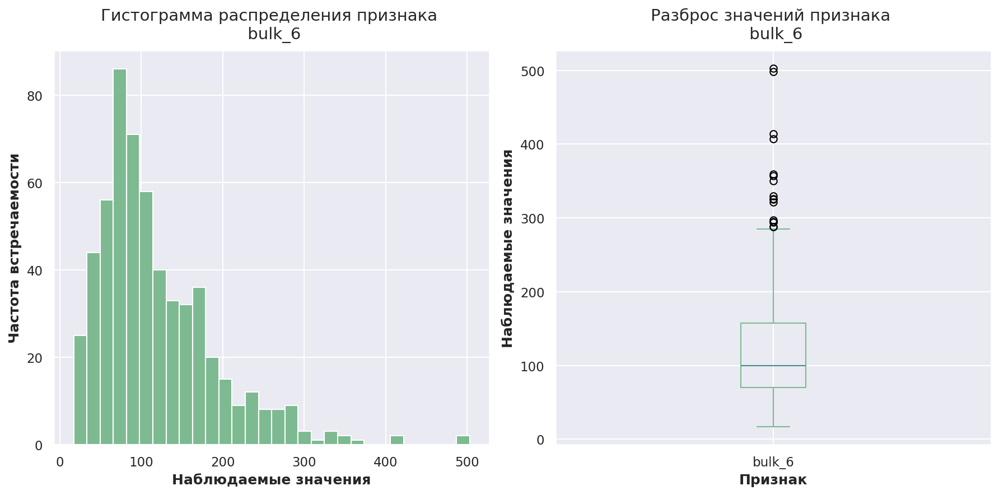

count    25.000
mean    305.600
std     191.023
min      47.000
25%     155.000
50%     298.000
75%     406.000
max     772.000
Name: bulk_7, dtype: float64

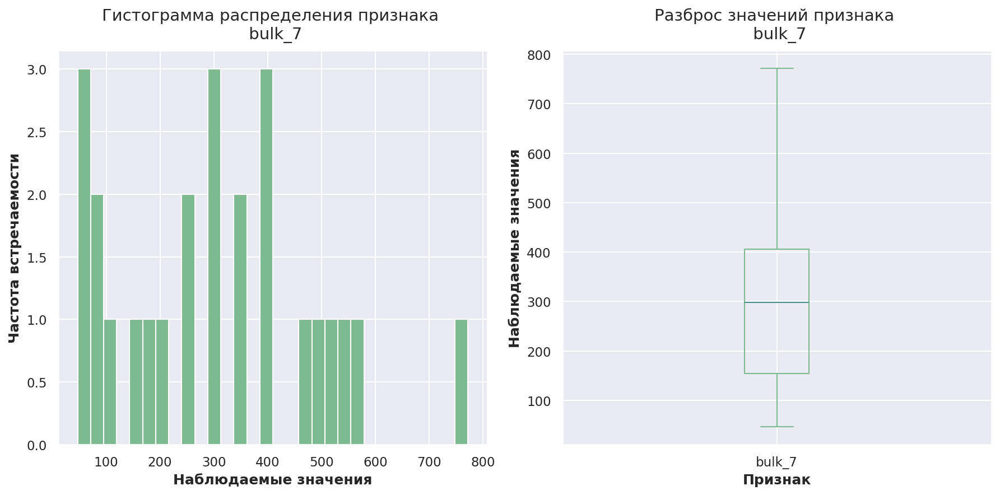

count    1.000
mean    49.000
std        NaN
min     49.000
25%     49.000
50%     49.000
75%     49.000
max     49.000
Name: bulk_8, dtype: float64

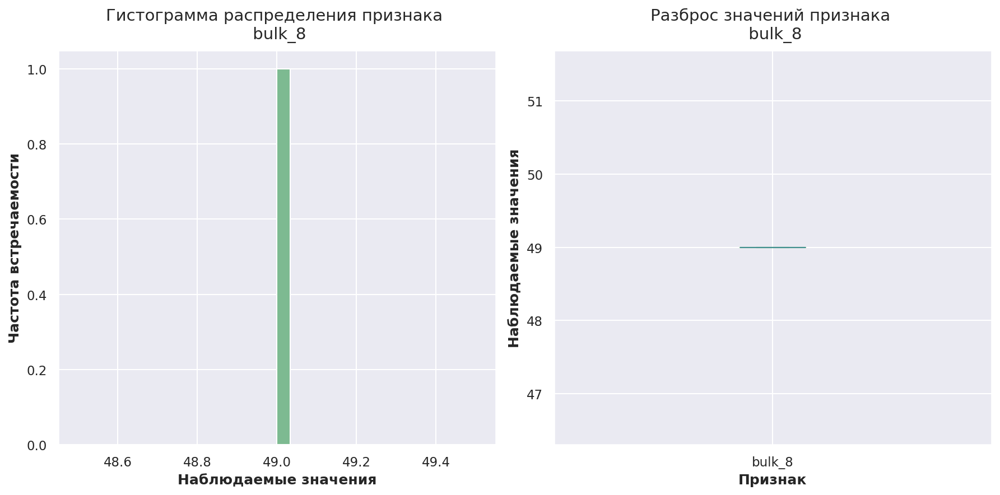

count    19.000
mean     76.316
std      21.721
min      63.000
25%      66.000
50%      68.000
75%      70.500
max     147.000
Name: bulk_9, dtype: float64

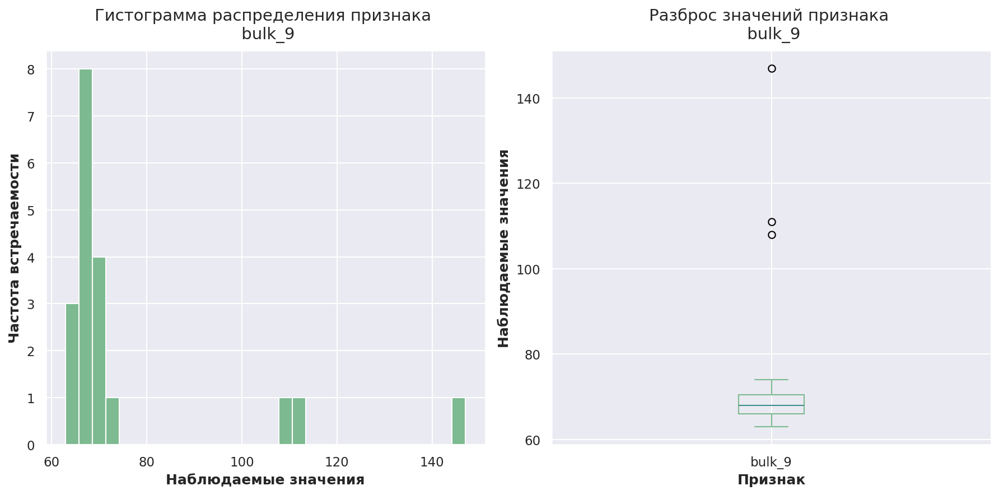

count   176.000
mean     83.284
std      26.060
min      24.000
25%      64.000
50%      86.500
75%     102.000
max     159.000
Name: bulk_10, dtype: float64

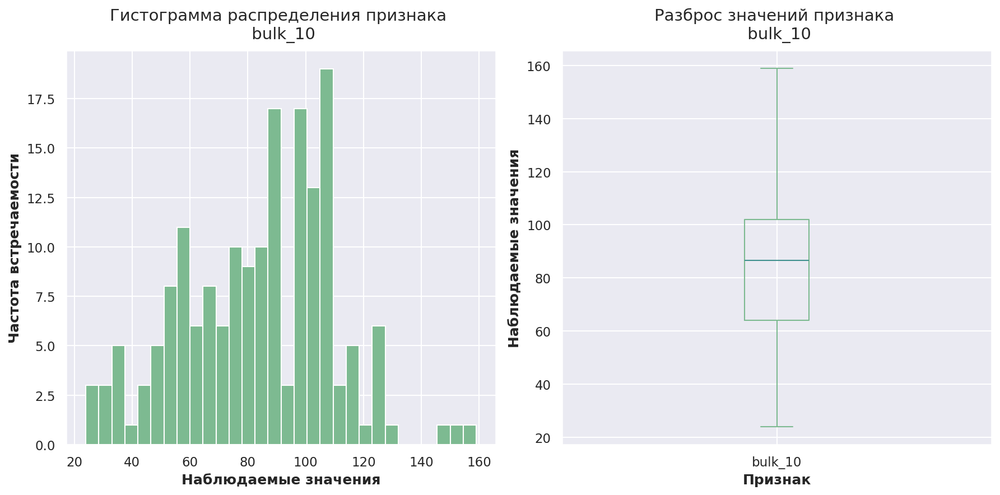

count   177.000
mean     76.819
std      59.655
min       8.000
25%      25.000
50%      64.000
75%     106.000
max     313.000
Name: bulk_11, dtype: float64

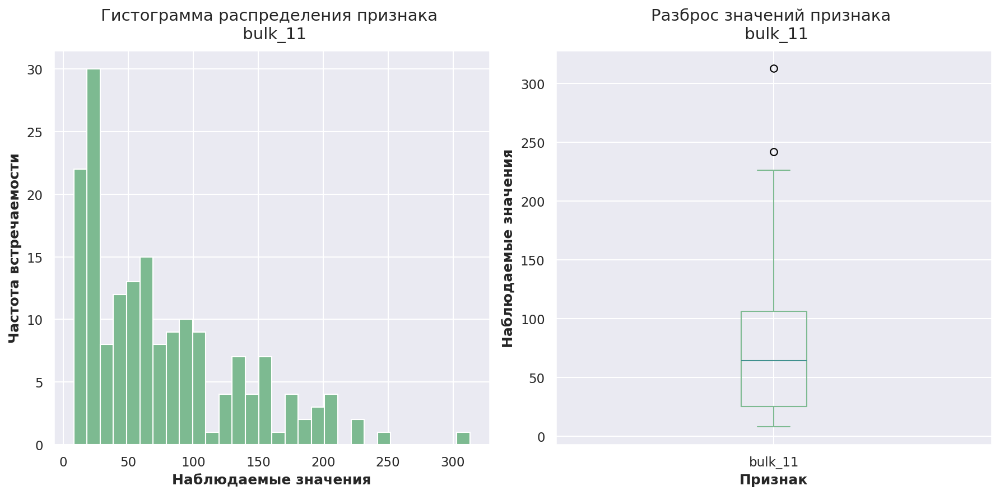

count   2,450.000
mean      260.471
std       120.649
min        53.000
25%       204.000
50%       208.000
75%       316.000
max     1,849.000
Name: bulk_12, dtype: float64

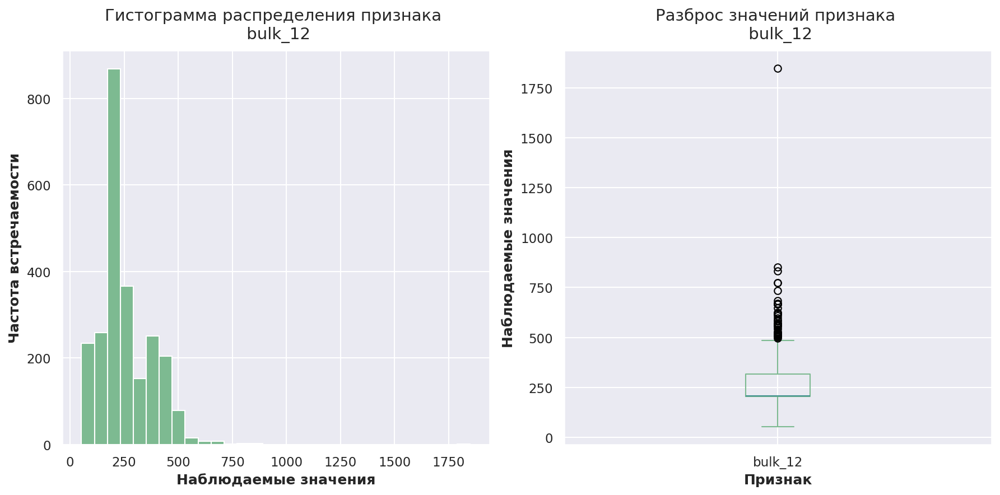

count    18.000
mean    181.111
std      46.088
min     151.000
25%     153.250
50%     155.500
75%     203.500
max     305.000
Name: bulk_13, dtype: float64

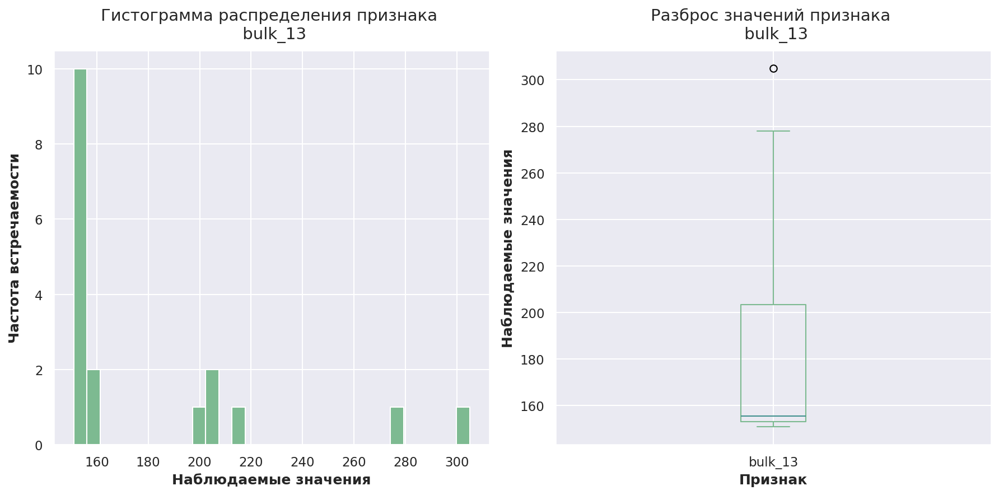

count   2,806.000
mean      170.285
std        65.869
min        16.000
25%       119.000
50%       151.000
75%       205.750
max       636.000
Name: bulk_14, dtype: float64

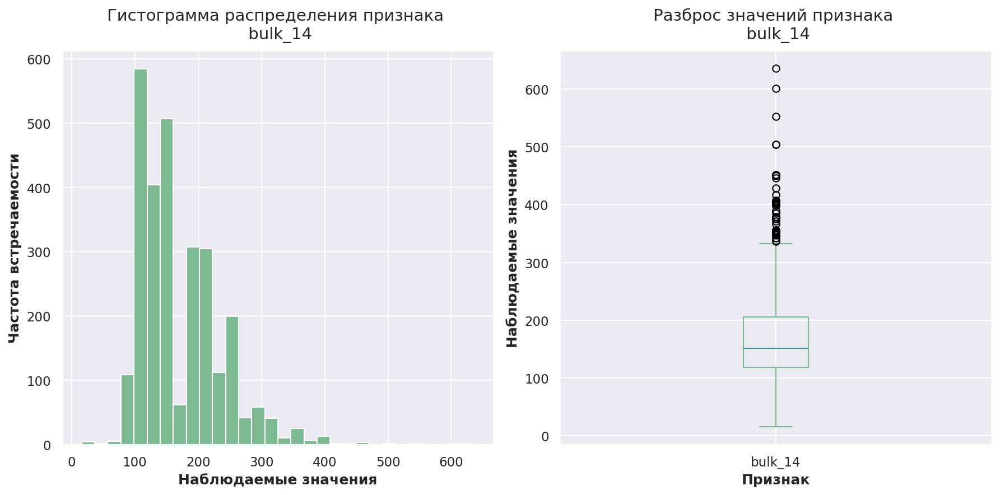

count   2,248.000
mean      160.513
std        51.765
min         1.000
25%       105.000
50%       160.000
75%       205.000
max       405.000
Name: bulk_15, dtype: float64

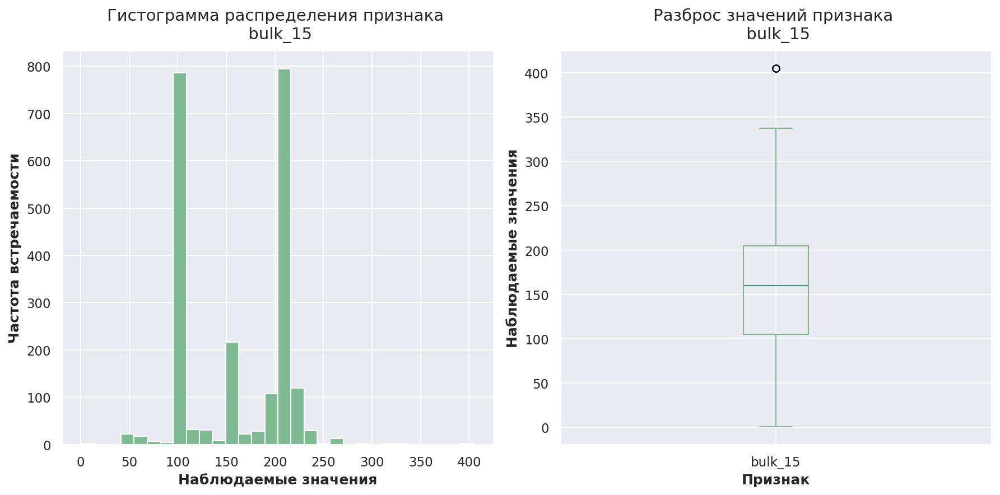

In [62]:
for feature in data_bulk.columns[1:]:
    visuals(data_bulk[data_bulk[feature] > 0], feature)

In [63]:
# выведем статистики для всех признаков
data_bulk[data_bulk > 0].describe().T

,count,mean,std,min,25%,50%,75%,max
key,"3,129.000","1,624.384",933.338,1.000,816.000,"1,622.000","2,431.000","3,241.000"
bulk_1,252.000,39.242,18.278,10.000,27.000,31.000,46.000,185.000
bulk_2,22.000,253.045,21.181,228.000,242.000,251.500,257.750,325.000
bulk_3,"1,298.000",113.879,75.483,6.000,58.000,97.500,152.000,454.000
bulk_4,"1,014.000",104.394,48.184,12.000,72.000,102.000,133.000,281.000
bulk_5,77.000,107.026,81.791,11.000,70.000,86.000,132.000,603.000
bulk_6,576.000,118.925,72.058,17.000,69.750,100.000,157.000,503.000
bulk_7,25.000,305.600,191.023,47.000,155.000,298.000,406.000,772.000
bulk_8,1.000,49.000,NaN,49.000,49.000,49.000,49.000,49.000
bulk_9,19.000,76.316,21.721,63.000,66.000,68.000,70.500,147.000


<font size="3">
    
**Вывод**
    
При анализе объёмов различных добавок выявлены значительные вариации как в количествах, так и в распределениях по признакам. 
    
Средние значения для каждой добавки варьируются, а разброс данных указывает на наличие выбивающихся значений. 

В некоторых случаях минимальные значения близки к нулю, определённые материалы добавлялись в партию в незначительных количествах. Максимальные значения заметно отличаются от медианных, что указывает на редкие, но крупные объёмы материала, которые могли быть добавлены в отдельные партии стали.
    
**Особенности:**

- отсутствуют отрицательные значения;
- материал `bulk_8` добавляли в партию только один раз, чаще всего использовался материал `bulk_14`;
- максимальное количество добавления в партию у материла `bulk_12`, минимальное - у материала `bulk_15`.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">

#### Добавление признаков

<font size="3"> Для удобства обнаружения взаимосвязей между материалами и такими показателями технологического процесса добавим следующие признаки:
- **Сумма объема добавленных материалов** (`общий_объём_bulk`) – общий объём всех добавленных материалов;
- **Количество добавленных материалов** (`количество_материалов_bulk`) – сколько видов материалов было добавлено в партию.

<hr style="width: 100%; height: 1px; background-color: #ccceaf;">

<font size="3">
    
- **Сумма объема добавленных материалов**

In [64]:
# добавим признак "общий_объём_bulk"
data_bulk["общий_объём_bulk"] = data_bulk.iloc[:, 1:16].sum(axis=1)

In [65]:
# проверим результат
data_bulk.sample(5, random_state=SEED)

,key,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_8,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15,общий_объём_bulk
2627,2726,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,108.000,0.000,68.000,108.000,284.000
1224,1274,0.000,0.000,0.000,154.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,206.000,0.000,122.000,103.000,585.000
1038,1084,0.000,0.000,18.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,76.000,206.000,0.000,100.000,105.000,505.000
1426,1480,0.000,0.000,0.000,107.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,205.000,0.000,101.000,106.000,519.000
3042,3151,0.000,0.000,0.000,28.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,158.000,0.000,100.000,110.000,396.000


<font size="3"> Изучим полученный признак: 

count   3,129.000
mean      595.503
std       276.558
min        19.000
25%       429.000
50%       591.000
75%       772.000
max     3,235.000
Name: общий_объём_bulk, dtype: float64

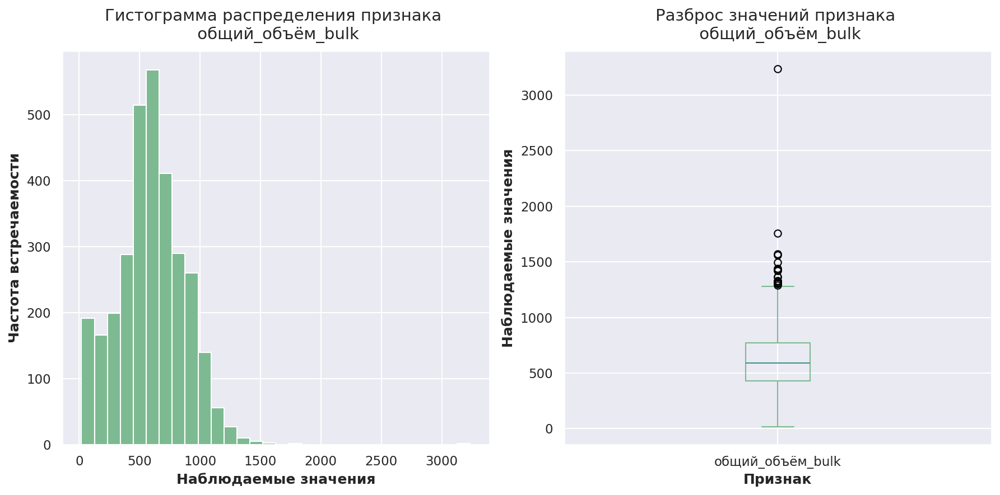

In [66]:
visuals(data_bulk, 'общий_объём_bulk')

<font size="3">
    
**Вывод**

Признак `общий_объём_bulk` - общий объём добавленных сыпучих материалов в каждой партии.
    
Большинство значений располагается в промежутке от **429** до **772**, пик находится в районе 600.

Стандартное отклонение составляет **276.558**, что указывает на значительную вариативность в данных, некоторые партии могут иметь значительно больший объём добавленных материалов.
    
Можно отметить, что максимальный объём материалов (**3235**) сильно удалён от 75% квартиля (**772**), что говорит о наличии выбивающихся значений. 
    
Такие объёмы материала могут быть вызваны особенносями технологического процесса.

<hr style="width: 100%; height: 1px; background-color: #ccceaf;">

<font size="3">
    
- **Количество добавленных материалов**

In [67]:
# добавим признак "количество_материалов_bulk"
data_bulk['количество_материалов_bulk'] = (data_bulk.iloc[:, 1:16] != 0).sum(axis=1)

In [68]:
# проверим результат
data_bulk.sample(5, random_state=SEED)

,key,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_8,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15,общий_объём_bulk,количество_материалов_bulk
2627,2726,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,108.000,0.000,68.000,108.000,284.000,3
1224,1274,0.000,0.000,0.000,154.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,206.000,0.000,122.000,103.000,585.000,4
1038,1084,0.000,0.000,18.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,76.000,206.000,0.000,100.000,105.000,505.000,5
1426,1480,0.000,0.000,0.000,107.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,205.000,0.000,101.000,106.000,519.000,4
3042,3151,0.000,0.000,0.000,28.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,158.000,0.000,100.000,110.000,396.000,4


<font size="3"> Изучим полученный признак: 

count   3,129.000
mean        3.566
std         1.216
min         1.000
25%         3.000
50%         4.000
75%         4.000
max         7.000
Name: количество_материалов_bulk, dtype: float64

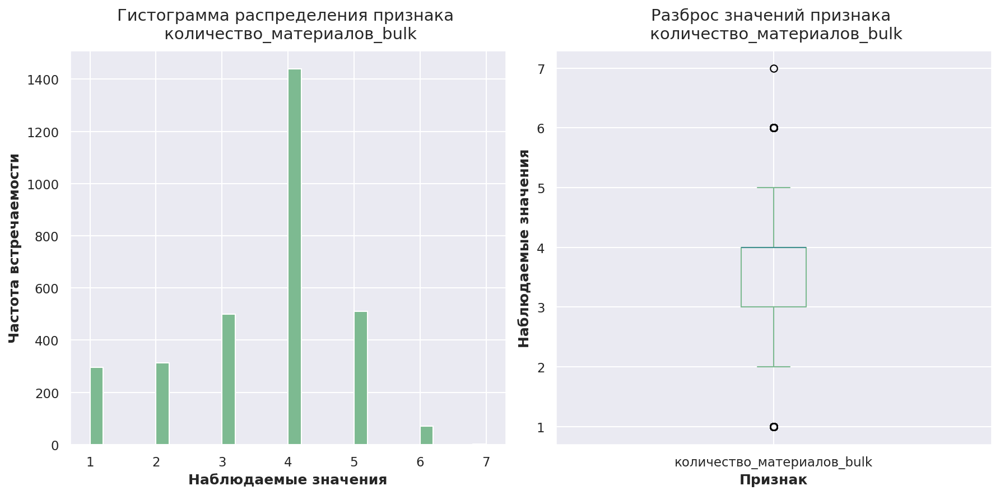

In [69]:
visuals(data_bulk, 'количество_материалов_bulk')

<font size="3">
    
**Вывод**

Признак `количество_материалов_bulk` - сколько видов сыпучих материалов было добавлено в партию.
    
Большинство значений располагается в промежутке от **3** до **4** видов, пик находится в районе 4.

Стандартное отклонение составляет **1.216**, что указывает на низкий разброс значений признака.
    
Количество видов добавленных материалов обусловлено особенностями технологического процесса: в некоторые партии добавляется только один вид материала, тогда как в другие - 7 разных видов сыпучих материалов. 

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

### Таблица `data_bulk_time`

<font size="3"> Изучим подробнее таблицу, содержащую данные о времени подачи сыпучих материалов.

<font size="4">
    
#### Тип данных

In [70]:
data_bulk_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   key      3129 non-null   int64 
 1   bulk_1   252 non-null    object
 2   bulk_2   22 non-null     object
 3   bulk_3   1298 non-null   object
 4   bulk_4   1014 non-null   object
 5   bulk_5   77 non-null     object
 6   bulk_6   576 non-null    object
 7   bulk_7   25 non-null     object
 8   bulk_8   1 non-null      object
 9   bulk_9   19 non-null     object
 10  bulk_10  176 non-null    object
 11  bulk_11  177 non-null    object
 12  bulk_12  2450 non-null   object
 13  bulk_13  18 non-null     object
 14  bulk_14  2806 non-null   object
 15  bulk_15  2248 non-null   object
dtypes: int64(1), object(15)
memory usage: 391.2+ KB


<font size="3"> Приведём столбцы с временем подачи материала к формату **datetime**.

In [71]:
# получаем названия столбцов с датой
date_columns = data_bulk_time.columns[1:16]

# преобразуем выбранные столбцы в формат datetime
for col in date_columns:
    data_bulk_time[col] = pd.to_datetime(data_bulk_time[col])

In [72]:
# проверим результат
data_bulk_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3129 entries, 0 to 3128
Data columns (total 16 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   key      3129 non-null   int64         
 1   bulk_1   252 non-null    datetime64[ns]
 2   bulk_2   22 non-null     datetime64[ns]
 3   bulk_3   1298 non-null   datetime64[ns]
 4   bulk_4   1014 non-null   datetime64[ns]
 5   bulk_5   77 non-null     datetime64[ns]
 6   bulk_6   576 non-null    datetime64[ns]
 7   bulk_7   25 non-null     datetime64[ns]
 8   bulk_8   1 non-null      datetime64[ns]
 9   bulk_9   19 non-null     datetime64[ns]
 10  bulk_10  176 non-null    datetime64[ns]
 11  bulk_11  177 non-null    datetime64[ns]
 12  bulk_12  2450 non-null   datetime64[ns]
 13  bulk_13  18 non-null     datetime64[ns]
 14  bulk_14  2806 non-null   datetime64[ns]
 15  bulk_15  2248 non-null   datetime64[ns]
dtypes: datetime64[ns](15), int64(1)
memory usage: 391.2 KB


<font size="3"> Все столбцы датафрейма содержат корректный тип данных.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">
    
#### Проверка пропусков

<font size="3"> Гистограммы `msno` показали наличие пропущенных значений в датафреймах, изучим их подробнее.

In [73]:
missing_count(data_bulk_time)

key           0
bulk_1     2877
bulk_2     3107
bulk_3     1831
bulk_4     2115
bulk_5     3052
bulk_6     2553
bulk_7     3104
bulk_8     3128
bulk_9     3110
bulk_10    2953
bulk_11    2952
bulk_12     679
bulk_13    3111
bulk_14     323
bulk_15     881
dtype: int64

key - 0%
bulk_1 - 92%
bulk_2 - 99%
bulk_3 - 59%
bulk_4 - 68%
bulk_5 - 98%
bulk_6 - 82%
bulk_7 - 99%
bulk_8 - 100%
bulk_9 - 99%
bulk_10 - 94%
bulk_11 - 94%
bulk_12 - 22%
bulk_13 - 99%
bulk_14 - 10%
bulk_15 - 28%


<font size="3"> Датафрейм содержит пропуски, аналогичные таблице `data_bulk` и также означают, что материал не добавляли в партию.
    
На данном этапе оставим пропуски в формате `NaT` для удобства дальнейшего расчёта временных интервалов.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">

#### Проверка дубликатов

<font size="3"> Проверим наличие дубликатов в датафрейме.

In [74]:
print(f'Количество дубликатов в датафрейме: {data_bulk.duplicated().sum()}')

Количество дубликатов в датафрейме: 0


<font size="3"> Явные дубликаты отсутствуют.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">

#### Добавление признаков

<font size="3"> Для удобства проведения анализа создадим дополнительный признак.

**Время от добавления первого до добавления последнего материала в партию** (`общее_время_bulk`) – разница в секундах между максимальным и минимальным временем подачи материала для каждой партии.

In [75]:
# добавим признак "общее_время_bulk"
data_bulk_time["общее_время_bulk"] = (
    data_bulk_time.iloc[:, 1:16].max(axis=1) - data_bulk_time.iloc[:, 1:16].min(axis=1)
).dt.total_seconds()

In [76]:
# проверим результат
data_bulk_time.sample(5, random_state=SEED)

,key,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_8,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15,общее_время_bulk
2627,2726,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-08-18 19:38:47,NaT,2019-08-18 19:35:29,2019-08-18 19:29:49,538.000
1224,1274,NaT,NaT,NaT,2019-06-20 14:37:37,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-06-20 14:29:42,NaT,2019-06-20 14:24:22,2019-06-20 14:14:37,"1,380.000"
1038,1084,NaT,NaT,2019-06-14 02:18:05,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-06-14 02:25:19,2019-06-14 02:25:19,NaT,2019-06-14 02:25:19,2019-06-14 02:37:06,"1,141.000"
1426,1480,NaT,NaT,NaT,2019-06-28 04:26:35,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-06-28 04:30:04,NaT,2019-06-28 04:26:35,2019-06-28 04:20:51,553.000
3042,3151,NaT,NaT,NaT,2019-09-03 12:35:48,NaT,NaT,NaT,NaT,NaT,NaT,NaT,2019-09-03 12:29:12,NaT,2019-09-03 12:26:39,2019-09-03 12:20:57,891.000


<font size="3"> Изучим полученный признак: 

count    3,129.000
mean       964.907
std        798.088
min          0.000
25%        485.000
50%        877.000
75%      1,311.000
max     13,683.000
Name: общее_время_bulk, dtype: float64

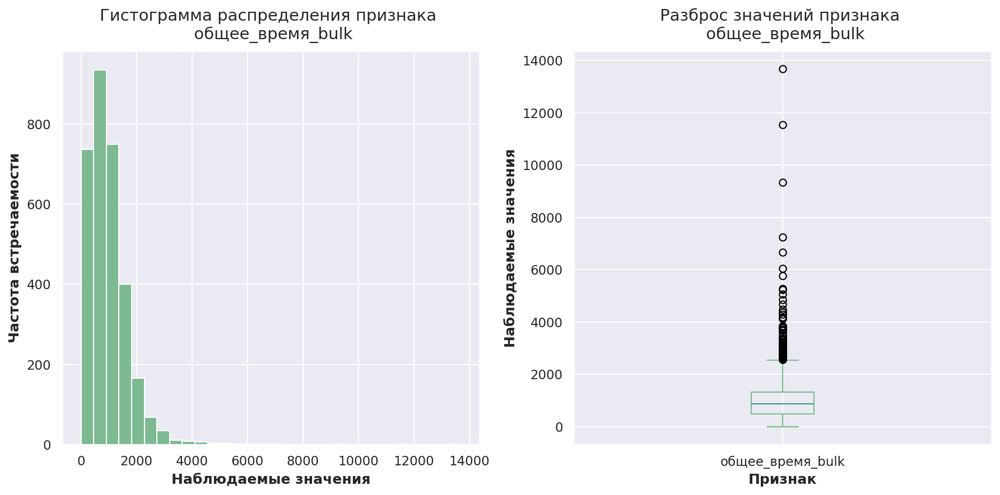

In [77]:
visuals(data_bulk_time, 'общее_время_bulk')

<font size="3">
    
**Вывод**

Признак `общее_время_bulk` - время от добавления первого до добавления последнего сыпучего материала в партию.
    
Большинство значений располагается в промежутке от **485** до **1,311** секунд, пик находится в районе 800.

Стандартное отклонение составляет **798.088**, что указывает на сильную вариативность значений признака.

Нулевые значения в данном случае логичны и соответствуют партиям, в которые добавлялся только один материал.
    
Время добавления материалов в партию связано с количеством видов добавленных материалов и обусловлено особенностями технологического процесса: в некоторые партии добавляется только один вид материала, что занимает меньше времени, тогда как в другие - 7 разных видов сыпучих материалов, что увеличивает время производства. 

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

### Таблица `data_gas`

<font size="3"> Изучим подробнее таблицу, содержащую данные о продувке сплава газом.

<font size="4">
    
#### Тип данных

<font size="3"> Проверим тип данных всех признаков.

In [78]:
data_gas.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3239 entries, 0 to 3238
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3239 non-null   int64  
 1   газ_1   3239 non-null   float64
dtypes: float64(1), int64(1)
memory usage: 50.7 KB


<font size="3"> Все столбцы датафрейма содержат корректный тип данных.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">
    
#### Проверка пропусков

<font size="3"> Гистограммы `msno` показали наличие пропущенных значений в датафреймах, изучим их подробнее.

In [79]:
missing_count(data_gas)

key      0
газ_1    0
dtype: int64

key - 0%
газ_1 - 0%


<font size="3"> Пропущенные значения отсутствуют.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">

#### Проверка дубликатов

<font size="3"> Проверим наличие дубликатов в датафрейме.

In [80]:
print(f'Количество дубликатов в датафрейме: {data_bulk.duplicated().sum()}')

Количество дубликатов в датафрейме: 0


<font size="3"> Явные дубликаты отсутствуют.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">

#### Исследовательский анализ данных

<font size="3"> Проведём исследовательский анализ всех признаков датафрейма.

<font size="3">
    
- Признак **газ_1**

count   3,239.000
mean       11.002
std         6.220
min         0.008
25%         7.043
50%         9.836
75%        13.770
max        77.995
Name: газ_1, dtype: float64

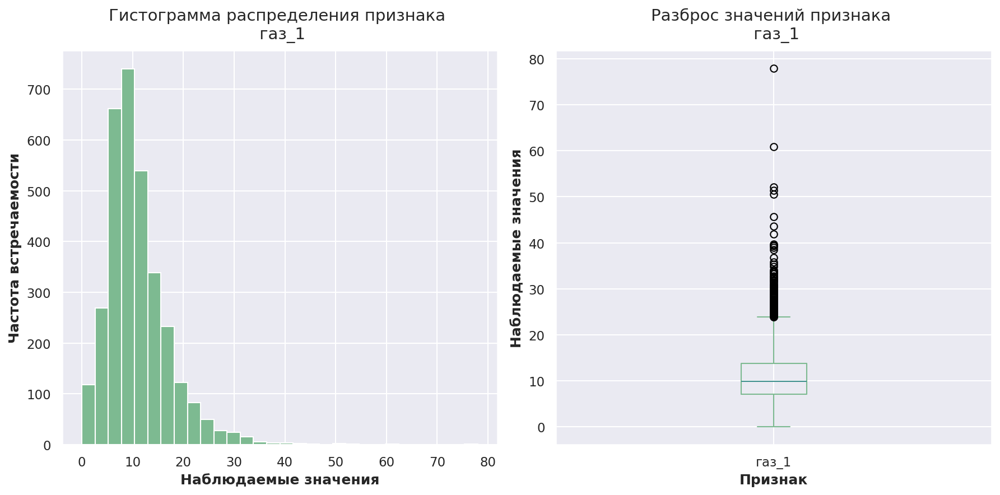

In [81]:
visuals(data_gas, 'газ_1')

<font size="3">
    
**Вывод**

Признак `газ_1` - объём подаваемого газа. 
    
Распределение признака асимметрично вправо с длинным хвостом, среднее значение больше, чем медиана. 
    
Большинство значений располагается в промежутке от **7.043 до 13.770**, пик находится в районе **10**.
    
Стандартное отклонение составляет **6.220**, что указывает на довольно высокий разброс значений относительно среднего.
    
Распределение признака указывает на то, что в некоторых случаях (возможно, для более сложных или длительных процессов) требуется гораздо больше газа. Это может быть связано с особенностями технологического процесса, так как инертный газ используют, чтобы перемешать добавленные в сталь материалы.
    
Таким образом, в случаях, когда добавляется больше материала или требуется больше усилий для достижения оптимальных условий, объём потреблённого газа будет значительно выше.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

### Таблица `data_temp`

<font size="3"> Изучим подробнее таблицу, содержащую данные об измерениях температуры.

<font size="4">
    
#### Тип данных

In [82]:
data_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18092 entries, 0 to 18091
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype 
---  ------        --------------  ----- 
 0   key           18092 non-null  int64 
 1   время_замера  18092 non-null  object
 2   температура   14665 non-null  object
dtypes: int64(1), object(2)
memory usage: 424.2+ KB


<font size="3"> Приведём столбец, содержащий значения температуры к формату **float**.

In [83]:
# преобразуем столбцы типа object в числовой формат
data_temp.iloc[:,-1] = data_temp.iloc[:,-1].apply(pd.to_numeric, errors='coerce')

In [84]:
# преобразуем 'время_замера' в формат datetime
data_temp['время_замера'] = pd.to_datetime(data_temp['время_замера'])

In [85]:
# проверим результат
data_temp.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18092 entries, 0 to 18091
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   key           18092 non-null  int64         
 1   время_замера  18092 non-null  datetime64[ns]
 2   температура   14665 non-null  object        
dtypes: datetime64[ns](1), int64(1), object(1)
memory usage: 424.2+ KB


<font size="3"> Все столбцы датафрейма содержат корректный тип данных.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">
    
#### Проверка пропусков

<font size="3"> Гистограммы `msno` показали наличие пропущенных значений в датафреймах, изучим их подробнее.

In [86]:
missing_count(data_temp)

key                0
время_замера       0
температура     3427
dtype: int64

key - 0%
время_замера - 0%
температура - 19%


<font size="3"> Пропущенные значения встречаются только в столбце с температурой, который содержит целевой признак. Так как значение температуры не было зафиксировано, удалим строки, где есть пропуски в столбце `температура`.

In [87]:
# удалим пропуски в столбце `температура`
data_temp = data_temp.dropna(subset=['температура']) 

In [88]:
# проверим результат
data_temp.isna().sum()

key             0
время_замера    0
температура     0
dtype: int64

In [89]:
data_temp.shape

(14665, 3)

<font size="3"> Пропущенные значения отсутствуют.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">

#### Проверка дубликатов

<font size="3"> Проверим наличие дубликатов в датафрейме.

In [90]:
print(f'Количество дубликатов в датафрейме: {data_temp.duplicated().sum()}')

Количество дубликатов в датафрейме: 0


<font size="3"> Явные дубликаты отсутствуют.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">

#### Исследовательский анализ данных

<font size="3"> Проведём исследовательский анализ всех признаков датафрейма.

<font size="3">
    
- Признак **температура**

count    14,665.000
unique      172.000
top       1,593.000
freq        445.000
Name: температура, dtype: float64

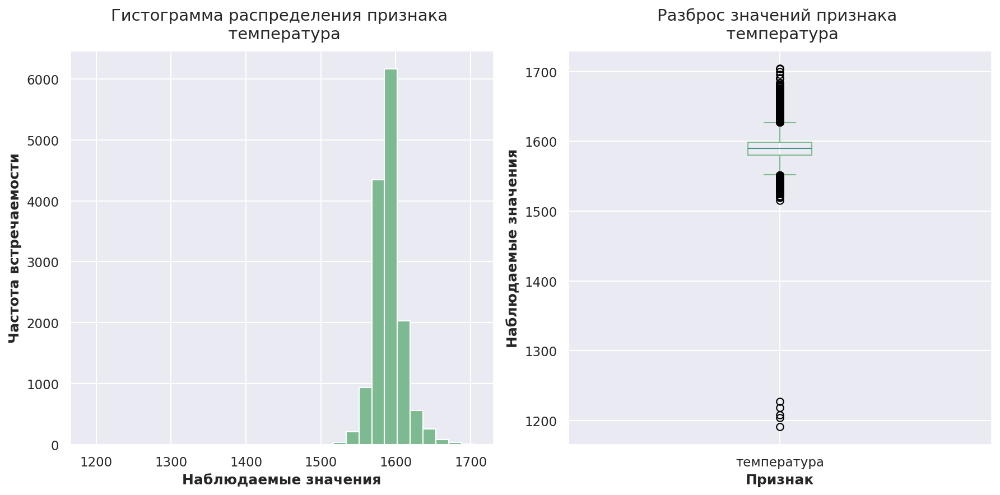

In [91]:
visuals(data_temp, 'температура')

<font size="3"> Заказчик предупредил, что значения температуры ниже 1500 градусов — аномальные. Удалим выбивающиеся значения из выборки и изучим распределение признака повторно. 

In [92]:
# удаляем выбросы
data_temp = data_temp.loc[(data_temp['температура'] > 1500)]

count    14,660.000
unique      167.000
top       1,593.000
freq        445.000
Name: температура, dtype: float64

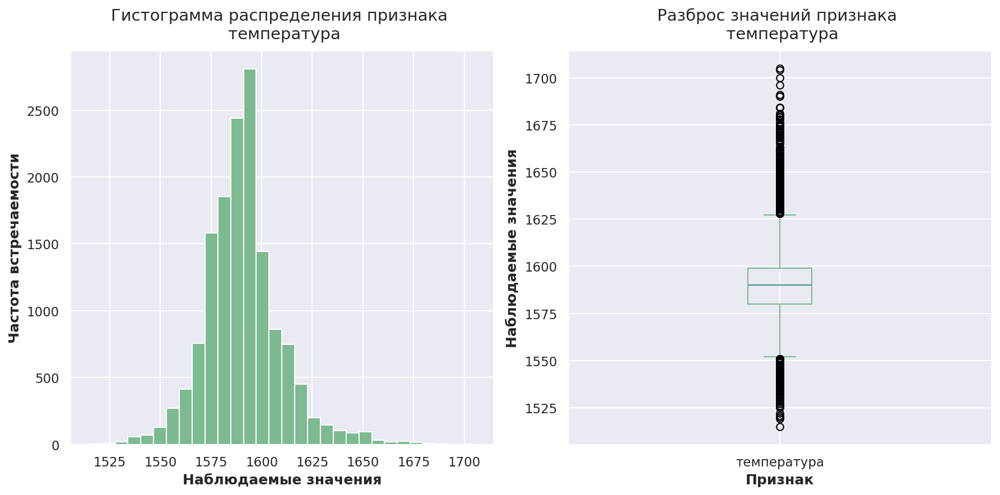

In [93]:
visuals(data_temp, 'температура')

<font size="3">
    
**Вывод**

Признак `температура` — температура партии на каждом технологическом этапе.

Распределение признака близко к нормальному, большинство значений располагается в промежутке от **1580** до **1599** градусов, пик находится в районе 1590.

Стандартное отклонение составляет **19.143**, что указывает на умеренный разброс значений относительно среднего.

Среднее значение практически равно медианному, что указывает на стабильность процесса и отсутствие значительных выбросов и аномалий в данных.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">

#### Добавление признаков

<font size="3"> При добавлении признаков учтём условия: 
- целевой признак — последняя температура партии;
- начальную температуру партии можно использовать как входной признак;
- любые другие промежуточные значения температуры приведут к утечке целевого признака;
- при агрегировании наблюдений стоит использовать только те ключи, у которых как минимум два наблюдения: первый и последний замеры температуры.

<font size="3"> 

**Отбор партий с минимум двумя замерами**

Необходимо убедиться, что для каждой партии (ключа) есть хотя бы два замера температуры.

In [94]:
# оставляем партии, где количество замеров > 1
data_temp = data_temp.groupby('key').filter(lambda x: len(x) > 1)

In [95]:
# проверим результат
data_temp.shape

(13920, 3)

<font size="3"> Датафрейм уменьшился на 745 записей.

<font size="3"> **Создание признаков**

<font size="3">

Извлечём начальную и конечную температуру стали из отфильтрованной выборки:

- `начальная_температура` — температура первого замера в партии;
- `конечная_температура` — температура последнего замера в партии.

In [96]:
data_temp = data_temp.groupby('key').agg(
    начальная_температура=('температура', lambda x: x.iloc[0]),
    конечная_температура=('температура', lambda x: x.iloc[-1])
).reset_index()

In [97]:
# проверим результат
data_temp.head()

,key,начальная_температура,конечная_температура
0,1,"1,571.000","1,613.000"
1,2,"1,581.000","1,602.000"
2,3,"1,596.000","1,599.000"
3,4,"1,601.000","1,625.000"
4,5,"1,576.000","1,602.000"


<font size="3"> Датафрейм преобразован, изучим полученные признаки: 

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> 

Целевой признак выбран корректно

<font size="3">
    
- Признак **начальная_температура**

count   2,475.000
mean    1,589.030
std        24.998
min     1,519.000
25%     1,572.000
50%     1,588.000
75%     1,605.000
max     1,679.000
Name: начальная_температура, dtype: float64

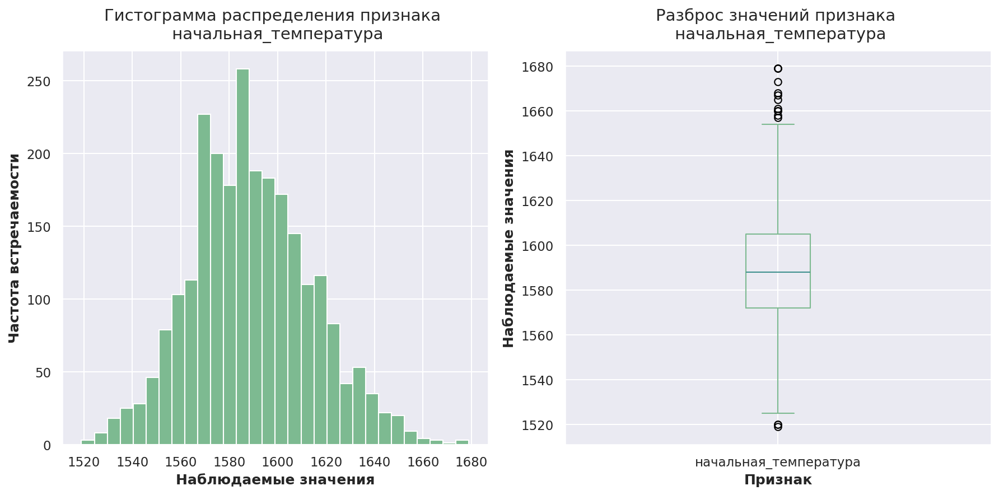

In [98]:
visuals(data_temp, 'начальная_температура')

<font size="3">
    
**Вывод**

Признак `начальная_температура` — начальная температура партии.

Распределение признака близко к нормальному, большинство значений располагается в промежутке от **1572** до **1605** градусов, пик находится в районе 1585.

Стандартное отклонение составляет **24.998**, что указывает на умеренный разброс значений относительно среднего.

Среднее значение близко к медианному, что указывает на стабильность процесса и отсутствие значительных выбросов и аномалий в данных.

<font size="3">
    
- Признак **конечная_температура**

count   2,475.000
mean    1,595.336
std        16.023
min     1,541.000
25%     1,587.000
50%     1,593.000
75%     1,599.000
max     1,700.000
Name: конечная_температура, dtype: float64

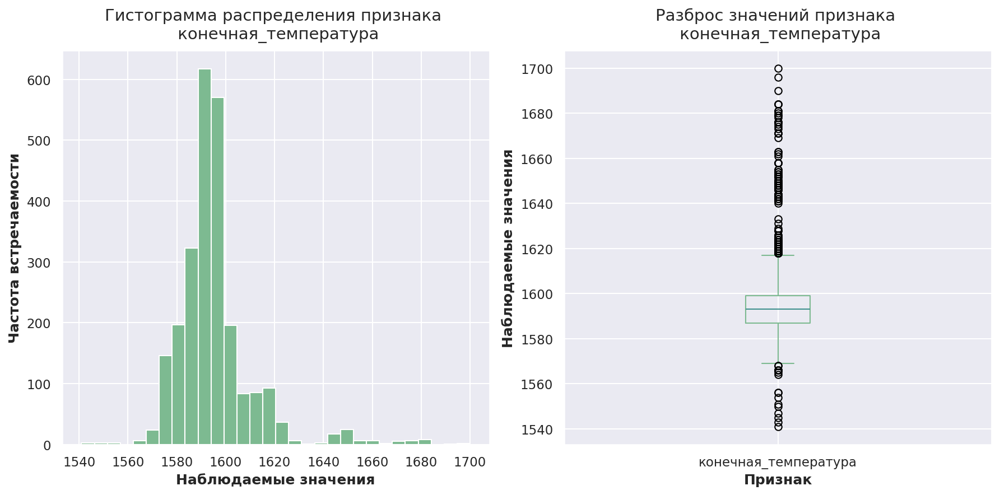

In [99]:
visuals(data_temp, 'конечная_температура')

<font size="3">
    
**Вывод**

Признак `конечная_температура` — целевой, конечная температура партии.

Большинство значений располагается в промежутке от **1587** до **1599** градусов, пик находится в районе 1590, что свидетельствует о стабильности конечной температуры.

Стандартное отклонение составляет **16.023**, что указывает на слабый разброс значений относительно среднего.

Среднее значение немного больше медианного, распределение несколько ассиметрично с правым хвостом. 
    
Значимые выбросы и аномалии в данных отсутствуют, процесс предсказуем и целевой признак имеет приемлемый диапазон.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

### Таблица `data_wire`

<font size="3"> Изучим подробнее таблицу, содержащую данные об объёме проволочных материалов.

<font size="4">
    
#### Тип данных

In [100]:
data_wire.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3081 non-null   int64  
 1   wire_1  3055 non-null   float64
 2   wire_2  1079 non-null   object 
 3   wire_3  63 non-null     object 
 4   wire_4  14 non-null     object 
 5   wire_5  1 non-null      object 
 6   wire_6  73 non-null     object 
 7   wire_7  11 non-null     object 
 8   wire_8  19 non-null     object 
 9   wire_9  29 non-null     object 
dtypes: float64(1), int64(1), object(8)
memory usage: 240.8+ KB


<font size="3"> Приведём столбцы с объёмом подаваемого материала к формату **float**.

In [101]:
# преобразуем столбцы типа object в числовой формат
data_wire.iloc[:, 1:] = data_wire.iloc[:, 1:].apply(pd.to_numeric, errors='coerce')

In [102]:
# проверим результат
data_wire.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   key     3081 non-null   int64  
 1   wire_1  3055 non-null   float64
 2   wire_2  1079 non-null   object 
 3   wire_3  63 non-null     object 
 4   wire_4  14 non-null     object 
 5   wire_5  1 non-null      object 
 6   wire_6  73 non-null     object 
 7   wire_7  11 non-null     object 
 8   wire_8  19 non-null     object 
 9   wire_9  29 non-null     object 
dtypes: float64(1), int64(1), object(8)
memory usage: 240.8+ KB


<font size="3"> Все столбцы датафрейма содержат корректный тип данных.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">
    
#### Проверка пропусков

<font size="3"> Гистограммы `msno` показали наличие пропущенных значений в датафреймах, изучим их подробнее.

In [103]:
missing_count(data_wire)

key          0
wire_1      26
wire_2    2002
wire_3    3018
wire_4    3067
wire_5    3080
wire_6    3008
wire_7    3070
wire_8    3062
wire_9    3052
dtype: int64

key - 0%
wire_1 - 1%
wire_2 - 65%
wire_3 - 98%
wire_4 - 100%
wire_5 - 100%
wire_6 - 98%
wire_7 - 100%
wire_8 - 99%
wire_9 - 99%


<font size="3"> Все столбцы имеют пропущенные значения, при этом большинство признаков в выборке имеют более 50% пропусков.
    
Нам известно, что во все партии точно добавлялись сыпучие и проволочные материалы, таким образом, стоит исключить партии, где присутствует пропуск для каждого из подаваемых материалов. 

In [104]:
# отберём строки, где все значения по проволочным материалам являются NaN
wire_columns = data_wire.columns[1:10]
missing_wire_data = data_wire[data_wire[wire_columns].isna().all(axis=1)]
print(missing_wire_data)

Empty DataFrame
Columns: [key, wire_1, wire_2, wire_3, wire_4, wire_5, wire_6, wire_7, wire_8, wire_9]
Index: []


<font size="3"> В таблице отсутствуют объекты с пропусками для каждого из подаваемых материалов.
    
Также нам известно, что наличие пропуска означает, что материал не добавляли в партию. Заменим пропуски значений в объёме подаваемого материала на **0**.

In [105]:
# заполним пропуски нулями
data_wire.fillna(0, inplace=True)

In [106]:
# проверим результат
data_wire.isna().sum()

key       0
wire_1    0
wire_2    0
wire_3    0
wire_4    0
wire_5    0
wire_6    0
wire_7    0
wire_8    0
wire_9    0
dtype: int64

<font size="3"> Пропущенные значения отсутствуют.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">

#### Проверка дубликатов

<font size="3"> Проверим наличие дубликатов в датафрейме.

In [107]:
print(f'Количество дубликатов в датафрейме: {data_wire.duplicated().sum()}')

Количество дубликатов в датафрейме: 0


<font size="3"> Явные дубликаты отсутствуют.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">

#### Исследовательский анализ данных

<font size="3"> Проведём исследовательский анализ всех признаков датафрейма.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="3"> **Количественные признаки**

<font size="3">
    
- Признаки **wire_1 - wire_9**

<font size="3"> Передадим в функцию только те строки, где объем материала больше 0, чтобы изучить распределения добавленных объёмов без влияния заполненных пропусков (материал не добавляли в партию).

count   3,055.000
mean      100.896
std        42.013
min         1.919
25%        72.116
50%       100.158
75%       126.060
max       330.314
Name: wire_1, dtype: float64

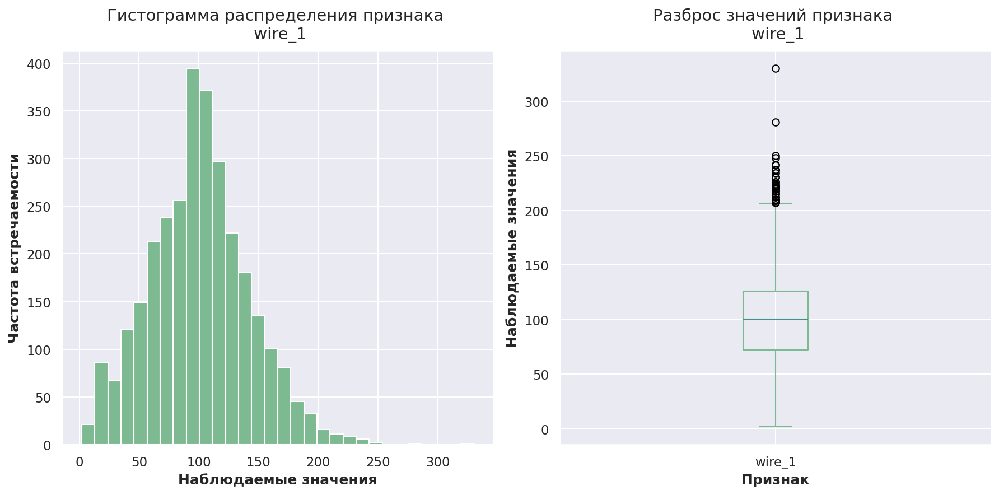

count   1,079.000
mean       50.577
std        39.320
min         0.030
25%        20.194
50%        40.143
75%        70.228
max       282.780
Name: wire_2, dtype: float64

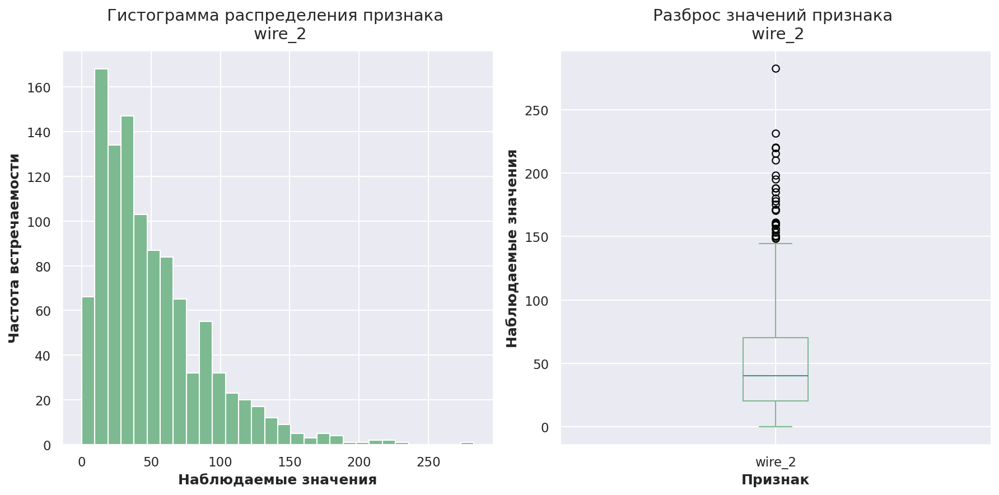

count    63.000
mean    189.483
std      99.513
min       0.144
25%      95.135
50%     235.195
75%     276.252
max     385.009
Name: wire_3, dtype: float64

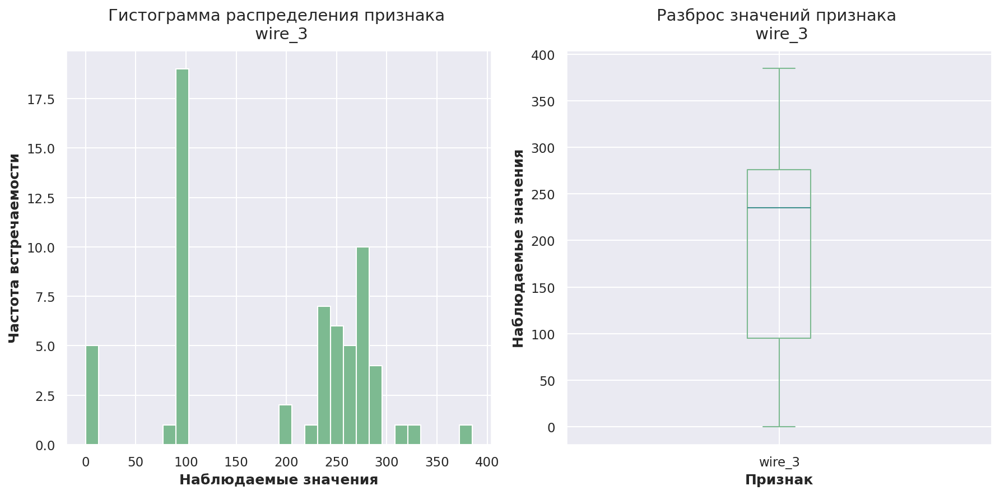

count    14.000
mean     57.443
std      28.825
min      24.149
25%      40.807
50%      45.234
75%      76.125
max     113.231
Name: wire_4, dtype: float64

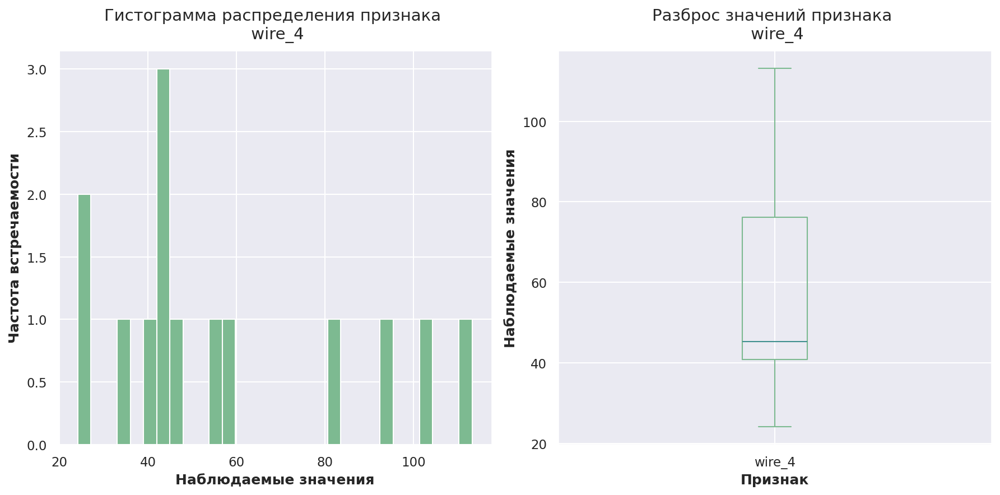

count    1.000
mean    15.132
std        NaN
min     15.132
25%     15.132
50%     15.132
75%     15.132
max     15.132
Name: wire_5, dtype: float64

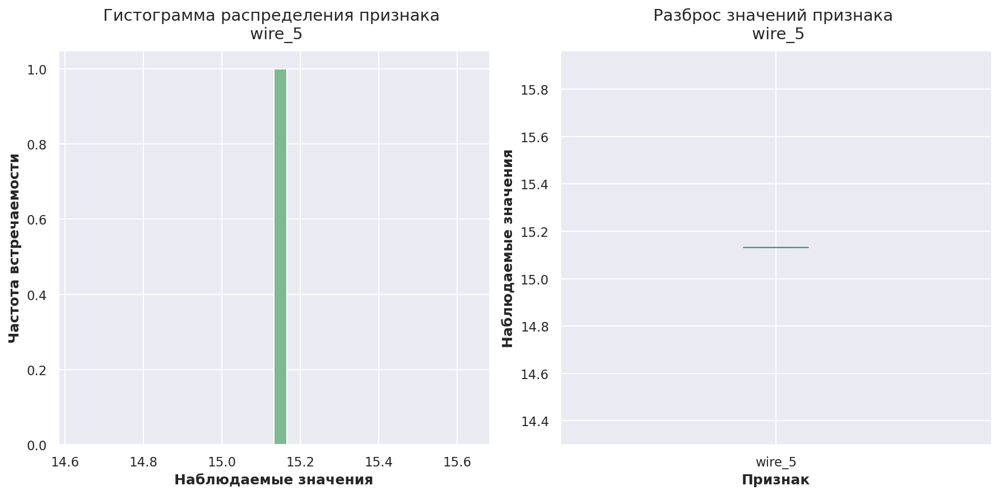

count    73.000
mean     48.017
std      33.920
min       0.034
25%      25.054
50%      42.076
75%      64.213
max     180.455
Name: wire_6, dtype: float64

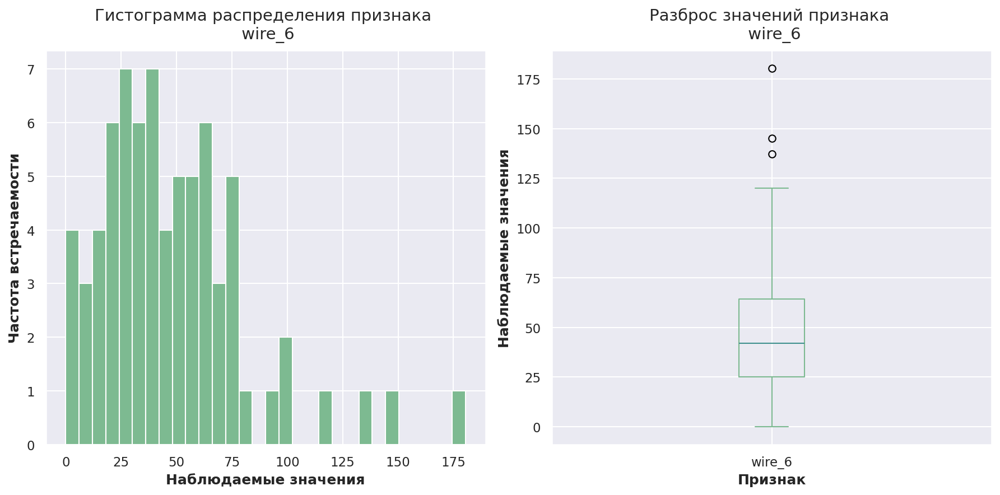

count   11.000
mean    10.039
std      8.611
min      0.234
25%      6.763
50%      9.017
75%     11.886
max     32.848
Name: wire_7, dtype: float64

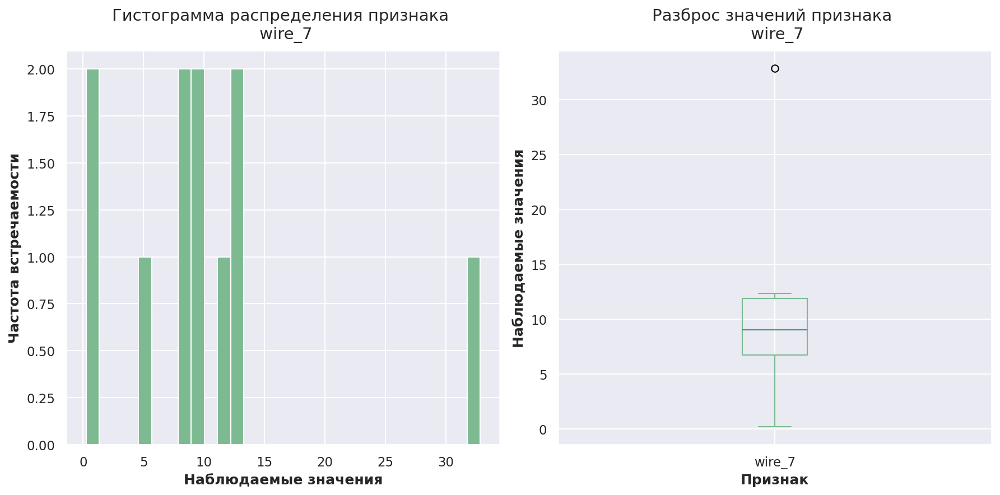

count    19.000
mean     53.625
std      16.882
min      45.077
25%      46.095
50%      46.280
75%      48.090
max     102.762
Name: wire_8, dtype: float64

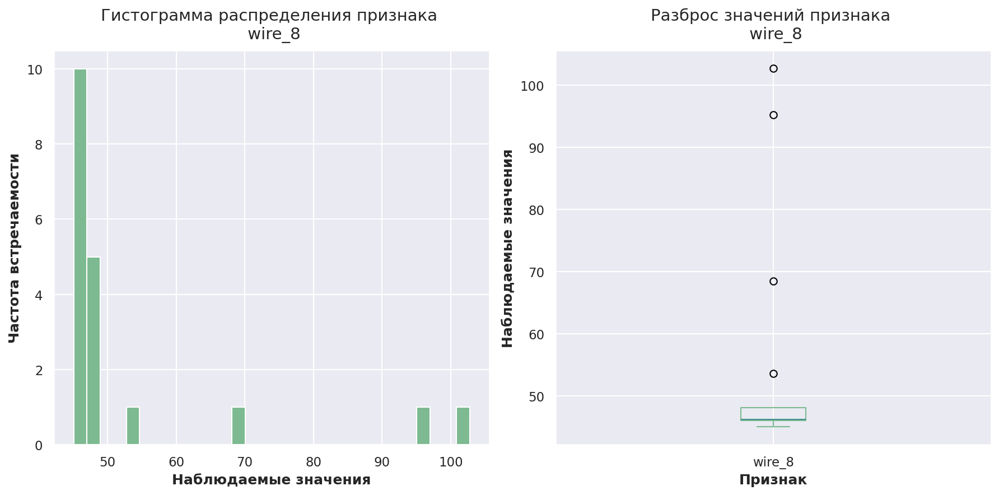

count   29.000
mean    34.156
std     19.932
min      4.623
25%     22.058
50%     30.066
75%     43.862
max     90.054
Name: wire_9, dtype: float64

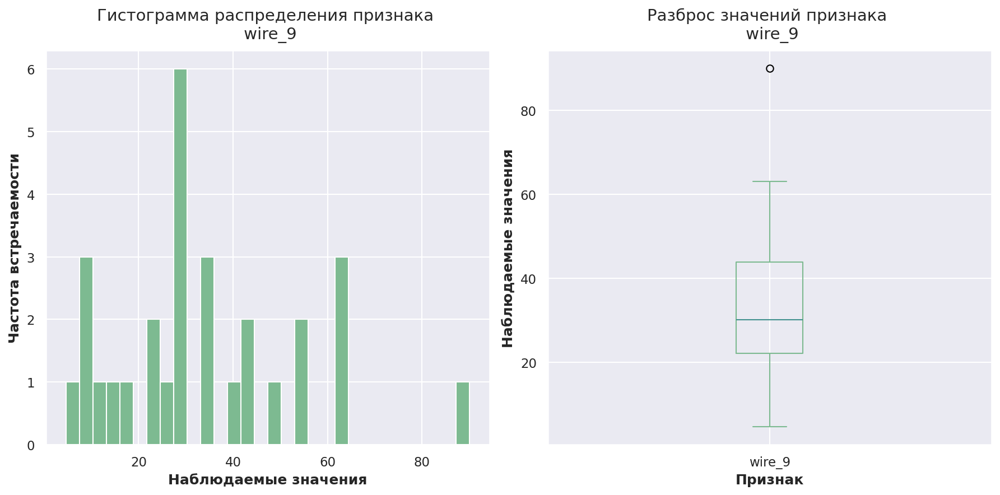

In [108]:
for feature in data_wire.columns[1:]:
    visuals(data_wire[data_wire[feature] > 0], feature)

In [109]:
# выведем статистики для всех признаков
data_wire[data_wire > 0].describe().T

,count,mean,std,min,25%,50%,75%,max
key,"3,081.000","1,623.426",932.997,1.000,823.000,"1,619.000","2,434.000","3,241.000"
wire_1,"3,055.000",100.896,42.013,1.919,72.116,100.158,126.060,330.314
wire_2,"1,079.000",50.577,39.320,0.030,20.194,40.143,70.228,282.780
wire_3,63.000,189.483,99.513,0.144,95.135,235.195,276.252,385.009
wire_4,14.000,57.443,28.825,24.149,40.807,45.234,76.125,113.231
wire_5,1.000,15.132,NaN,15.132,15.132,15.132,15.132,15.132
wire_6,73.000,48.017,33.920,0.034,25.054,42.076,64.213,180.455
wire_7,11.000,10.039,8.611,0.234,6.763,9.017,11.886,32.848
wire_8,19.000,53.625,16.882,45.077,46.095,46.280,48.090,102.762
wire_9,29.000,34.156,19.932,4.623,22.058,30.066,43.862,90.054


<font size="3">
    
**Вывод**
    
Анализ объёмов проволочных добавок в партии выявил значительные различия в объемах и частоте добавления для разных типов материалов. В среднем объёмы добавок варьируются, а разброс данных указывает на наличие выбивающихся значений, которые могут отражать редкие или специфические партии.

Многие минимальные значения близки к нулю: определённые материалы добавлялись в партию в незначительных количествах. Максимальные значения существенно превышают медианные, что свидетельствует о редких, но значительных объёмах материалов, добавляемых в некоторые партии стали.

**Особенности:**

- отрицательные значения отсутствуют;
- `wire_5` добавлялся крайне редко, только один раз, в то время как `wire_1` использовалcя 3055 раз.
- самый крупный объем добавки в партию наблюдается у `wire_3`.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">

#### Добавление признаков

<font size="3"> Для удобства обнаружения взаимосвязей между материалами и такими показателями технологического процесса добавим следующие признаки:
- **Сумма объёма добавленных материалов** (`общий_объём_wire`) – общий объём всех добавленных проволочных материалов;
- **Количество добавленных материалов** (`количество_материалов_wire`) – сколько видов проволочных материалов было добавлено в партию.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="3">
    
- **Сумма объёма добавленных материалов**

In [110]:
# добавим признак "общий_объём_wire"
data_wire["общий_объём_wire"] = data_wire.iloc[:, 1:10].sum(axis=1)

In [111]:
# проверим результат
data_wire.sample(5, random_state=SEED)

,key,wire_1,wire_2,wire_3,wire_4,wire_5,wire_6,wire_7,wire_8,wire_9,общий_объём_wire
2267,2385,90.112,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,90.112
243,265,62.200,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,62.200
1079,1146,114.192,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,114.192
2690,2831,105.050,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,105.050
2761,2914,37.958,45.180,0.000,0.000,0.000,0.000,0.000,0.000,0.000,83.138


<font size="3"> Изучим полученный признак: 

count   3,081.000
mean      123.723
std        66.083
min         1.919
25%        86.112
50%       114.180
75%       150.181
max       663.852
Name: общий_объём_wire, dtype: float64

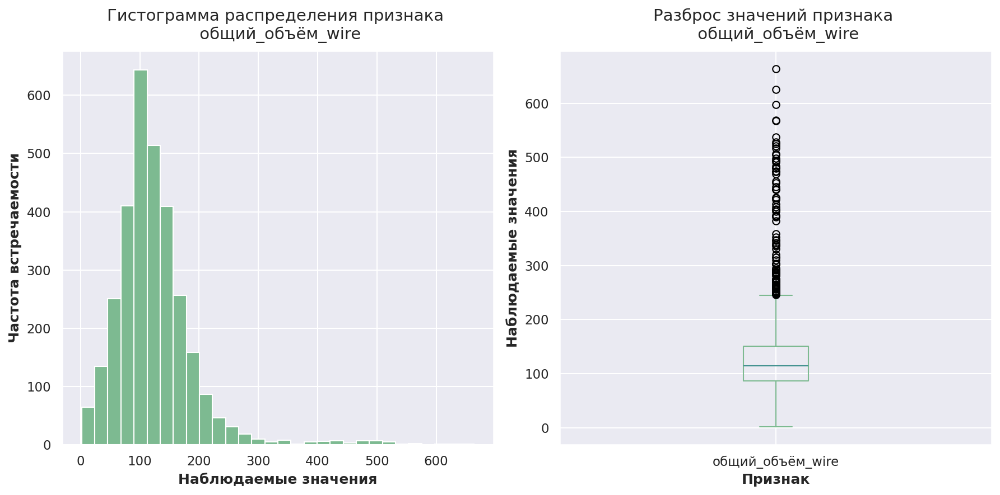

In [112]:
visuals(data_wire, 'общий_объём_wire')

<font size="3">
    
**Вывод**

Признак `общий_объём_wire` - общий объём добавленных проволочных материалов в каждой партии.
    
Большинство значений располагается в промежутке от **86.112** до **150.181**, пик находится в районе 100. Среднее значение выше медианного, что указывает на некоторую асимметрию распределения.

Стандартное отклонение составляет **66.083**, что указывает на значительную вариативность в данных, некоторые партии могут иметь значительно больший объём добавленных материалов.
    
Можно отметить, что максимальный объём материалов (**663.852**) сильно удалён от 75% квартиля (**150.181**), что говорит о наличии выбивающихся значений, которые могут быть связаны с отдельными особенностями технологического процесса или варьированием требований к разным партиям.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="3">
    
- **Количество добавленных материалов**

In [113]:
# добавим признак "количество_материалов_wire"
data_wire['количество_материалов_wire'] = (data_wire.iloc[:, 1:10] != 0).sum(axis=1)

In [114]:
# проверим результат
data_wire.sample(5, random_state=SEED)

,key,wire_1,wire_2,wire_3,wire_4,wire_5,wire_6,wire_7,wire_8,wire_9,общий_объём_wire,количество_материалов_wire
2267,2385,90.112,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,90.112,1
243,265,62.200,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,62.200,1
1079,1146,114.192,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,114.192,1
2690,2831,105.050,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,105.050,1
2761,2914,37.958,45.180,0.000,0.000,0.000,0.000,0.000,0.000,0.000,83.138,2


<font size="3"> Изучим полученный признак: 

count   3,081.000
mean        1.410
std         0.578
min         1.000
25%         1.000
50%         1.000
75%         2.000
max         5.000
Name: количество_материалов_wire, dtype: float64

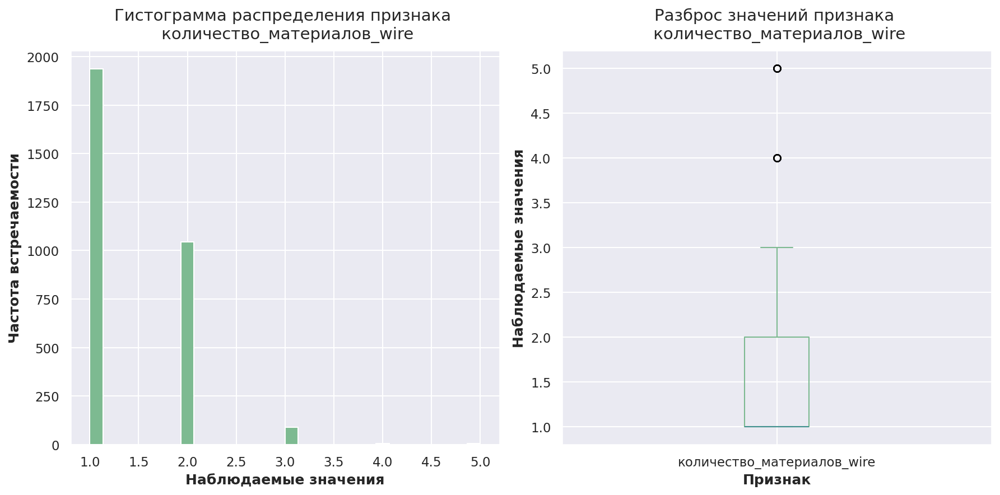

In [115]:
visuals(data_wire, 'количество_материалов_wire')

<font size="3">
    
**Вывод**

Признак `количество_материалов_wire` - сколько видов проволочных материалов было добавлено в партию.
    
Большинство значений располагается в промежутке от **1** до **2** видов, пик находится в районе 1, что указывает на тенденцию к добавлению только одного вида материала в большинстве случаев.

Стандартное отклонение составляет **0.578**, что указывает на умеренный разброс значений признака.
    
Количество видов добавленных материалов обусловлено особенностями технологического процесса: в некоторые партии добавляется только один вид материала, тогда как в другие - 5 разных видов проволочных материалов. 

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

### Таблица `data_wire_time`

<font size="3"> Изучим подробнее таблицу, содержащую данные об объёме проволочных материалов.

<font size="4">
    
#### Тип данных

In [116]:
data_wire_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   key     3081 non-null   int64 
 1   wire_1  3055 non-null   object
 2   wire_2  1079 non-null   object
 3   wire_3  63 non-null     object
 4   wire_4  14 non-null     object
 5   wire_5  1 non-null      object
 6   wire_6  73 non-null     object
 7   wire_7  11 non-null     object
 8   wire_8  19 non-null     object
 9   wire_9  29 non-null     object
dtypes: int64(1), object(9)
memory usage: 240.8+ KB


<font size="3"> Приведём столбцы с временем подачи проволочных материалов к формату **datetime**.

In [117]:
# получаем названия столбцов с датой
date_columns = data_wire_time.columns[1:10]

# преобразуем выбранные столбцы в формат datetime
for col in date_columns:
    data_wire_time[col] = pd.to_datetime(data_wire_time[col])

In [118]:
# проверим результат
data_wire_time.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3081 entries, 0 to 3080
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   key     3081 non-null   int64         
 1   wire_1  3055 non-null   datetime64[ns]
 2   wire_2  1079 non-null   datetime64[ns]
 3   wire_3  63 non-null     datetime64[ns]
 4   wire_4  14 non-null     datetime64[ns]
 5   wire_5  1 non-null      datetime64[ns]
 6   wire_6  73 non-null     datetime64[ns]
 7   wire_7  11 non-null     datetime64[ns]
 8   wire_8  19 non-null     datetime64[ns]
 9   wire_9  29 non-null     datetime64[ns]
dtypes: datetime64[ns](9), int64(1)
memory usage: 240.8 KB


<font size="3"> Все столбцы датафрейма содержат корректный тип данных.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">
    
#### Проверка пропусков

<font size="3"> Гистограммы `msno` показали наличие пропущенных значений в датафреймах, изучим их подробнее.

In [119]:
missing_count(data_wire_time)

key          0
wire_1      26
wire_2    2002
wire_3    3018
wire_4    3067
wire_5    3080
wire_6    3008
wire_7    3070
wire_8    3062
wire_9    3052
dtype: int64

key - 0%
wire_1 - 1%
wire_2 - 65%
wire_3 - 98%
wire_4 - 100%
wire_5 - 100%
wire_6 - 98%
wire_7 - 100%
wire_8 - 99%
wire_9 - 99%


<font size="3"> Датафрейм содержит пропуски, аналогичные таблице `data_wire` и также означают, что материал не добавляли в партию.
    
На данном этапе оставим пропуски в формате `NaT` для удобства дальнейшего расчёта временных интервалов.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">

#### Проверка дубликатов

<font size="3"> Проверим наличие дубликатов в датафрейме.

In [120]:
print(f'Количество дубликатов в датафрейме: {data_wire.duplicated().sum()}')

Количество дубликатов в датафрейме: 0


<font size="3"> Явные дубликаты отсутствуют.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">

#### Добавление признаков

<font size="3"> Для удобства проведения анализа создадим дополнительный признак.

**Время от добавления первого до добавления последнего материала в партию** (`общее_время_wire`) – разница в секундах между максимальным и минимальным временем подачи материала для каждой партии.

In [121]:
# добавим признак "общее_время_wire"
data_wire_time["общее_время_wire"] = (
    data_wire_time.iloc[:, 1:10].max(axis=1) - data_wire_time.iloc[:, 1:10].min(axis=1)
).dt.total_seconds()

In [122]:
# проверим результат
data_wire_time.sample(5, random_state=SEED)

,key,wire_1,wire_2,wire_3,wire_4,wire_5,wire_6,wire_7,wire_8,wire_9,общее_время_wire
2267,2385,2019-08-06 13:02:37,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,0.000
243,265,2019-05-13 19:13:19,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,0.000
1079,1146,2019-06-16 04:40:13,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,0.000
2690,2831,2019-08-23 00:33:37,NaT,NaT,NaT,NaT,NaT,NaT,NaT,NaT,0.000
2761,2914,2019-08-26 04:18:17,2019-08-26 04:12:43,NaT,NaT,NaT,NaT,NaT,NaT,NaT,334.000


<font size="3"> Изучим полученный признак: 

count   3,081.000
mean      214.519
std       396.132
min         0.000
25%         0.000
50%         0.000
75%       401.000
max     5,937.000
Name: общее_время_wire, dtype: float64

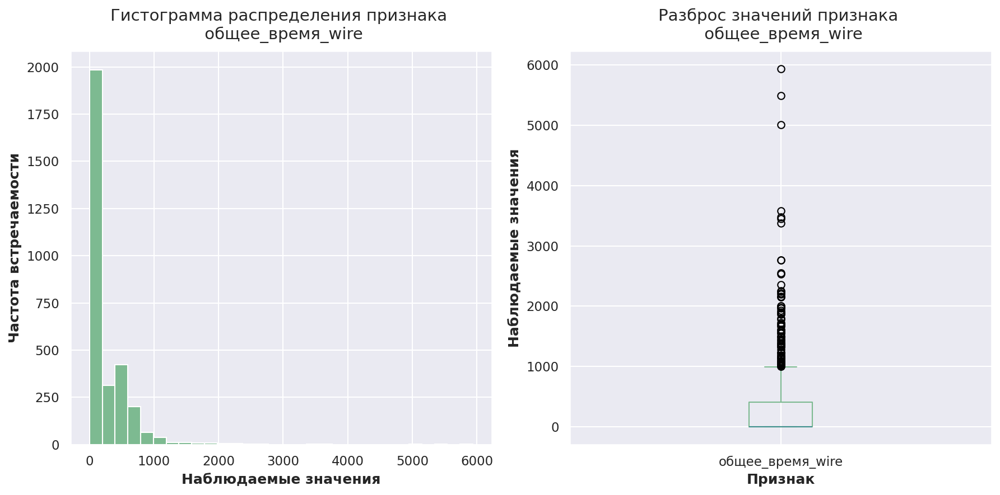

In [123]:
visuals(data_wire_time, 'общее_время_wire')

<font size="3">
    
**Вывод:**

Признак `общее_время_wire` - время от добавления первого до добавления последнего проволочного материала в партию.
    
Большинство значений располагается в промежутке от **0** до **401** секунды, пик находится в районе 0, нулевые значения в данном случае логичны и соответствуют партиям, в которые добавлялся только один материал.

Стандартное отклонение составляет **396.132**, что указывает на сильную вариативность значений признака.
    
Время от добавления первого до добавления последнего материала в партию связано с количеством добавленных видов материалов и особенностями технологического процесса: для партий с одним видом материала время между первым и последним добавленным материалом составляет 0, а для партий с 5 видами это время может значительно увеличиваться. 

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> 
    
Отлично, что есть подключение к базам данных)

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

### Объединение таблиц

<font size="3"> Объединим таблицы по ключу, учитывая следующие особенности: 
  * каждой партии должно соответствовать одно наблюдение;
  * во все партии точно добавлялись сыпучие и проволочные материалы, везде была выполнена продувка газом и сплав всегда нагревался.
    
Предварительно найдём количество уникальных партий, которые встречаются в каждой таблице. 

In [124]:
# получим наборы ключей для каждой таблицы
keys_arc = set(data_arc['key'])
keys_bulk = set(data_bulk['key'])
keys_bulk_time = set(data_bulk_time['key'])
keys_wire = set(data_wire['key'])
keys_wire_time = set(data_wire_time['key'])
keys_gas = set(data_gas['key'])
keys_temp = set(data_temp['key'])

# найдём пересечение всех наборов ключей
common_keys = keys_arc & keys_bulk & keys_bulk_time & keys_wire & keys_wire_time & keys_gas & keys_temp

In [125]:
# выведем результат
print(f"Количество общих ключей: {len(common_keys)}")

Количество общих ключей: 2329


<font size="3"> Во всех таблицах встречается **2329** уникальных ключей, столько объектов должно получиться в итоговой выборке после объединения таблиц.

In [126]:
# объединяем таблицы
steel_temp = reduce(
    lambda x, y: pd.merge(x, y, on='key', how='inner'),
    [
        data_arc_agg,                             # данные о нагреве
        data_bulk,                                # сыпучие материалы
        data_bulk_time.iloc[:, np.r_[0, -1]],     # время добавления сыпучих материалов
        data_wire,                                # проволочные материалы
        data_wire_time.iloc[:, np.r_[0, -1]],     # время добавления проволочных материалов
        data_gas,                                 # данные о газе
        data_temp                                 # температурные данные
    ]
)

<font size="3"> Проверим целостность данных после объединения

In [127]:
# количество уникальных партий
steel_temp['key'].nunique()

2329

Первые 5 строк:


,key,активная_мощность,реактивная_мощность,время_между_нагревами,продолжительность_нагрева,отношение_мощностей,количество_нагревов,полная_мощность,энергия,bulk_1,bulk_2,bulk_3,bulk_4,bulk_5,bulk_6,bulk_7,bulk_8,bulk_9,bulk_10,bulk_11,bulk_12,bulk_13,bulk_14,bulk_15,общий_объём_bulk,количество_материалов_bulk,общее_время_bulk,wire_1,wire_2,wire_3,wire_4,wire_5,wire_6,wire_7,wire_8,wire_9,общий_объём_wire,количество_материалов_wire,общее_время_wire,газ_1,начальная_температура,конечная_температура
0,1,0.607,0.429,"1,435.000","1,098.000",1.422,5,3.719,770.282,0.000,0.000,0.000,43.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,206.000,0.000,150.000,154.000,553.000,4,"1,085.000",60.060,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,60.060,1,0.000,29.750,"1,571.000","1,613.000"
1,2,0.535,0.363,934.000,811.000,1.479,4,2.588,481.760,0.000,0.000,0.000,73.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,206.000,0.000,149.000,154.000,582.000,4,"1,000.000",96.052,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,96.052,1,0.000,12.556,"1,581.000","1,602.000"
2,3,0.813,0.587,"1,460.000",655.000,1.396,5,5.019,722.838,0.000,0.000,0.000,34.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,205.000,0.000,152.000,153.000,544.000,4,983.000,91.160,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,91.160,1,0.000,28.555,"1,596.000","1,599.000"
3,4,0.677,0.514,815.000,741.000,1.307,4,3.400,683.456,0.000,0.000,0.000,81.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,207.000,0.000,153.000,154.000,595.000,4,878.000,89.064,0.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,89.064,1,0.000,18.841,"1,601.000","1,625.000"
4,5,0.563,0.422,"1,291.000",869.000,1.329,4,2.817,512.170,0.000,0.000,0.000,78.000,0.000,0.000,0.000,0.000,0.000,0.000,0.000,203.000,0.000,151.000,152.000,584.000,4,205.000,89.238,9.115,0.000,0.000,0.000,0.000,0.000,0.000,0.000,98.353,2,310.000,5.414,"1,576.000","1,602.000"



 Тип данных:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2329 entries, 0 to 2328
Data columns (total 42 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   key                         2329 non-null   int64  
 1   активная_мощность           2329 non-null   float64
 2   реактивная_мощность         2329 non-null   float64
 3   время_между_нагревами       2329 non-null   float64
 4   продолжительность_нагрева   2329 non-null   float64
 5   отношение_мощностей         2329 non-null   float64
 6   количество_нагревов         2329 non-null   int64  
 7   полная_мощность             2329 non-null   float64
 8   энергия                     2329 non-null   float64
 9   bulk_1                      2329 non-null   float64
 10  bulk_2                      2329 non-null   float64
 11  bulk_3                      2329 non-null   float64
 12  bulk_4                      2329 non-null   float64
 13  bulk_5             

None


 Полнота данных:


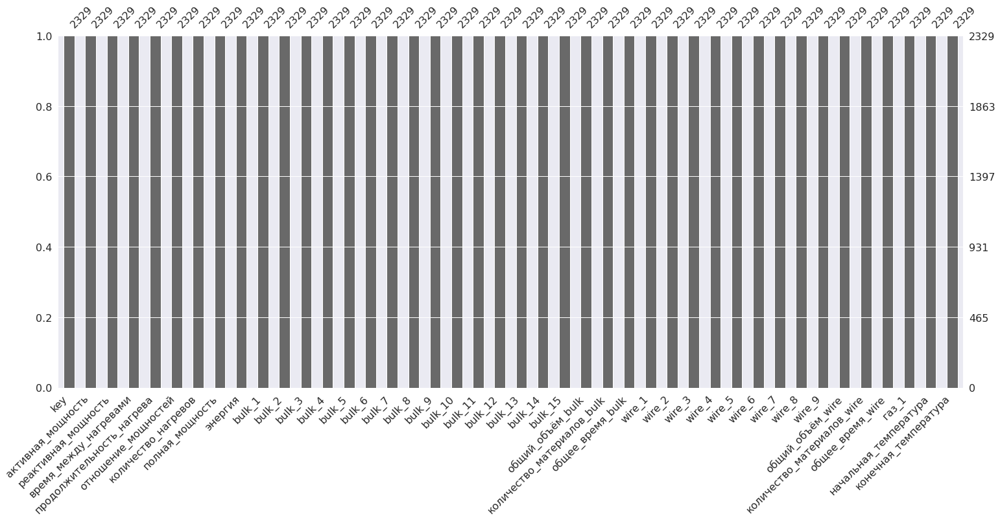

In [128]:
# основная информация
first_look(steel_temp)

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> 

Хорошо, партии, для которых не все замеры температуры известны удалены, таблицы объединены верно

<br/>
<div class="alert alert-block alert-danger">
<h2> Комментарий ревьюера     <a class="tocSkip"></h2>

    
<b>На доработку🤔:</b>
    
После объединения таблиц, для итогового датафрейма нужно вывести графики распределения (или боксплоты) ВСЕХ признаков

<div class="alert alert-info">
<h2> Комментарий студента: <a class="tocSkip"> </h2>

<b>👋:</b> Александр, привет! Спасибо за ревью 🤝🏼
<br>Здесь добавила вывод визуализаций для каждого признака
</div> 

<div class="alert alert-success">
<h2> Комментарий ревьюера 2 <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b>

<font size="3"> Визуализируем распределение всех признаков полученной таблицы:

count   2,329.000
mean        0.664
std         0.128
min         0.268
25%         0.576
50%         0.656
75%         0.742
max         1.244
Name: активная_мощность, dtype: float64

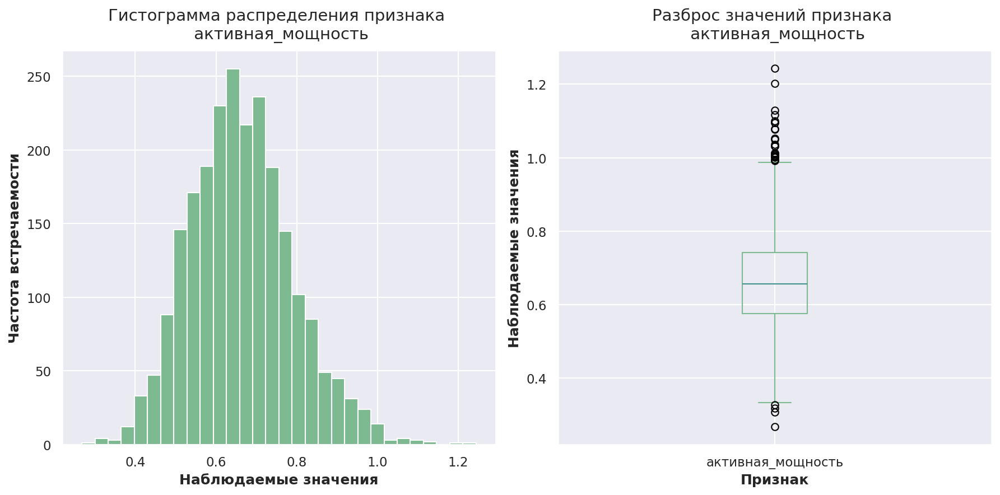

count   2,329.000
mean        0.489
std         0.098
min         0.196
25%         0.420
50%         0.485
75%         0.546
max         0.961
Name: реактивная_мощность, dtype: float64

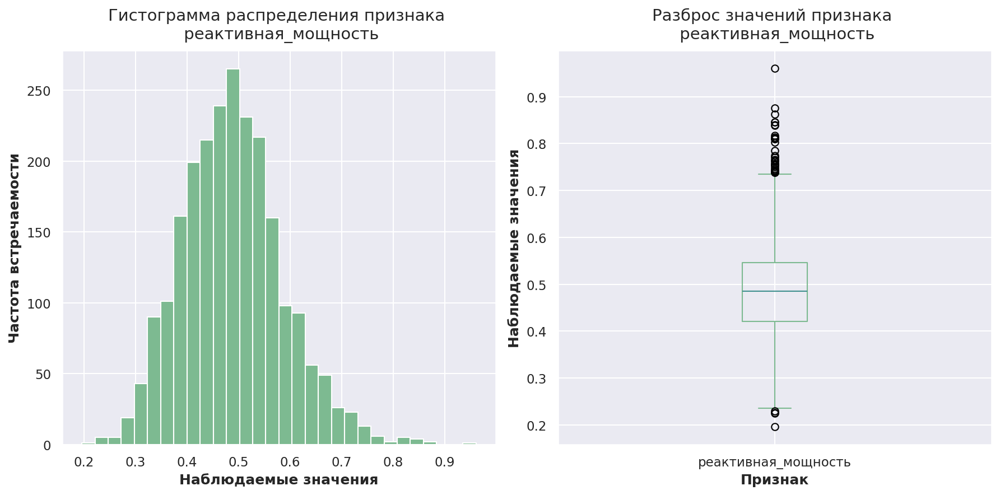

count    2,329.000
mean     1,874.388
std      1,357.499
min          0.000
25%      1,192.000
50%      1,643.000
75%      2,298.000
max     23,378.000
Name: время_между_нагревами, dtype: float64

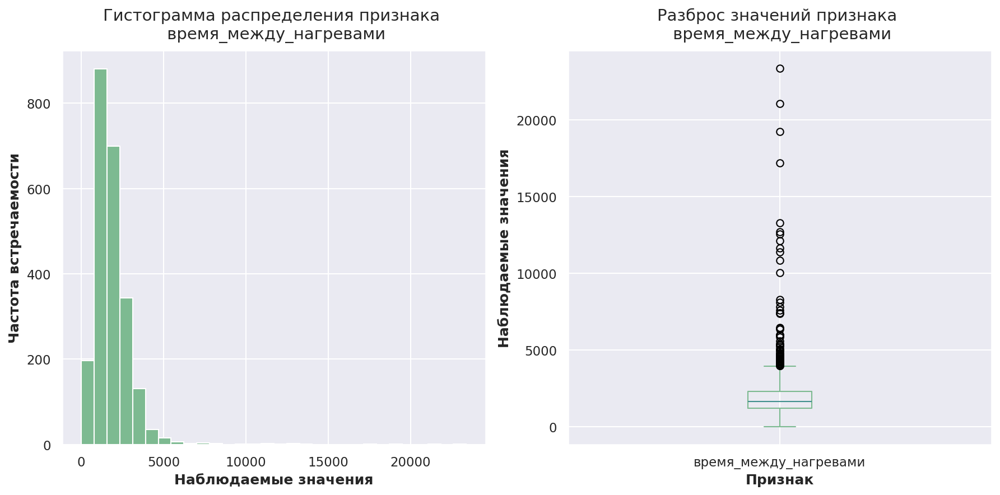

count   2,329.000
mean      807.647
std       340.838
min        57.000
25%       581.000
50%       778.000
75%       993.000
max     4,189.000
Name: продолжительность_нагрева, dtype: float64

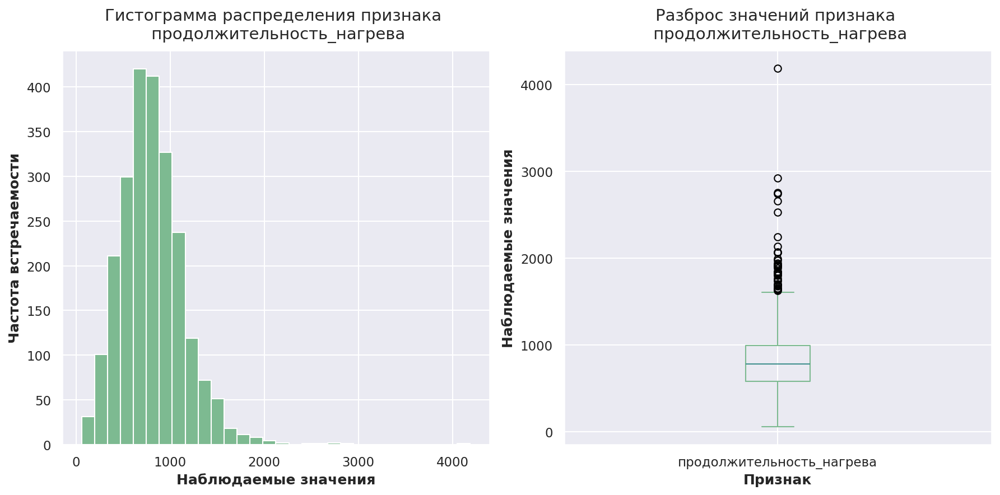

count   2,329.000
mean        1.371
std         0.066
min         1.100
25%         1.329
50%         1.372
75%         1.415
max         1.663
Name: отношение_мощностей, dtype: float64

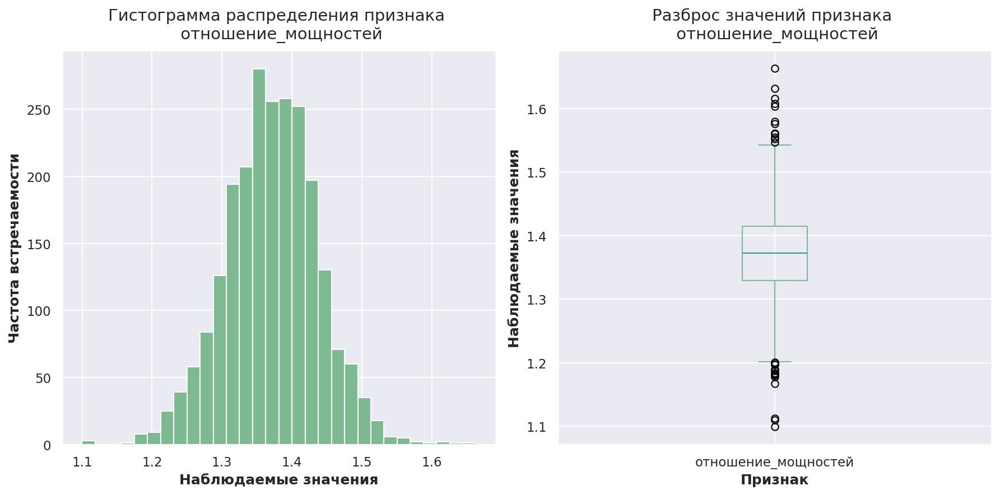

count   2,329.000
mean        4.696
std         1.607
min         1.000
25%         4.000
50%         5.000
75%         6.000
max        16.000
Name: количество_нагревов, dtype: float64

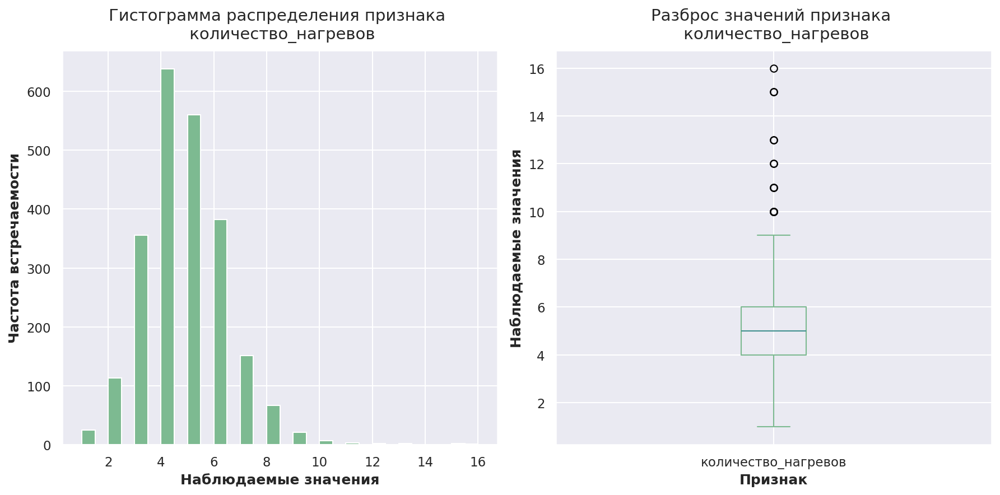

count   2,329.000
mean        3.885
std         1.518
min         0.332
25%         2.844
50%         3.767
75%         4.769
max        15.288
Name: полная_мощность, dtype: float64

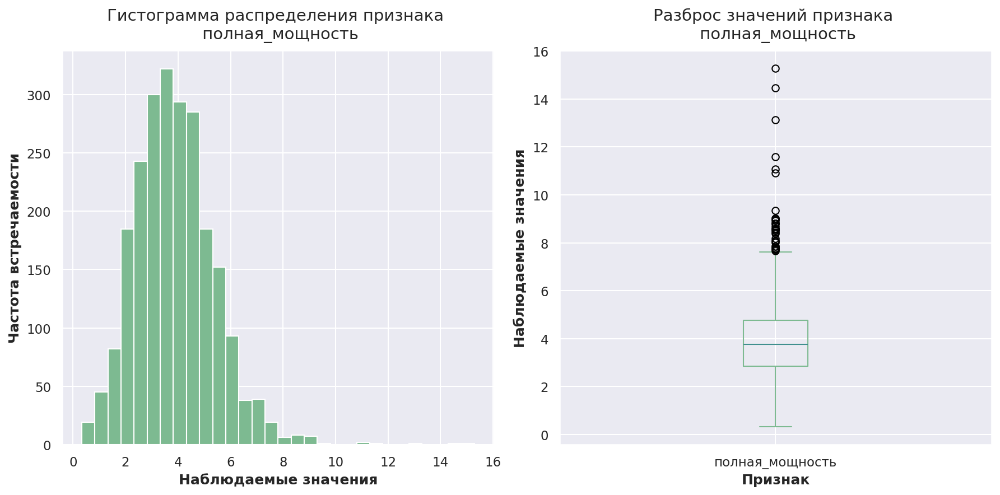

count   2,329.000
mean      669.782
std       319.487
min        33.430
25%       457.865
50%       630.714
75%       841.398
max     4,546.406
Name: энергия, dtype: float64

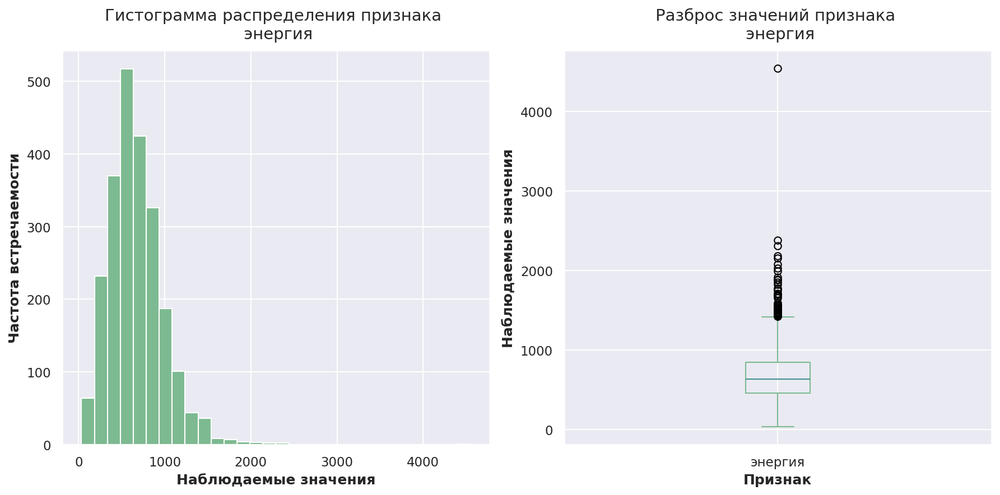

count   2,329.000
mean        3.428
std        12.412
min         0.000
25%         0.000
50%         0.000
75%         0.000
max       185.000
Name: bulk_1, dtype: float64

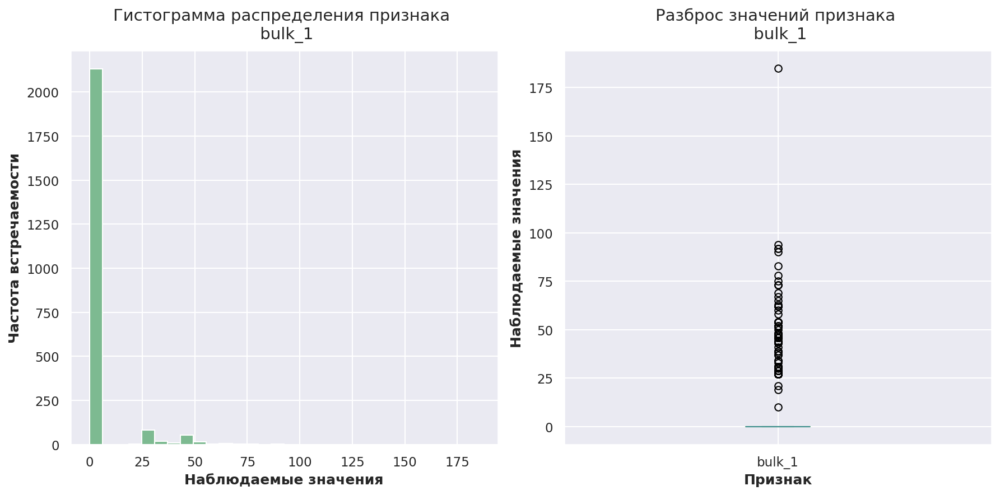

count   2,329.000
mean        1.422
std        19.082
min         0.000
25%         0.000
50%         0.000
75%         0.000
max       325.000
Name: bulk_2, dtype: float64

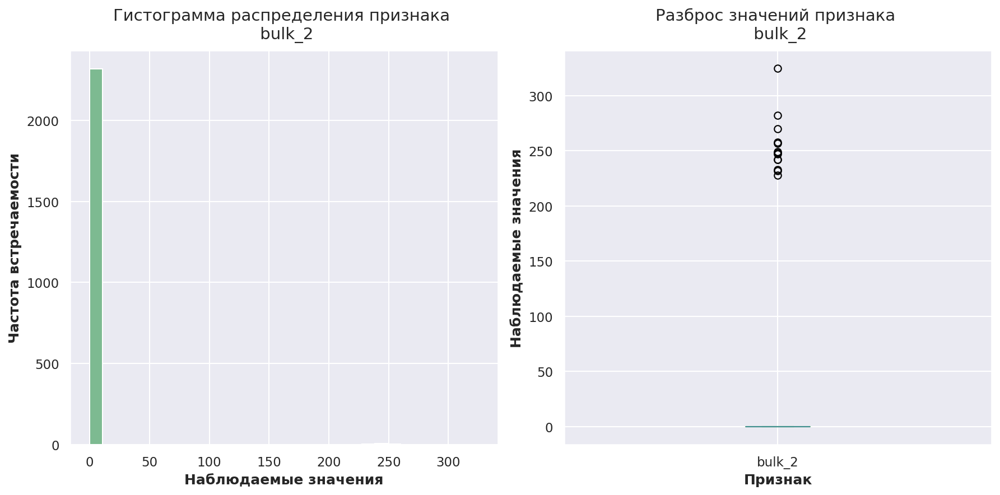

count   2,329.000
mean       47.348
std        75.310
min         0.000
25%         0.000
50%         0.000
75%        80.000
max       454.000
Name: bulk_3, dtype: float64

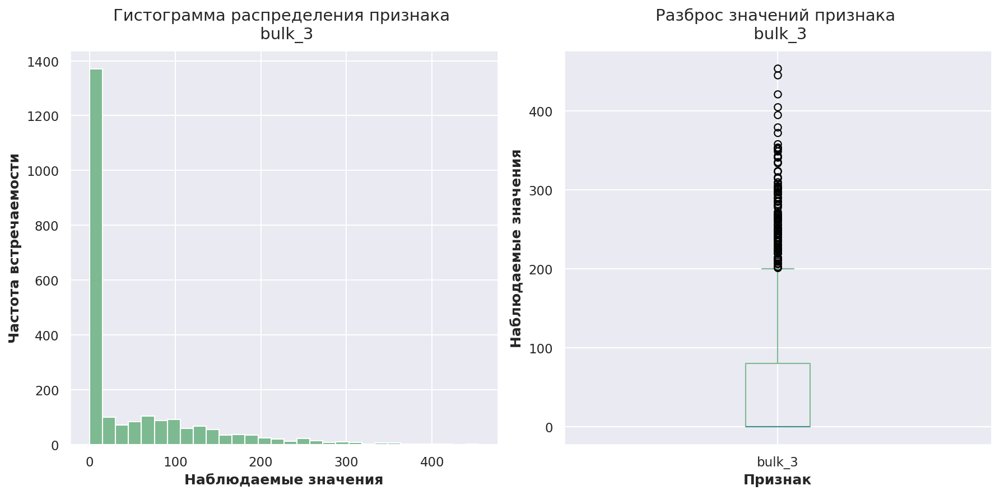

count   2,329.000
mean       37.304
std        58.643
min         0.000
25%         0.000
50%         0.000
75%        77.000
max       281.000
Name: bulk_4, dtype: float64

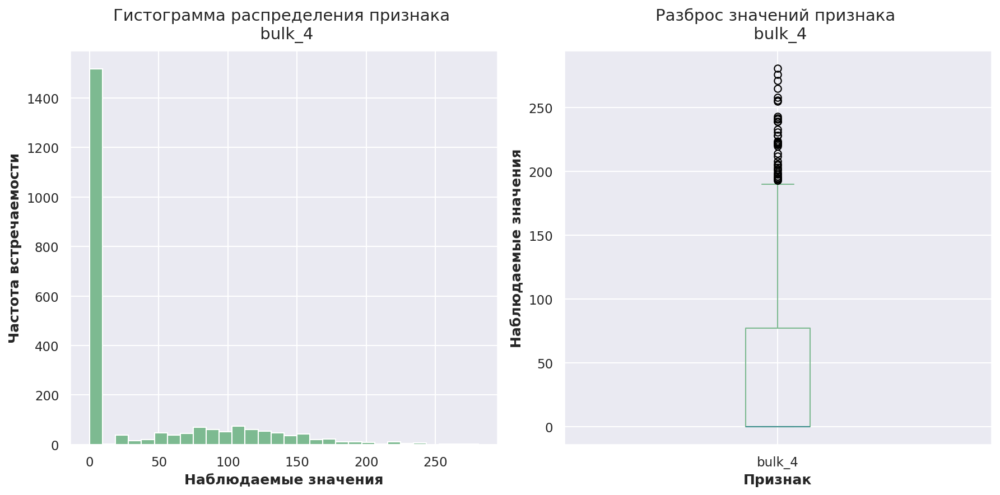

count   2,329.000
mean        2.640
std        22.402
min         0.000
25%         0.000
50%         0.000
75%         0.000
max       603.000
Name: bulk_5, dtype: float64

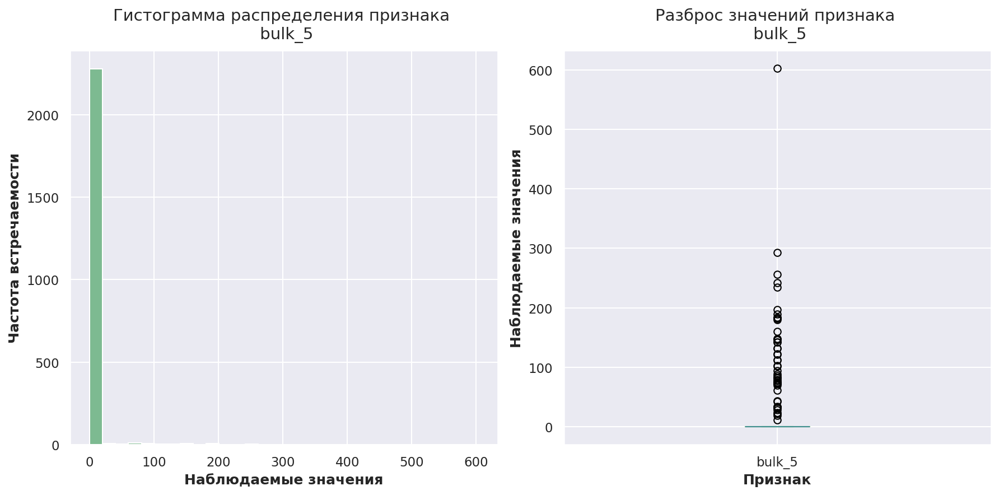

count   2,329.000
mean       22.430
std        55.791
min         0.000
25%         0.000
50%         0.000
75%         0.000
max       503.000
Name: bulk_6, dtype: float64

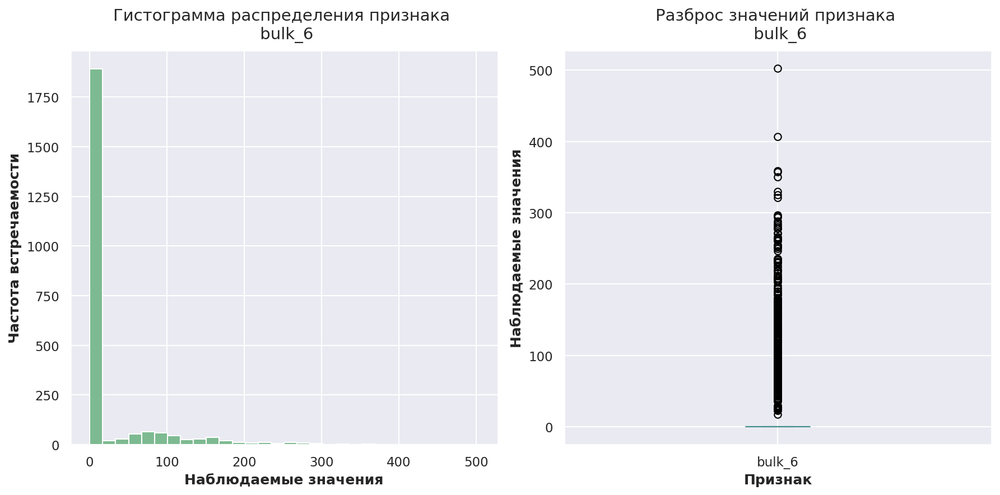

count   2,329.000
mean        2.005
std        30.676
min         0.000
25%         0.000
50%         0.000
75%         0.000
max       772.000
Name: bulk_7, dtype: float64

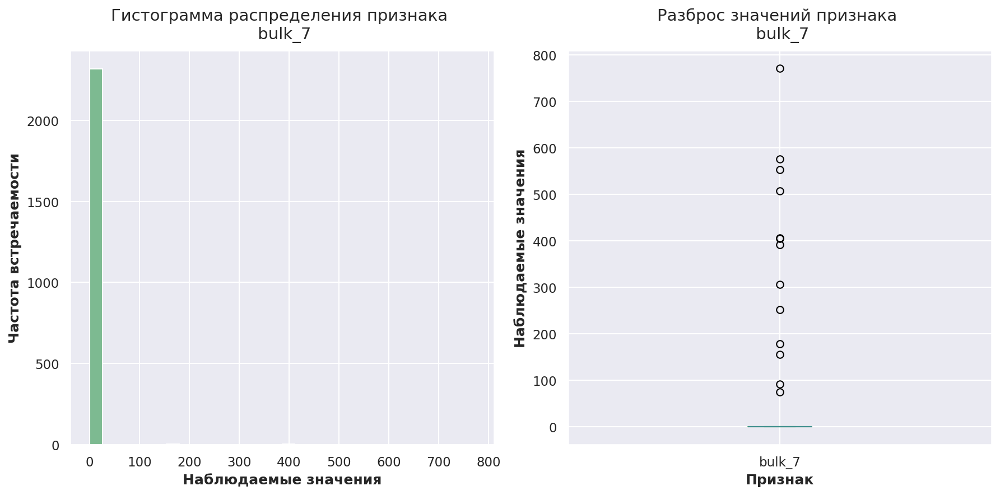

count   2,329.000
mean        0.021
std         1.015
min         0.000
25%         0.000
50%         0.000
75%         0.000
max        49.000
Name: bulk_8, dtype: float64

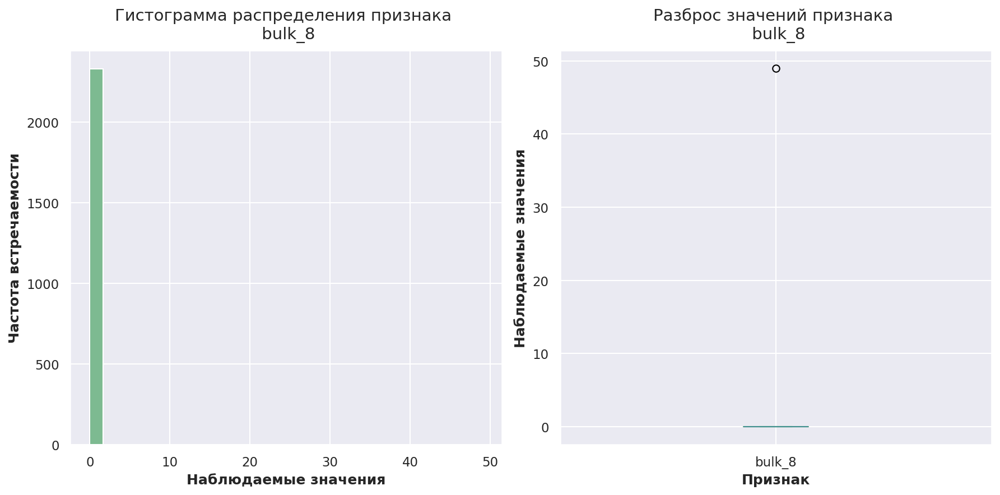

count   2,329.000
mean        0.445
std         6.221
min         0.000
25%         0.000
50%         0.000
75%         0.000
max       147.000
Name: bulk_9, dtype: float64

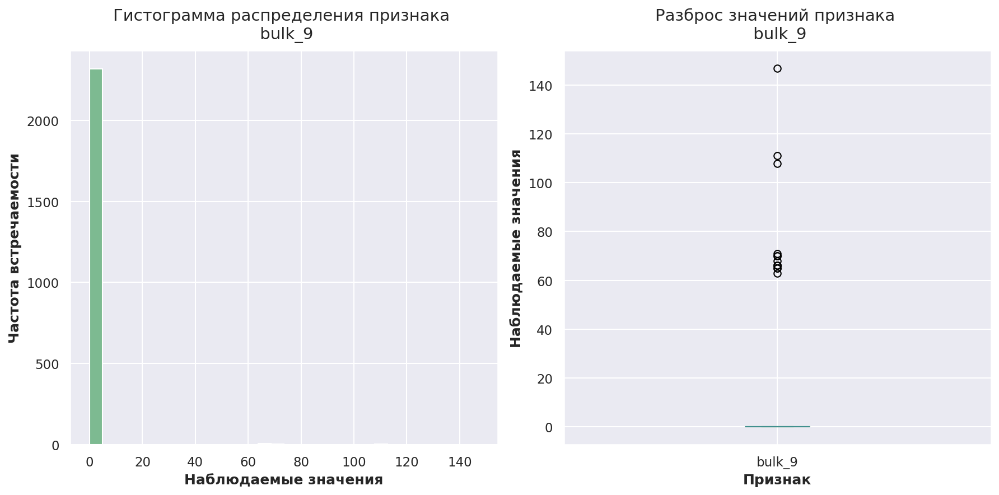

count   2,329.000
mean        5.053
std        20.918
min         0.000
25%         0.000
50%         0.000
75%         0.000
max       159.000
Name: bulk_10, dtype: float64

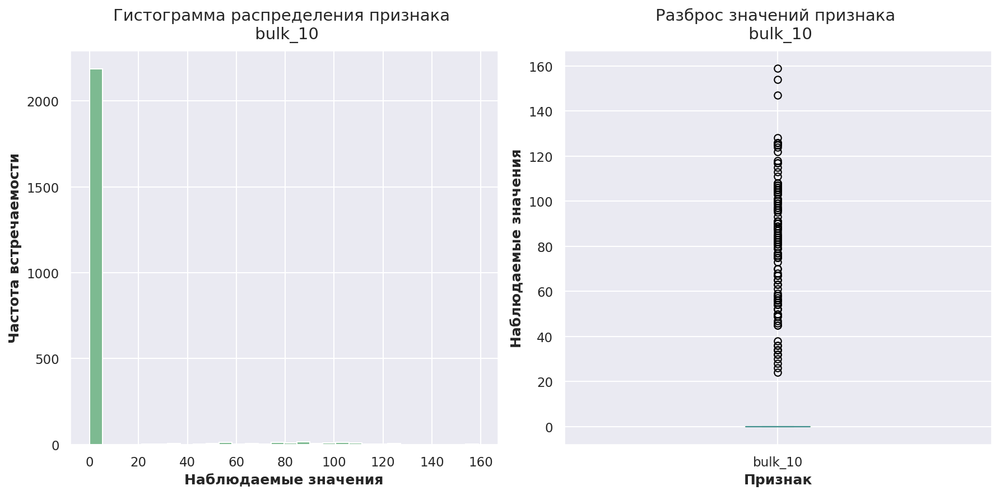

count   2,329.000
mean        4.245
std        22.515
min         0.000
25%         0.000
50%         0.000
75%         0.000
max       313.000
Name: bulk_11, dtype: float64

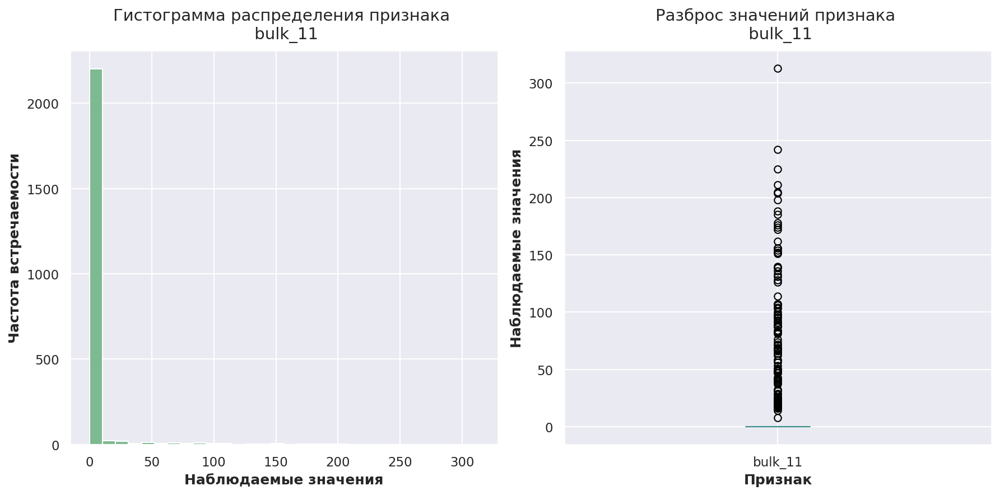

count   2,329.000
mean      208.416
std       157.062
min         0.000
25%       105.000
50%       206.000
75%       282.000
max     1,849.000
Name: bulk_12, dtype: float64

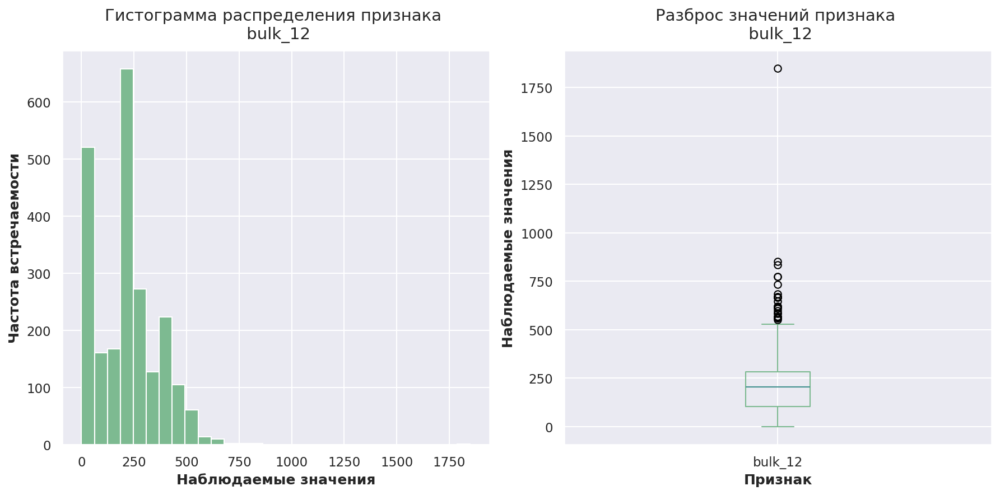

count   2,329.000
mean        1.067
std        14.235
min         0.000
25%         0.000
50%         0.000
75%         0.000
max       305.000
Name: bulk_13, dtype: float64

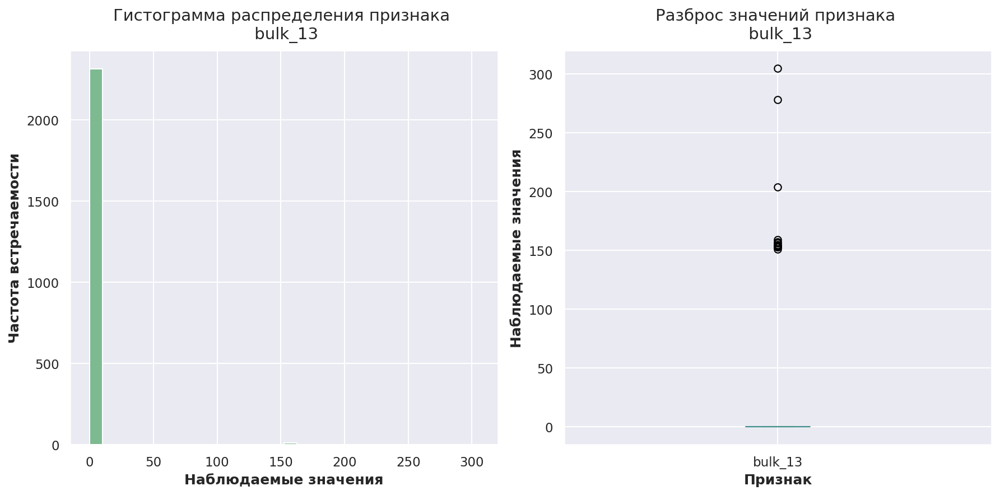

count   2,329.000
mean      153.854
std        81.404
min         0.000
25%       105.000
50%       149.000
75%       204.000
max       636.000
Name: bulk_14, dtype: float64

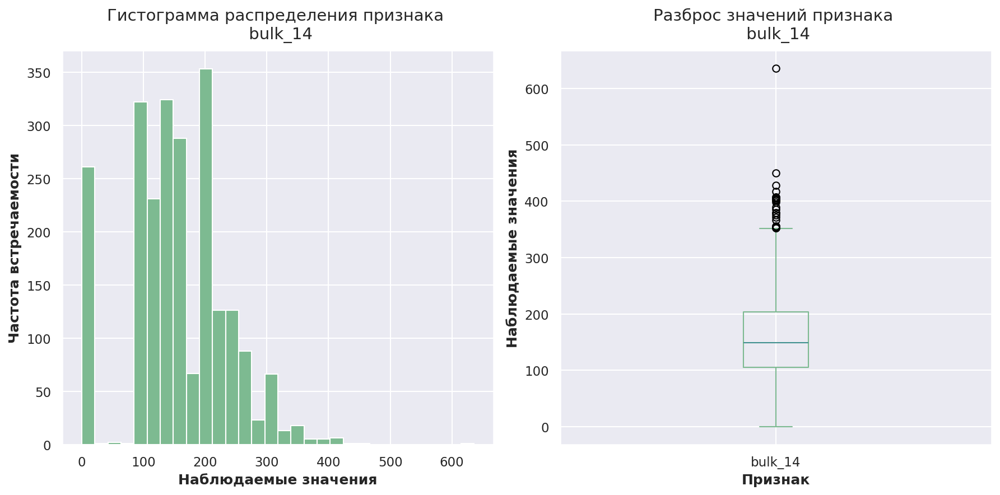

count   2,329.000
mean      119.953
std        84.640
min         0.000
25%         0.000
50%       107.000
75%       204.000
max       405.000
Name: bulk_15, dtype: float64

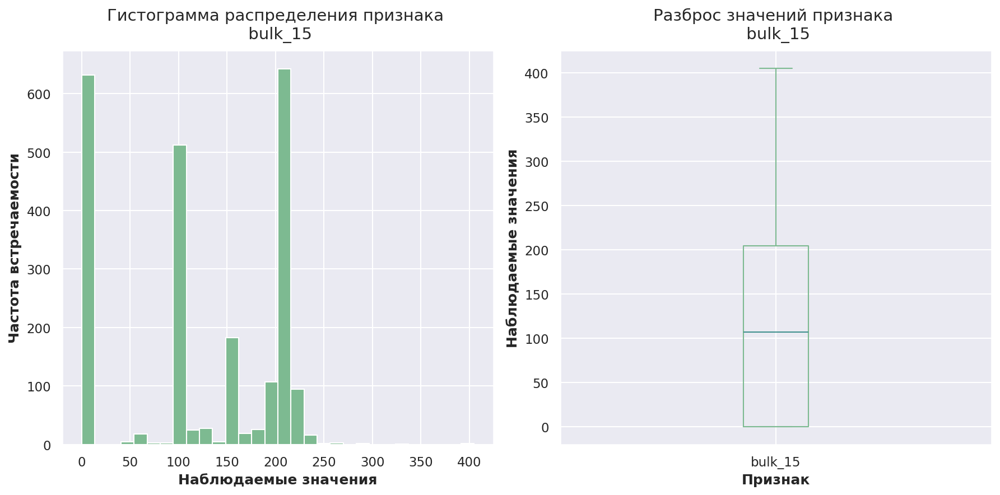

count   2,329.000
mean      609.630
std       287.600
min        19.000
25%       440.000
50%       609.000
75%       795.000
max     3,235.000
Name: общий_объём_bulk, dtype: float64

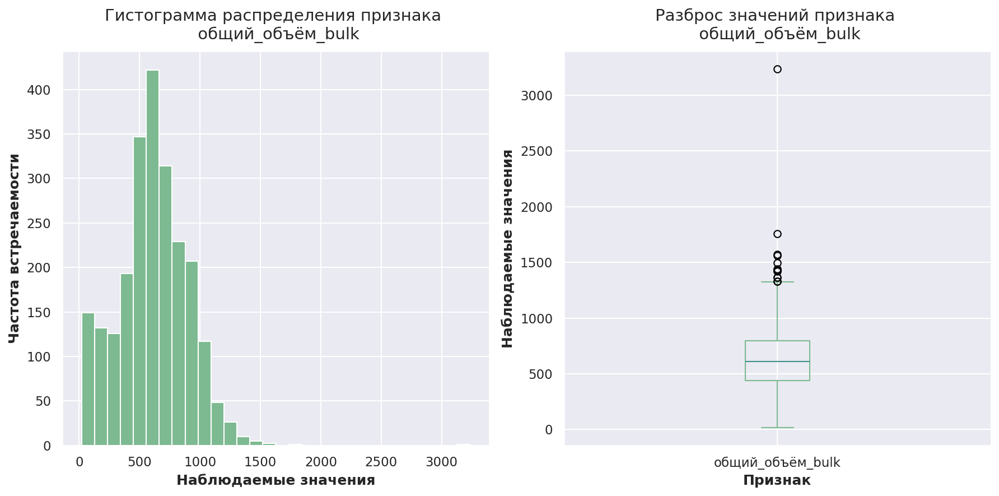

count   2,329.000
mean        3.593
std         1.224
min         1.000
25%         3.000
50%         4.000
75%         4.000
max         7.000
Name: количество_материалов_bulk, dtype: float64

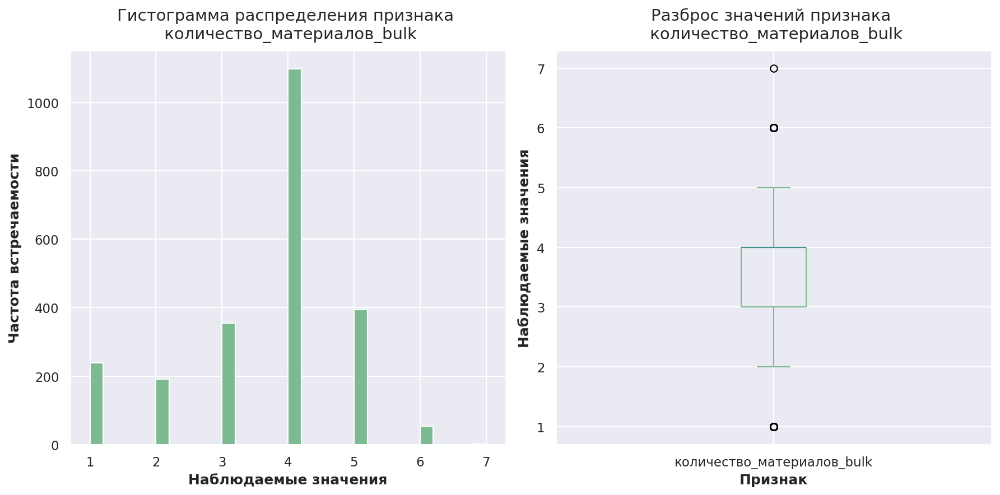

count    2,329.000
mean       985.906
std        815.669
min          0.000
25%        501.000
50%        894.000
75%      1,340.000
max     13,683.000
Name: общее_время_bulk, dtype: float64

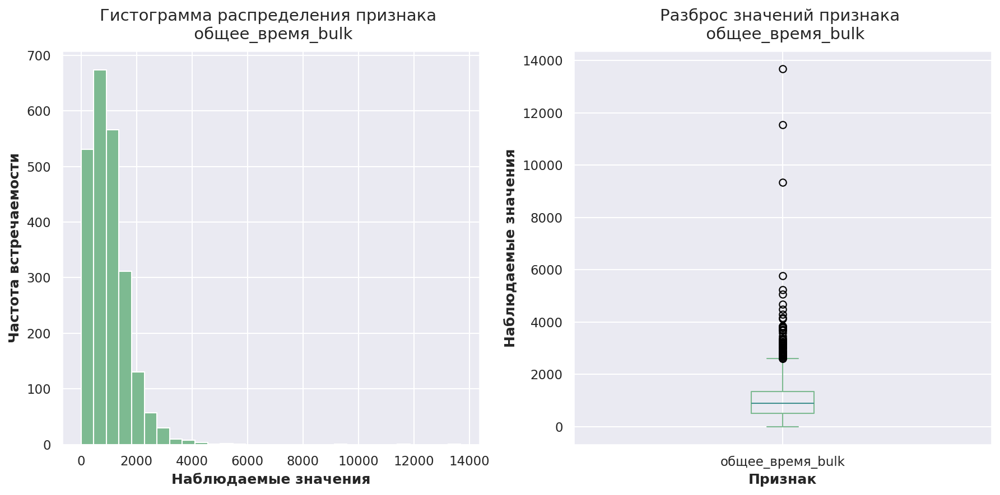

count   2,329.000
mean      102.444
std        43.540
min         0.000
25%        73.208
50%       101.119
75%       128.092
max       330.314
Name: wire_1, dtype: float64

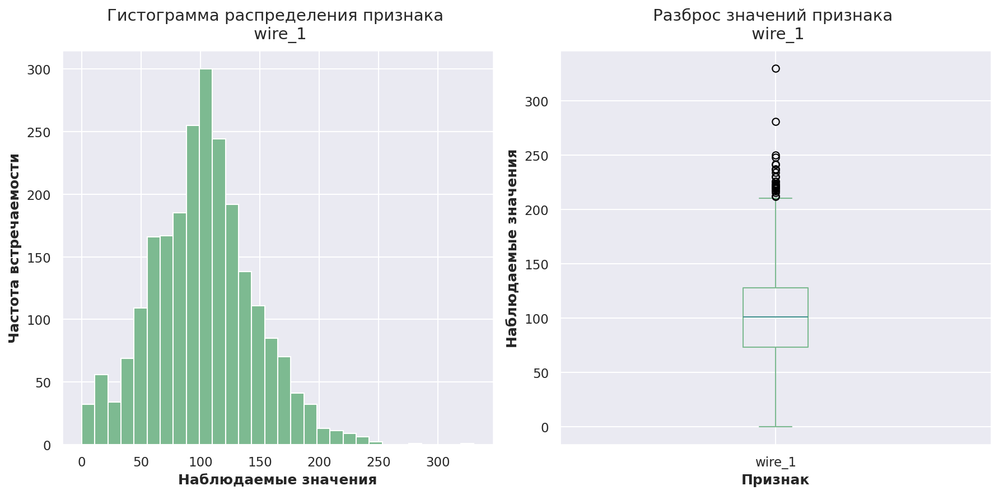

count   2,329.000
mean       17.610
std        33.625
min         0.000
25%         0.000
50%         0.000
75%        23.103
max       282.780
Name: wire_2, dtype: float64

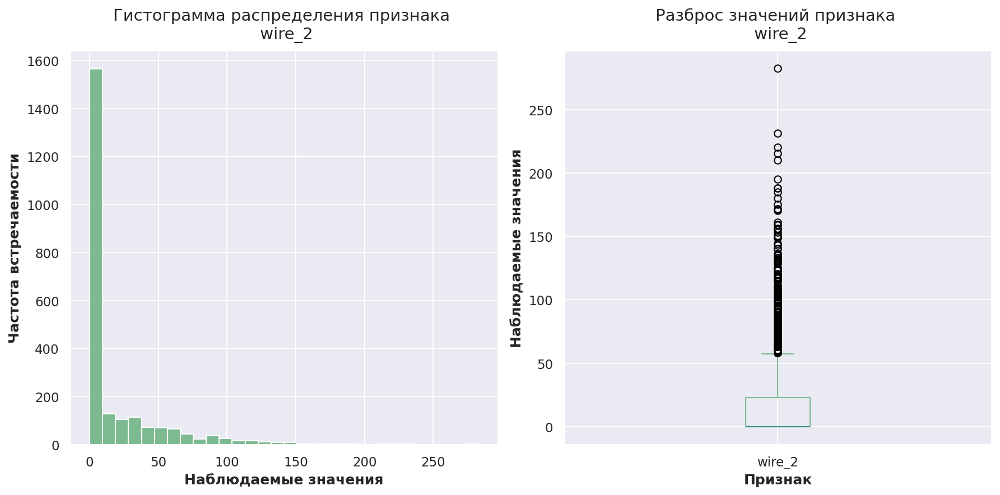

count   2,329.000
mean        3.235
std        27.943
min         0.000
25%         0.000
50%         0.000
75%         0.000
max       385.009
Name: wire_3, dtype: float64

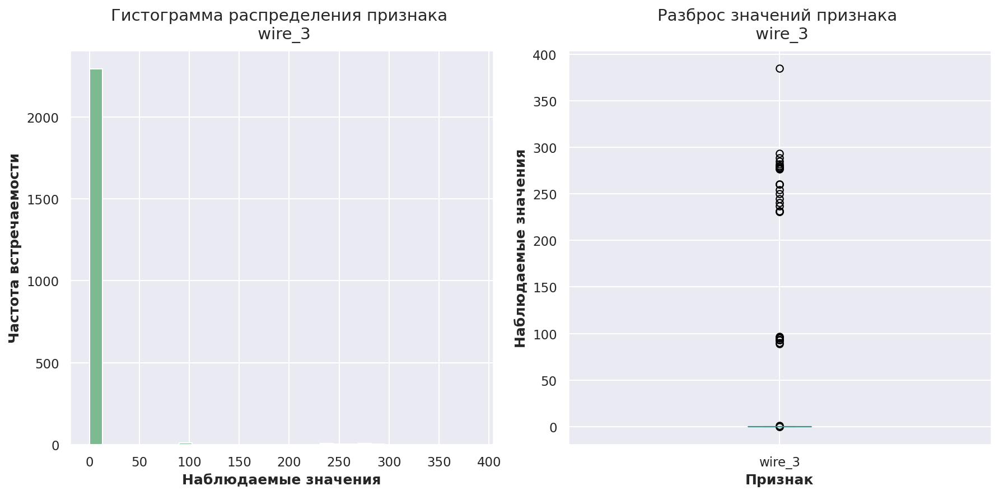

count   2,329.000
mean        0.307
std         4.758
min         0.000
25%         0.000
50%         0.000
75%         0.000
max       113.231
Name: wire_4, dtype: float64

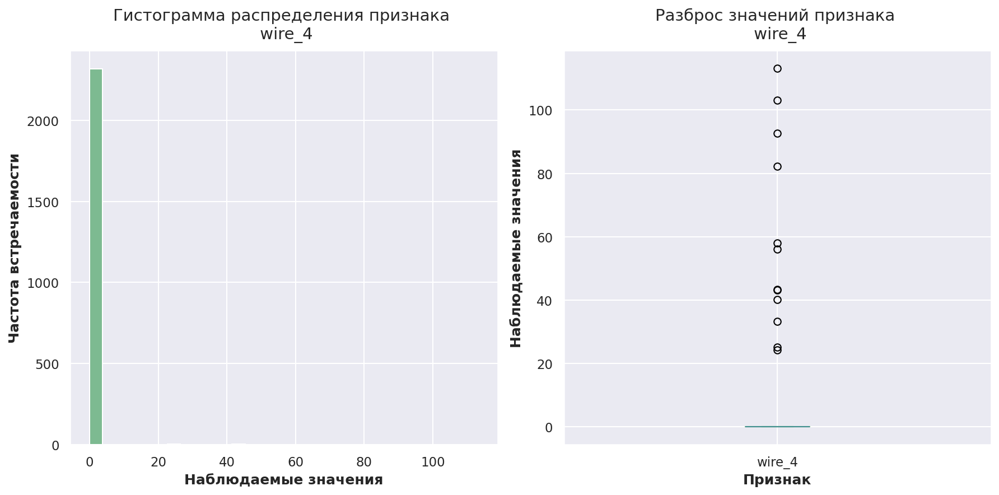

count   2,329.000
mean        0.000
std         0.000
min         0.000
25%         0.000
50%         0.000
75%         0.000
max         0.000
Name: wire_5, dtype: float64

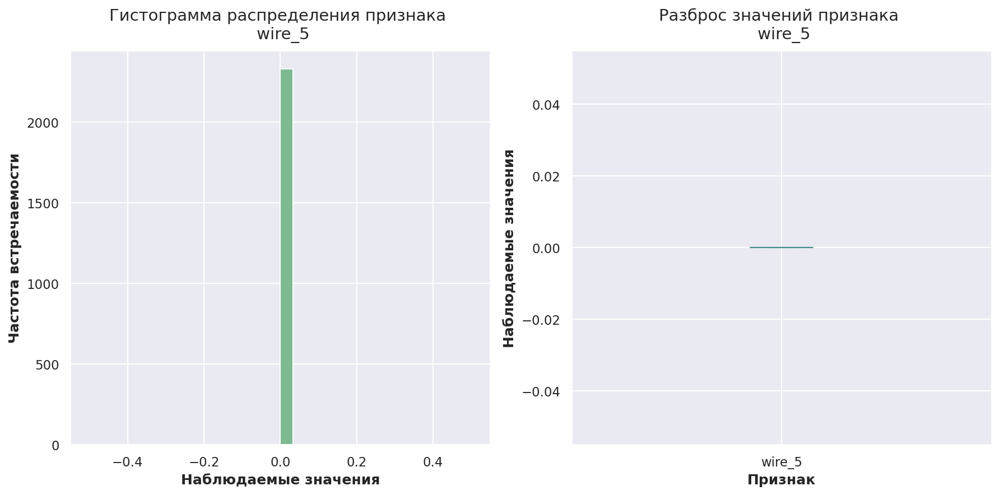

count   2,329.000
mean        0.979
std         8.693
min         0.000
25%         0.000
50%         0.000
75%         0.000
max       180.455
Name: wire_6, dtype: float64

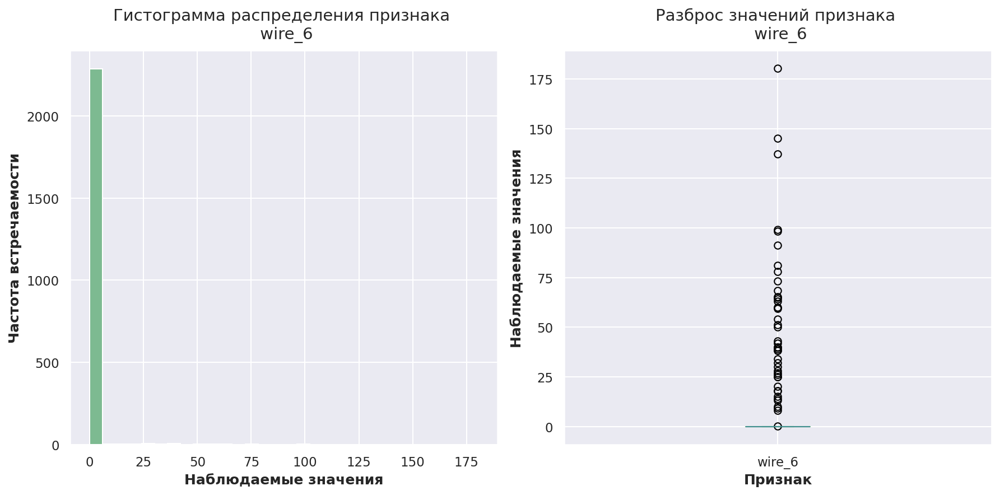

count   2,329.000
mean        0.006
std         0.206
min         0.000
25%         0.000
50%         0.000
75%         0.000
max         8.490
Name: wire_7, dtype: float64

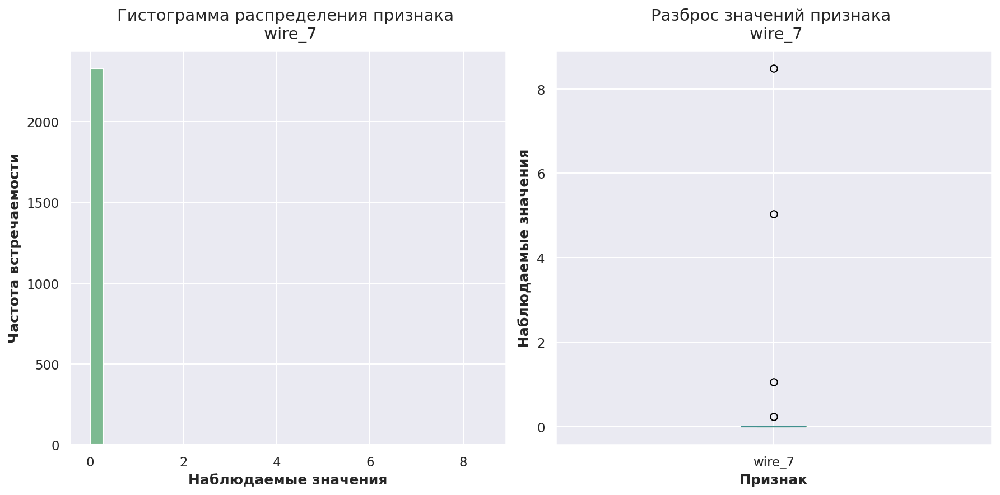

count   2,329.000
mean        0.311
std         4.403
min         0.000
25%         0.000
50%         0.000
75%         0.000
max       102.762
Name: wire_8, dtype: float64

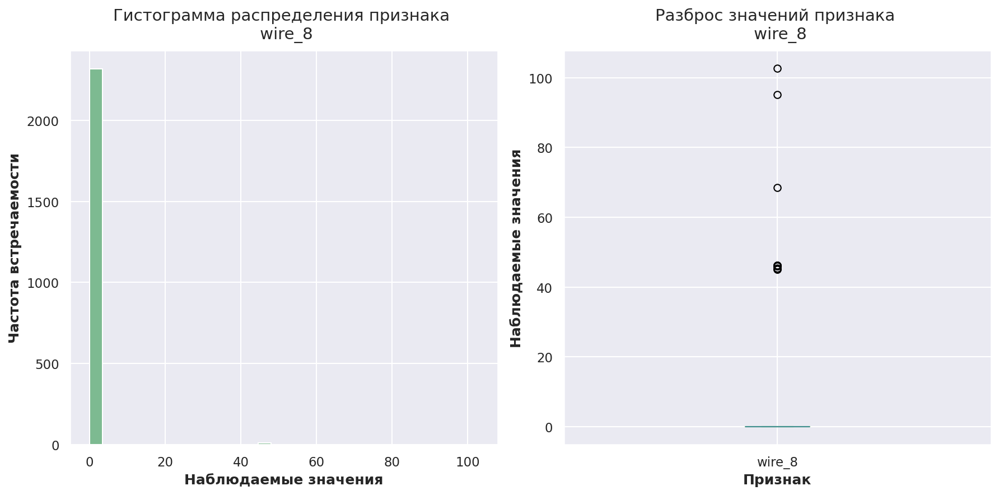

count   2,329.000
mean        0.317
std         3.457
min         0.000
25%         0.000
50%         0.000
75%         0.000
max        62.026
Name: wire_9, dtype: float64

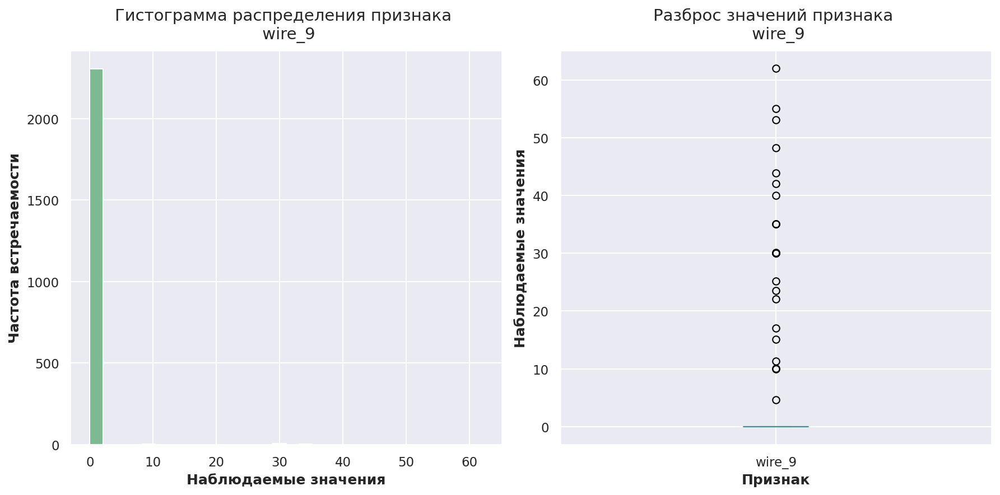

count   2,329.000
mean      125.209
std        63.683
min         1.919
25%        89.014
50%       116.101
75%       151.569
max       568.778
Name: общий_объём_wire, dtype: float64

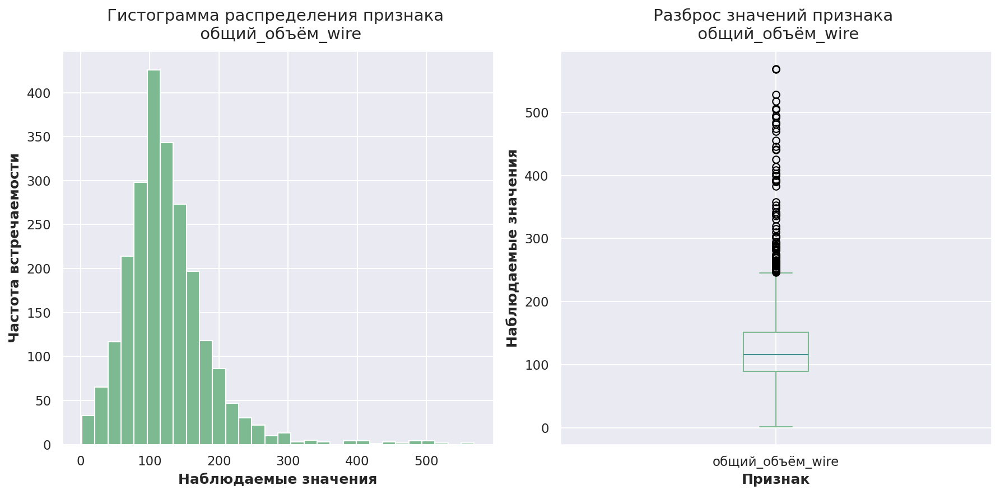

count   2,329.000
mean        1.397
std         0.564
min         1.000
25%         1.000
50%         1.000
75%         2.000
max         5.000
Name: количество_материалов_wire, dtype: float64

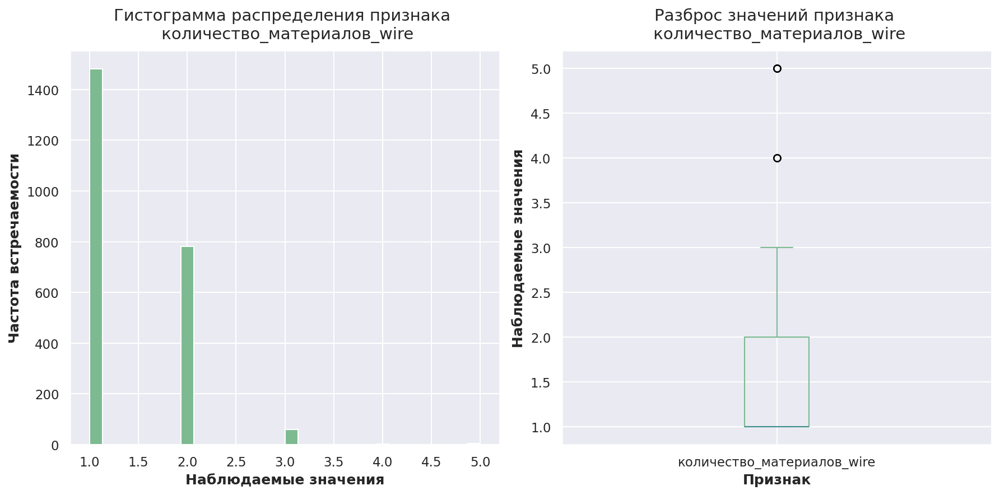

count   2,329.000
mean      209.708
std       390.096
min         0.000
25%         0.000
50%         0.000
75%       396.000
max     5,937.000
Name: общее_время_wire, dtype: float64

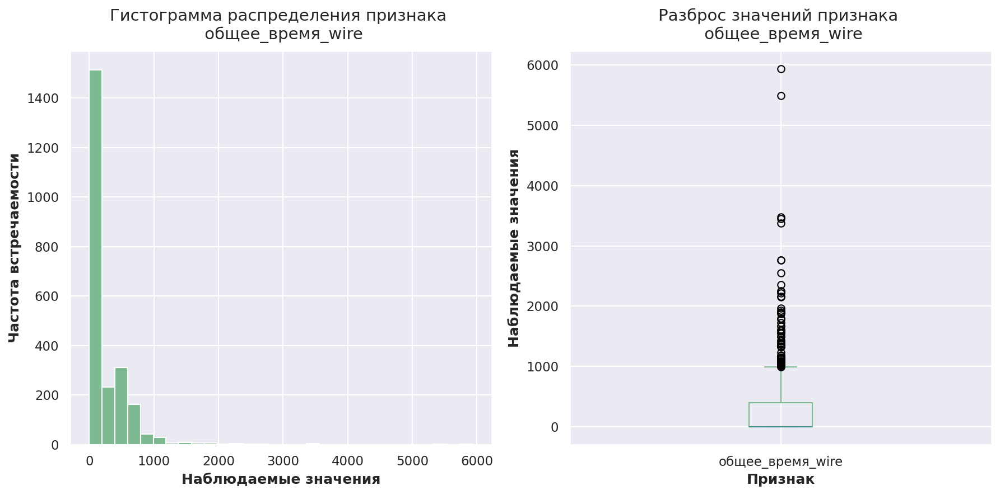

count   2,329.000
mean       11.376
std         6.392
min         0.008
25%         7.283
50%        10.101
75%        14.217
max        77.995
Name: газ_1, dtype: float64

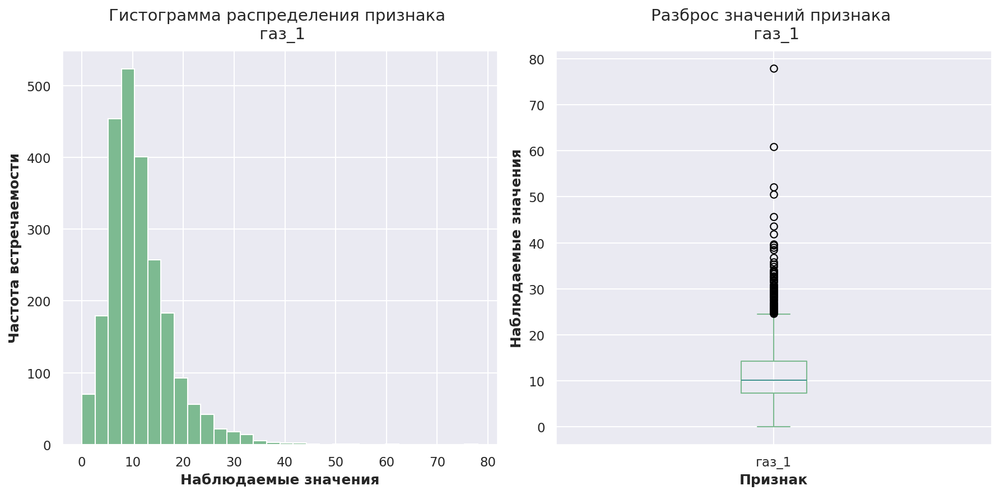

count   2,329.000
mean    1,587.386
std        23.620
min     1,519.000
25%     1,571.000
50%     1,587.000
75%     1,603.000
max     1,660.000
Name: начальная_температура, dtype: float64

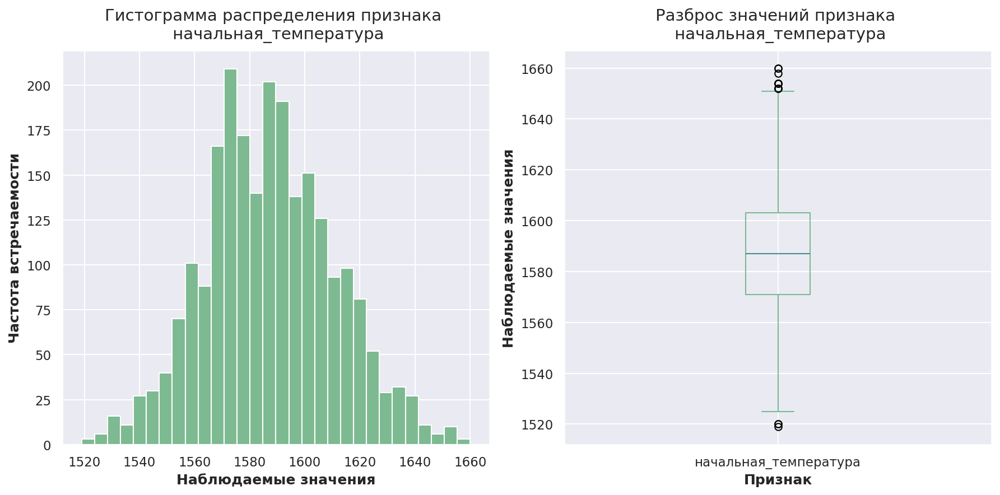

count   2,329.000
mean    1,593.365
std        11.201
min     1,541.000
25%     1,587.000
50%     1,593.000
75%     1,598.000
max     1,653.000
Name: конечная_температура, dtype: float64

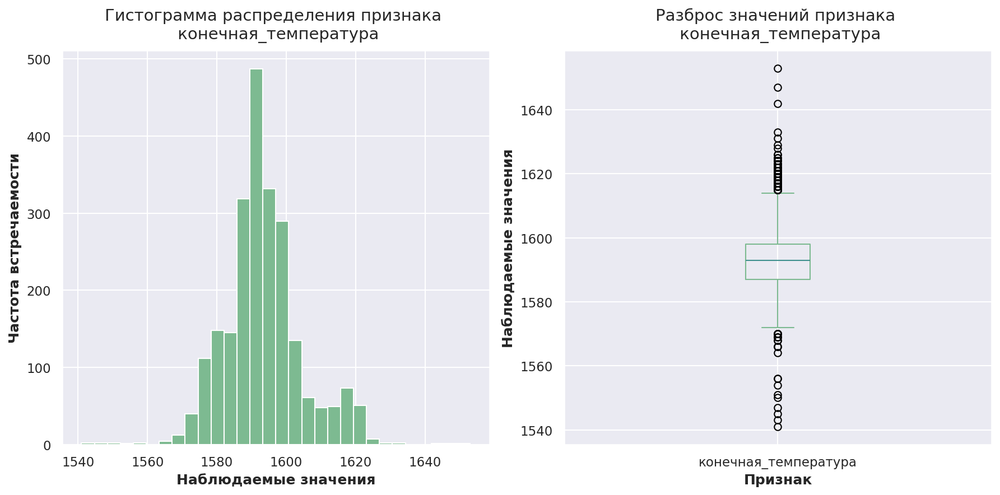

In [129]:
for feature in steel_temp.columns[1:]:
    visuals(steel_temp, feature)

<font size="3"> 
    
**Основные наблюдения и выводы:**

- чаще всего на одну партию приходится **от 4 до 6** этапов нагрева, однако встречаются партии с меньшим количеством этапов (1-3) или значительно большим (до 16);
- активная и реактивная мощности сильно положительно коррелируют: в среднем, реактивная мощность составляет примерно **0.73** от активной мощности;
- медианная длительность одного этапа нагрева составляет примерно **147 секунд**;
- объём газа, используемого для продувки, варьируется в значительных пределах. Среднее значение составляет около **11**, а медианное – **9.8**, что говорит о варьировании объёмов для разных партий;
- межквартильный размах объёма газа — **от 7 до 14**, но встречаются партии с гораздо большим объёмом продувки газа (до 78);
- использование добавок различается: из сыпучих материалов чаще всего добавляются материалы `bulk_12`, `bulk_14` и `bulk_15`, а из проволочных — материалы `wire_1` и `wire_2`;
- начальная температура нагрева в среднем немного ниже конечной и составляет около **1589** градусов. При этом начальная температура варьируется сильнее, чем конечная, что отражает разнообразие условий в начале процесса;
- обнаружены аномально низкие значения начальной температуры (около 1191 градуса), что по данным Заказчика считается аномалией. Записи с такими температурами исключены из выборки.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="3">
    
**Вывод раздела:**

В ходе анализа и подготовки данных были выполнены следующие шаги:

**Анализ и обработка данных:**

- проведён детальный анализ всех таблиц, включая проверку на наличие пропусков и аномальных значений;
- исследованы распределения признаков и построены наглядные графики, что помогло выявить закономерности и особенности данных.
    
**Создание новых признаков:**

- на основе исходных данных добавлены дополнительные признаки (агрегированные, производные и временные), которые помогают более точно описать характер производственного процесса.

**Объединение данных:**

- данные из всех таблиц объединены в одну итоговую таблицу с использованием метода `inner join`, что позволило включить в итоговый набор данных только те партии, для которых есть информация во всех исходных таблицах.
- признаки, содержащие даты, были исключены, чтобы избежать избыточной информации и повысить качество анализа.

**Итоговая таблица:**

- после всех этапов обработки данных получена итоговая таблица, включающая **2329** наблюдений и **41** признак (40 входных и 1 целевой);
- признаки с датами были удалены для сокращения избыточности информации.

Данные готовы для дальнейшего анализа и построения модели.

In [130]:
# удалим неактуальные выборки
del data_arc
del data_bulk
del data_bulk_time
del data_gas
del data_temp
del data_wire
del data_wire_time

<hr style="width: 100%; height: 2px; background-color: #99b9b6;">

## Корреляционный анализ

<font size="3"> Проведём корреляционный анализ признаков датафрейма с помощью матрицы корреляций `phik_matrix()`.

In [131]:
# функция построения матрицы корреляций phik
def phik_matrix(df):
    # список интервальных признаков
    interval_cols = df.select_dtypes(include='number').columns.tolist()
    
    # вычисление коэффициентов корреляции phi для датафрейма
    phik_overview = df.phik_matrix(interval_cols=interval_cols)

    # визуализация тепловой карты коэффициентов корреляции
    plot_correlation_matrix(
        phik_overview.values,
        x_labels=phik_overview.columns,
        y_labels=phik_overview.index,
        title=r"Матрица корреляции $\phi_K$",
        fontsize_factor=1.5,
        figsize=(30, 0.7*df.shape[1])
    )

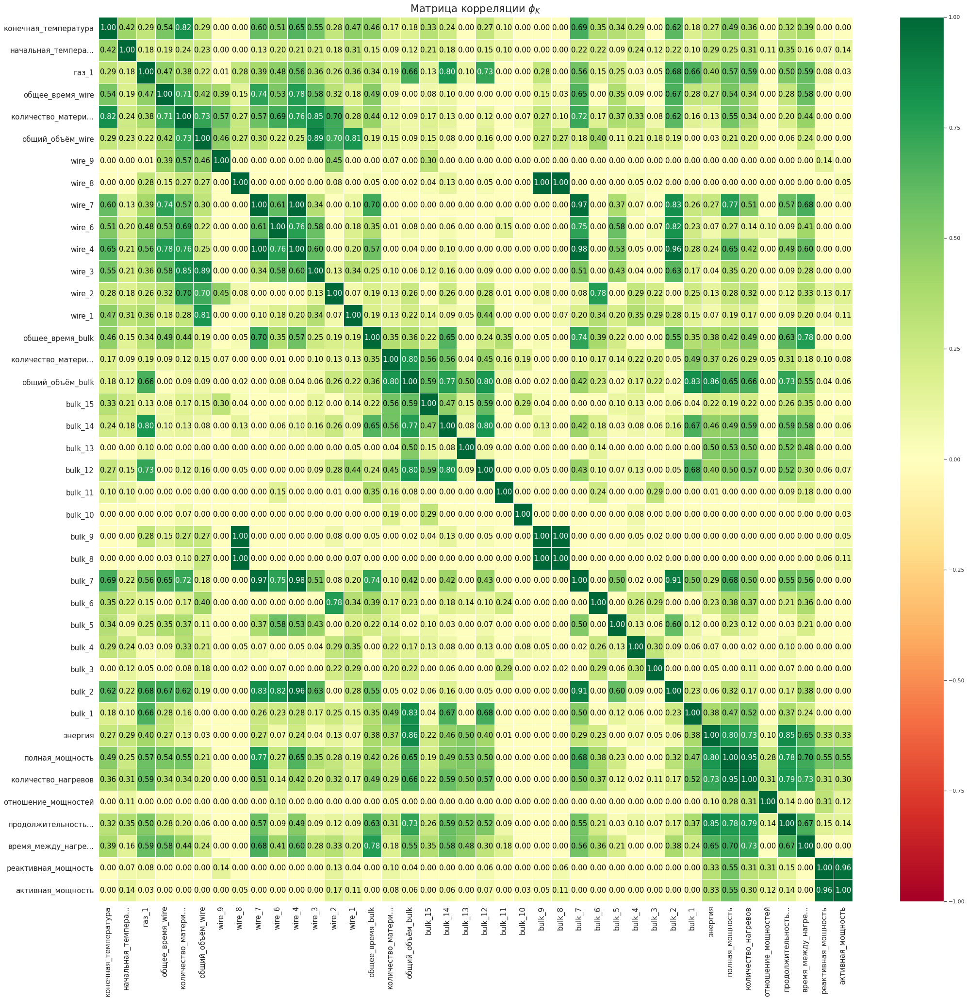

In [132]:
phik_matrix(steel_temp.iloc[:, 1:42])

<font size="3">

Матрица корреляций обнаруживает мультиколлинеарность входных признаков:
    
- `активная_мощность` и `реактивная_мощность` - высокая корреляция (**0.96**), что ожидаемо, так как эти величины часто напрямую связаны в электрических системах;
- `полная_мощность` и `количество_нагревов` - сильная положительная корреляция (**0.95**): количество нагревов имеет значительное влияние на потребляемую мощность;
- объёмы материалов - некоторые виды сыпучих и проволочных материалов (`bulk_8`, `bulk_9` и `wire_8`) имеют высокую корреляцию (**1.00**), что может говорить об особенностях технологического процесса: некоторые материалы добавляются только совместно, либо практически не добавляются (коррелируют из-за большого кол-ва пропусков).

Удалим из выборки следующие признаки: 
- `реактивная_мощность` - важна в контексте стабильности процесса, но для прогноза температуры плавления стали, скорее всего, активная мощность будет иметь более прямое влияние;
- `количество_нагревов` - признак `полная_мощность` может давать более полное представление о потреблении энергии в процессе плавления стали;
- признаки `bulk_1` … `bulk_15` и `wire_1` … `wire_9` - оставим признаки `общий_объём` и `количество_материалов`.
    
    
Данные изменения избавят от лишнего шума, уменьшив зависимости и сделав модель более стабильной и интерпретируемой.

In [133]:
# удалим отобранные признаки
steel_temp = steel_temp.drop(
    [
        "реактивная_мощность",
        "количество_нагревов",
        "bulk_1",
        "bulk_2",
        "bulk_3",
        "bulk_4",
        "bulk_5",
        "bulk_6",
        "bulk_7",
        "bulk_8",
        "bulk_9",
        "bulk_10",
        "bulk_11",
        "bulk_12",
        "bulk_13",
        "bulk_14",
        "bulk_15",
        "wire_1",
        "wire_2",
        "wire_3",
        "wire_4",
        "wire_5",
        "wire_6",
        "wire_7",
        "wire_8",
        "wire_9",
    ],
    axis=1,
)

In [134]:
# проверим результат
steel_temp.head()

,key,активная_мощность,время_между_нагревами,продолжительность_нагрева,отношение_мощностей,полная_мощность,энергия,общий_объём_bulk,количество_материалов_bulk,общее_время_bulk,общий_объём_wire,количество_материалов_wire,общее_время_wire,газ_1,начальная_температура,конечная_температура
0,1,0.607,"1,435.000","1,098.000",1.422,3.719,770.282,553.000,4,"1,085.000",60.060,1,0.000,29.750,"1,571.000","1,613.000"
1,2,0.535,934.000,811.000,1.479,2.588,481.760,582.000,4,"1,000.000",96.052,1,0.000,12.556,"1,581.000","1,602.000"
2,3,0.813,"1,460.000",655.000,1.396,5.019,722.838,544.000,4,983.000,91.160,1,0.000,28.555,"1,596.000","1,599.000"
3,4,0.677,815.000,741.000,1.307,3.400,683.456,595.000,4,878.000,89.064,1,0.000,18.841,"1,601.000","1,625.000"
4,5,0.563,"1,291.000",869.000,1.329,2.817,512.170,584.000,4,205.000,98.353,2,310.000,5.414,"1,576.000","1,602.000"


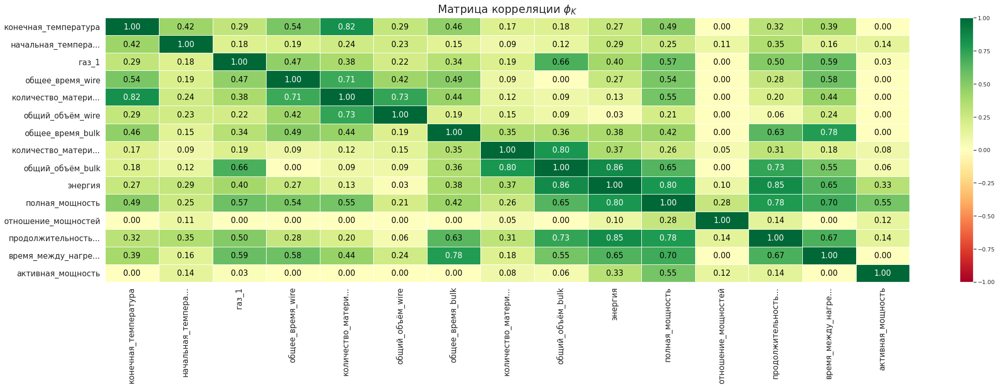

In [135]:
# построим матрицу корреляции
phik_matrix(steel_temp.iloc[:, 1:16])

<font size="3">
    
**Вывод:**

Мультиколлинеарность входных признаков устранена.
    
Остались признаки, которые не дублируют друг друга, а скорее отражают разные аспекты процесса плавления стали.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> 
    
Молодец, что проверяешь попарные корреляции признаков

<hr style="width: 100%; height: 2px; background-color: #99b9b6;">

## Подготовка данных

<font size="3"> Подготовим данные к обучению моделей. 

In [136]:
# обозначим входные и целевой признаки
X = steel_temp.drop(['key', 'конечная_температура'], axis=1)
y = steel_temp['конечная_температура']

# разделим данные на обучающую и тестовую выборки
X_train, X_test, y_train, y_test = train_test_split(
    X,
    y,
    test_size=0.25,
    random_state=SEED,
)

In [137]:
# проверим результат
print(
    f"Размеры тренировочных выборок: {X_train.shape}, {y_train.shape}\n"
    f"Размеры тестовых выборок: {X_test.shape}, {y_test.shape}"
)

Размеры тренировочных выборок: (1746, 14), (1746,)
Размеры тестовых выборок: (583, 14), (583,)


<font size="3">  

**Вывод**

Отобраны признаки для построения прогноза, выделены обучающая и тестовая выборки.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b>   

Выборки подготовлены корректно

<hr style="width: 100%; height: 2px; background-color: #99b9b6;">

<font size="3"> 
    
## Разработка моделей
    
Проведем сравнительный анализ моделей:

- `RandomForestRegressor`
- `CatBoostRegressor`
-  нейронная сеть (библиотека `Keras`)

Метрика качества: **MAE**.

Для подбора гиперпараметров используем библиотеку `Optuna`.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

### RandomForestRegressor

<font size="3"> Напишем модель случайного леса регрессии с подбором гиперпараметров.

In [138]:
# функция подбора гиперпараметров для модели RandomForestRegressor
def objective_forest(trial):
    # укажем гиперпараметры модели для перебора
    params_forest = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 500), 
        'max_depth': trial.suggest_int('max_depth', 5, 50),         
        'min_samples_split': trial.suggest_int("min_samples_split", 2, 20),
        'min_samples_leaf': trial.suggest_int("min_samples_leaf", 1, 15), 
        'max_features': trial.suggest_categorical('max_features', ['sqrt', 'log2', None]),  
        'bootstrap': trial.suggest_categorical('bootstrap', [True, False]),
        "criterion": 'absolute_error',
        "n_jobs": -1,  
        "random_state": SEED
    }
    
    # создадим pipeline
    model_forest = Pipeline([
        ('simpleImputer', SimpleImputer(missing_values=np.nan, strategy='constant', fill_value=-999)),
        ('scaler', RobustScaler()),
        ('model', RandomForestRegressor(**params_forest)) 
    ])

    # выполним кросс-валидацию
    scores_forest = (
        cross_val_score(
            model_forest,
            X_train,
            y_train,
            cv=5,
            scoring="neg_mean_absolute_error",
            n_jobs=-1
        )
        * -1
    )

    # получим среднюю метрику
    return scores_forest.mean()

In [139]:
# создадим объект study
study_forest = optuna.create_study(direction="minimize", sampler=optuna.samplers.TPESampler(seed=SEED))
# запустим процесс оптимизации
study_forest.optimize(objective_forest, n_trials=50)

[I 2024-11-23 09:55:36,848] A new study created in memory with name: no-name-11d1c030-1a31-4aea-becb-b3d3652aafa2
[I 2024-11-23 09:55:42,143] Trial 0 finished with value: 6.51748190582398 and parameters: {'n_estimators': 144, 'max_depth': 15, 'min_samples_split': 19, 'min_samples_leaf': 15, 'max_features': None, 'bootstrap': True}. Best is trial 0 with value: 6.51748190582398.
[I 2024-11-23 09:55:48,964] Trial 1 finished with value: 6.513067685935295 and parameters: {'n_estimators': 169, 'max_depth': 9, 'min_samples_split': 16, 'min_samples_leaf': 13, 'max_features': None, 'bootstrap': True}. Best is trial 1 with value: 6.513067685935295.
[I 2024-11-23 09:55:54,752] Trial 2 finished with value: 6.726558416383099 and parameters: {'n_estimators': 347, 'max_depth': 36, 'min_samples_split': 10, 'min_samples_leaf': 11, 'max_features': 'log2', 'bootstrap': False}. Best is trial 1 with value: 6.513067685935295.
[I 2024-11-23 09:56:13,945] Trial 3 finished with value: 7.871612139139771 and par

In [140]:
time_forest = study_forest.best_trial.duration.total_seconds() # время обучения
scores_forest = study_forest.best_value # метрика модели

# выведем метрику лучшей модели
print('MAE на кросс-валидации:')
scores_forest

MAE на кросс-валидации:


6.344428390746872

<font size="3">

**Вывод:**
    
Получены лучшие параметры модели `RandomForestRegressor()`.

Лучшая метрика **MAE** на кросс-валидации: **6.34**

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> 
        
Метрика выбрана верно - МАЕ)

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

### CatBoostRegressor

<font size="3"> Напишем модель бустинга с подбором гиперпараметров.

In [143]:
# функция подбора гиперпараметров для модели CatBoostRegressor
def objective_boost(trial):
    # укажем гиперпараметры для перебора
    params_boost = {
        'iterations': trial.suggest_int("iterations", 100, 1000),
        'learning_rate': trial.suggest_float("learning_rate", 0.001, 0.3, log=True),
        'depth': trial.suggest_int("depth", 4, 10),
        'l2_leaf_reg': trial.suggest_float("l2_leaf_reg", 1e-8, 100.0, log=True),
        'random_strength': trial.suggest_float("random_strength", 1e-8, 10.0, log=True),
        'loss_function': 'MAE', 
        "logging_level": 'Silent',
        "random_state": SEED
    }

    # выполним кросс-валидацию
    cv_results = cv(
        params=params_boost,
        pool=Pool(X_train.values, y_train.values),
        fold_count=5,
        shuffle=True,
        plot=False
    )

    
    # вернём минимальное значение метрики 
    return np.min(cv_results['test-MAE-mean'])

In [144]:
# создадим объект study
study_boost = optuna.create_study(direction="minimize", sampler=optuna.samplers.TPESampler(seed=SEED))
# запустим процесс оптимизации
study_boost.optimize(objective_boost, n_trials=50)

[I 2024-11-23 10:22:24,015] A new study created in memory with name: no-name-fc22edeb-aa38-4833-9691-a4de2169b132
[I 2024-11-23 10:22:27,437] Trial 0 finished with value: 782.1187867364022 and parameters: {'iterations': 198, 'learning_rate': 0.0035897431480288295, 'depth': 10, 'l2_leaf_reg': 23.11309213750165, 'random_strength': 4.1931196642877745e-07}. Best is trial 0 with value: 782.1187867364022.
[I 2024-11-23 10:22:45,326] Trial 1 finished with value: 12.863556408046026 and parameters: {'iterations': 546, 'learning_rate': 0.1804114757046034, 'depth': 7, 'l2_leaf_reg': 6.577133016579915e-05, 'random_strength': 3.651865861636751e-07}. Best is trial 1 with value: 12.863556408046026.
[I 2024-11-23 10:23:04,569] Trial 2 finished with value: 24.37229071582506 and parameters: {'iterations': 188, 'learning_rate': 0.08047040900483447, 'depth': 9, 'l2_leaf_reg': 5.528070006279137e-07, 'random_strength': 3.513828411244226e-08}. Best is trial 1 with value: 12.863556408046026.
[I 2024-11-23 10:

In [145]:
time_boost = study_boost.best_trial.duration.total_seconds() # время обучения
scores_boost = study_boost.best_value # метрика модели

# выведем метрику лучшей модели
print('MAE на кросс-валидации:')
scores_boost

MAE на кросс-валидации:


6.143963408824278

<font size="3">

**Вывод:**
    
Получены лучшие параметры модели `CatBoostRegressor()`.

Лучшая метрика **MAE** на кросс-валидации: **6.14**

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

### NeuralNetwork

<font size="3"> Напишем модель нейронной сети на основе Keras с подбором гиперпараметров.

In [146]:
# зададим архитектуру сети
def create_model_nn(n_hidden_neurons_1, dropout_rate):
    model = tf.keras.Sequential()
    
    model.add(tf.keras.layers.Dense(n_hidden_neurons_1, input_shape=(X_train.shape[1],)))
    model.add(tf.keras.layers.BatchNormalization())
    model.add(tf.keras.layers.LeakyReLU(alpha=0.1))
    model.add(tf.keras.layers.Dropout(dropout_rate)) 

    model.add(tf.keras.layers.Dense(1))
    
    return model

In [147]:
# создадим объект для кросс-валидации
kf = KFold(n_splits=5, shuffle=True, random_state=SEED)

# создадим порядок заполнения пропусков и масштабирования данных, которые будут применяться на каждом фолде
imputer = SimpleImputer(missing_values=np.nan, strategy='constant', fill_value=-999)
scaler = RobustScaler()

In [148]:
def objective_nn(trial):
    # укажем гиперпараметры для перебора
    n_hidden_neurons_1 = trial.suggest_int('n_hidden_neurons_1', 32, 512)
    dropout_rate = trial.suggest_float('dropout_rate', 0.0, 0.3)
    learning_rate = trial.suggest_float('learning_rate', 1e-4, 0.1, log=True)
    
    # словарь полученных метрик
    mae_scores = []
    
    # создадим модель
    base_model_nn = create_model_nn(n_hidden_neurons_1, dropout_rate)
    # сохраним начальные веса
    initial_weights = base_model_nn.get_weights()
    

    for train_idx, val_idx in kf.split(X_train):
        # получим выборки для кросс-валидации
        X_train_fold, X_val_fold = X_train.iloc[train_idx], X_train.iloc[val_idx]
        y_train_fold, y_val_fold = y_train.iloc[train_idx], y_train.iloc[val_idx]

        # обработаем данные по выбранному алгоритму
        X_train_fold = imputer.fit_transform(X_train_fold)
        X_train_fold = scaler.fit_transform(X_train_fold)
        X_val_fold = imputer.transform(X_val_fold)
        X_val_fold = scaler.transform(X_val_fold)

        # сбросим веса модели
        base_model_nn.set_weights([np.copy(w) for w in initial_weights])
        
        optimizer = Adam(learning_rate=learning_rate)
        base_model_nn.compile(
            optimizer=optimizer, 
            loss=keras.losses.MeanAbsoluteError(),
            metrics=[keras.metrics.MeanAbsoluteError()]
        )

        # обучим модель
        history = base_model_nn.fit(
            X_train_fold, y_train_fold,
            validation_data=(X_val_fold, y_val_fold),
            batch_size=128,
            epochs=5000,
            verbose=1,
            callbacks=[
                tf.keras.callbacks.EarlyStopping(monitor='val_mean_absolute_error', patience=30, restore_best_weights=True, min_delta=1e-6),
                tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=20, verbose=1),
                optuna.integration.TFKerasPruningCallback(trial, monitor='val_mean_absolute_error')
            ]
        )

        # оценим модель
        val_mae = base_model_nn.evaluate(X_val_fold, y_val_fold, verbose=0)[1]
        mae_scores.append(val_mae)

        # освободим память
        tf.keras.backend.clear_session()
        gc.collect()

    # получим среднюю метрику
    return np.mean(mae_scores)        

In [149]:
# создадим объект study
study_nn = optuna.create_study(direction="minimize", sampler=optuna.samplers.TPESampler(SEED), pruner=optuna.pruners.SuccessiveHalvingPruner(min_resource=100, reduction_factor=3))

# запустим процесс оптимизации
study_nn.optimize(objective_nn, n_trials=50)

[I 2024-11-23 10:34:04,463] A new study created in memory with name: no-name-ef9501bc-6097-4e4c-96d9-c2a029b03913
2024-11-23 10:34:04.473936: I tensorflow/core/platform/cpu_feature_guard.cc:151] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


Epoch 1/5000
11/11 [==============================] - 1s 24ms/step - loss: 1547.3151 - mean_absolute_error: 1547.3151 - val_loss: 1473.9243 - val_mean_absolute_error: 1473.9243 - lr: 0.0509
Epoch 2/5000
11/11 [==============================] - 0s 10ms/step - loss: 1318.0710 - mean_absolute_error: 1318.0710 - val_loss: 1133.7438 - val_mean_absolute_error: 1133.7438 - lr: 0.0509
Epoch 3/5000
11/11 [==============================] - 0s 10ms/step - loss: 801.9045 - mean_absolute_error: 801.9045 - val_loss: 513.2147 - val_mean_absolute_error: 513.2147 - lr: 0.0509
Epoch 4/5000
11/11 [==============================] - 0s 10ms/step - loss: 259.8291 - mean_absolute_error: 259.8291 - val_loss: 858.9952 - val_mean_absolute_error: 858.9952 - lr: 0.0509
Epoch 5/5000
11/11 [==============================] - 0s 10ms/step - loss: 189.5142 - mean_absolute_error: 189.5142 - val_loss: 320.3246 - val_mean_absolute_error: 320.3246 - lr: 0.0509
Epoch 6/5000
11/11 [==============================] - 0s 10ms/

[I 2024-11-23 10:35:19,904] Trial 0 finished with value: 6.665776634216309 and parameters: {'n_hidden_neurons_1': 305, 'dropout_rate': 0.27260224283909457, 'learning_rate': 0.05087649102777642}. Best is trial 0 with value: 6.665776634216309.


Epoch 1/5000
11/11 [==============================] - 1s 21ms/step - loss: 1593.2083 - mean_absolute_error: 1593.2083 - val_loss: 1592.0985 - val_mean_absolute_error: 1592.0985 - lr: 2.7020e-04
Epoch 2/5000
11/11 [==============================] - 0s 10ms/step - loss: 1592.6169 - mean_absolute_error: 1592.6169 - val_loss: 1591.9031 - val_mean_absolute_error: 1591.9031 - lr: 2.7020e-04
Epoch 3/5000
11/11 [==============================] - 0s 10ms/step - loss: 1592.0406 - mean_absolute_error: 1592.0406 - val_loss: 1591.6903 - val_mean_absolute_error: 1591.6903 - lr: 2.7020e-04
Epoch 4/5000
11/11 [==============================] - 0s 10ms/step - loss: 1591.4646 - mean_absolute_error: 1591.4646 - val_loss: 1591.4618 - val_mean_absolute_error: 1591.4618 - lr: 2.7020e-04
Epoch 5/5000
11/11 [==============================] - 0s 10ms/step - loss: 1590.8888 - mean_absolute_error: 1590.8888 - val_loss: 1591.2141 - val_mean_absolute_error: 1591.2141 - lr: 2.7020e-04
Epoch 6/5000
11/11 [==========

[I 2024-11-23 10:35:31,679] Trial 1 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 22ms/step - loss: 1560.3389 - mean_absolute_error: 1560.3389 - val_loss: 1521.8268 - val_mean_absolute_error: 1521.8268 - lr: 0.0346
Epoch 2/5000
11/11 [==============================] - 0s 10ms/step - loss: 1416.2661 - mean_absolute_error: 1416.2661 - val_loss: 1322.2496 - val_mean_absolute_error: 1322.2496 - lr: 0.0346
Epoch 3/5000
11/11 [==============================] - 0s 10ms/step - loss: 1103.0847 - mean_absolute_error: 1103.0847 - val_loss: 975.1123 - val_mean_absolute_error: 975.1123 - lr: 0.0346
Epoch 4/5000
11/11 [==============================] - 0s 9ms/step - loss: 583.3878 - mean_absolute_error: 583.3878 - val_loss: 317.0803 - val_mean_absolute_error: 317.0803 - lr: 0.0346
Epoch 5/5000
11/11 [==============================] - 0s 14ms/step - loss: 221.0855 - mean_absolute_error: 221.0855 - val_loss: 665.0681 - val_mean_absolute_error: 665.0681 - lr: 0.0346
Epoch 6/5000
11/11 [==============================] - 0s 6ms/

[I 2024-11-23 10:35:42,667] Trial 2 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 18ms/step - loss: 1593.3621 - mean_absolute_error: 1593.3621 - val_loss: 1592.1587 - val_mean_absolute_error: 1592.1587 - lr: 3.7411e-04
Epoch 2/5000
11/11 [==============================] - 0s 5ms/step - loss: 1592.8191 - mean_absolute_error: 1592.8191 - val_loss: 1591.9420 - val_mean_absolute_error: 1591.9420 - lr: 3.7411e-04
Epoch 3/5000
11/11 [==============================] - 0s 10ms/step - loss: 1592.2462 - mean_absolute_error: 1592.2462 - val_loss: 1591.7092 - val_mean_absolute_error: 1591.7092 - lr: 3.7411e-04
Epoch 4/5000
11/11 [==============================] - 0s 5ms/step - loss: 1591.6843 - mean_absolute_error: 1591.6843 - val_loss: 1591.4553 - val_mean_absolute_error: 1591.4553 - lr: 3.7411e-04
Epoch 5/5000
11/11 [==============================] - 0s 10ms/step - loss: 1591.0963 - mean_absolute_error: 1591.0963 - val_loss: 1591.1840 - val_mean_absolute_error: 1591.1840 - lr: 3.7411e-04
Epoch 6/5000
11/11 [============

[I 2024-11-23 10:35:54,973] Trial 3 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 21ms/step - loss: 1591.9935 - mean_absolute_error: 1591.9935 - val_loss: 1591.1608 - val_mean_absolute_error: 1591.1608 - lr: 0.0021
Epoch 2/5000
11/11 [==============================] - 0s 8ms/step - loss: 1588.4482 - mean_absolute_error: 1588.4482 - val_loss: 1589.8237 - val_mean_absolute_error: 1589.8237 - lr: 0.0021
Epoch 3/5000
11/11 [==============================] - 0s 10ms/step - loss: 1584.8083 - mean_absolute_error: 1584.8083 - val_loss: 1588.2007 - val_mean_absolute_error: 1588.2007 - lr: 0.0021
Epoch 4/5000
11/11 [==============================] - 0s 10ms/step - loss: 1580.9340 - mean_absolute_error: 1580.9340 - val_loss: 1586.1582 - val_mean_absolute_error: 1586.1582 - lr: 0.0021
Epoch 5/5000
11/11 [==============================] - 0s 10ms/step - loss: 1576.5659 - mean_absolute_error: 1576.5659 - val_loss: 1583.6332 - val_mean_absolute_error: 1583.6332 - lr: 0.0021
Epoch 6/5000
11/11 [==============================]

[I 2024-11-23 10:36:06,182] Trial 4 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 23ms/step - loss: 1545.5271 - mean_absolute_error: 1545.5271 - val_loss: 1481.6447 - val_mean_absolute_error: 1481.6447 - lr: 0.0426
Epoch 2/5000
11/11 [==============================] - 0s 8ms/step - loss: 1318.5909 - mean_absolute_error: 1318.5909 - val_loss: 1156.6251 - val_mean_absolute_error: 1156.6251 - lr: 0.0426
Epoch 3/5000
11/11 [==============================] - 0s 10ms/step - loss: 825.4546 - mean_absolute_error: 825.4546 - val_loss: 544.9766 - val_mean_absolute_error: 544.9766 - lr: 0.0426
Epoch 4/5000
11/11 [==============================] - 0s 11ms/step - loss: 266.2826 - mean_absolute_error: 266.2826 - val_loss: 697.0754 - val_mean_absolute_error: 697.0754 - lr: 0.0426
Epoch 5/5000
11/11 [==============================] - 0s 11ms/step - loss: 189.0032 - mean_absolute_error: 189.0032 - val_loss: 342.6875 - val_mean_absolute_error: 342.6875 - lr: 0.0426
Epoch 6/5000
11/11 [==============================] - 0s 11ms/s

[I 2024-11-23 10:37:30,441] Trial 5 finished with value: 6.580753517150879 and parameters: {'n_hidden_neurons_1': 412, 'dropout_rate': 0.2918162363052869, 'learning_rate': 0.04261127432096999}. Best is trial 5 with value: 6.580753517150879.


Epoch 1/5000
11/11 [==============================] - 1s 20ms/step - loss: 1589.6860 - mean_absolute_error: 1589.6860 - val_loss: 1589.2262 - val_mean_absolute_error: 1589.2262 - lr: 0.0053
Epoch 2/5000
11/11 [==============================] - 0s 8ms/step - loss: 1581.4398 - mean_absolute_error: 1581.4398 - val_loss: 1584.9939 - val_mean_absolute_error: 1584.9939 - lr: 0.0053
Epoch 3/5000
11/11 [==============================] - 0s 9ms/step - loss: 1571.6956 - mean_absolute_error: 1571.6956 - val_loss: 1578.6442 - val_mean_absolute_error: 1578.6442 - lr: 0.0053
Epoch 4/5000
11/11 [==============================] - 0s 10ms/step - loss: 1559.0620 - mean_absolute_error: 1559.0620 - val_loss: 1569.5629 - val_mean_absolute_error: 1569.5629 - lr: 0.0053
Epoch 5/5000
11/11 [==============================] - 0s 10ms/step - loss: 1542.6184 - mean_absolute_error: 1542.6184 - val_loss: 1556.5825 - val_mean_absolute_error: 1556.5825 - lr: 0.0053
Epoch 6/5000
11/11 [==============================] 

[I 2024-11-23 10:37:41,365] Trial 6 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 16ms/step - loss: 1587.8560 - mean_absolute_error: 1587.8560 - val_loss: 1584.3784 - val_mean_absolute_error: 1584.3784 - lr: 0.0180
Epoch 2/5000
11/11 [==============================] - 0s 7ms/step - loss: 1572.3013 - mean_absolute_error: 1572.3013 - val_loss: 1568.0786 - val_mean_absolute_error: 1568.0786 - lr: 0.0180
Epoch 3/5000
11/11 [==============================] - 0s 9ms/step - loss: 1545.2856 - mean_absolute_error: 1545.2856 - val_loss: 1538.6407 - val_mean_absolute_error: 1538.6407 - lr: 0.0180
Epoch 4/5000
11/11 [==============================] - 0s 8ms/step - loss: 1500.6666 - mean_absolute_error: 1500.6666 - val_loss: 1491.3848 - val_mean_absolute_error: 1491.3848 - lr: 0.0180
Epoch 5/5000
11/11 [==============================] - 0s 4ms/step - loss: 1433.7222 - mean_absolute_error: 1433.7222 - val_loss: 1421.5309 - val_mean_absolute_error: 1421.5309 - lr: 0.0180
Epoch 6/5000
11/11 [==============================] - 

[I 2024-11-23 10:37:49,678] Trial 7 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 20ms/step - loss: 1564.4965 - mean_absolute_error: 1564.4965 - val_loss: 1535.6500 - val_mean_absolute_error: 1535.6500 - lr: 0.0341
Epoch 2/5000
11/11 [==============================] - 0s 9ms/step - loss: 1443.1909 - mean_absolute_error: 1443.1909 - val_loss: 1376.8434 - val_mean_absolute_error: 1376.8434 - lr: 0.0341
Epoch 3/5000
11/11 [==============================] - 0s 9ms/step - loss: 1184.0151 - mean_absolute_error: 1184.0151 - val_loss: 1083.0533 - val_mean_absolute_error: 1083.0533 - lr: 0.0341
Epoch 4/5000
11/11 [==============================] - 0s 10ms/step - loss: 741.6154 - mean_absolute_error: 741.6154 - val_loss: 507.8024 - val_mean_absolute_error: 507.8024 - lr: 0.0341
Epoch 5/5000
11/11 [==============================] - 0s 10ms/step - loss: 256.0834 - mean_absolute_error: 256.0834 - val_loss: 531.3251 - val_mean_absolute_error: 531.3251 - lr: 0.0341
Epoch 6/5000
11/11 [==============================] - 0s 10m

[I 2024-11-23 10:39:19,175] Trial 8 finished with value: 6.409339332580567 and parameters: {'n_hidden_neurons_1': 324, 'dropout_rate': 0.00045425546073537545, 'learning_rate': 0.034143750534006465}. Best is trial 8 with value: 6.409339332580567.


Epoch 1/5000
11/11 [==============================] - 1s 18ms/step - loss: 1568.1354 - mean_absolute_error: 1568.1354 - val_loss: 1530.2789 - val_mean_absolute_error: 1530.2789 - lr: 0.0407
Epoch 2/5000
11/11 [==============================] - 0s 8ms/step - loss: 1447.7273 - mean_absolute_error: 1447.7273 - val_loss: 1348.1746 - val_mean_absolute_error: 1348.1747 - lr: 0.0407
Epoch 3/5000
11/11 [==============================] - 0s 10ms/step - loss: 1173.4575 - mean_absolute_error: 1173.4575 - val_loss: 1020.3062 - val_mean_absolute_error: 1020.3062 - lr: 0.0407
Epoch 4/5000
11/11 [==============================] - 0s 10ms/step - loss: 697.6584 - mean_absolute_error: 697.6584 - val_loss: 415.1207 - val_mean_absolute_error: 415.1207 - lr: 0.0407
Epoch 5/5000
11/11 [==============================] - 0s 10ms/step - loss: 230.9466 - mean_absolute_error: 230.9466 - val_loss: 737.2394 - val_mean_absolute_error: 737.2394 - lr: 0.0407
Epoch 6/5000
11/11 [==============================] - 0s 10

[I 2024-11-23 10:40:16,232] Trial 9 finished with value: 6.746081256866455 and parameters: {'n_hidden_neurons_1': 258, 'dropout_rate': 0.210503718560679, 'learning_rate': 0.040693314279327306}. Best is trial 8 with value: 6.409339332580567.


Epoch 1/5000
11/11 [==============================] - 1s 18ms/step - loss: 1493.0745 - mean_absolute_error: 1493.0745 - val_loss: 1258.1930 - val_mean_absolute_error: 1258.1930 - lr: 0.0987
Epoch 2/5000
11/11 [==============================] - 0s 9ms/step - loss: 871.3840 - mean_absolute_error: 871.3840 - val_loss: 457.4851 - val_mean_absolute_error: 457.4851 - lr: 0.0987
Epoch 3/5000
11/11 [==============================] - 0s 9ms/step - loss: 276.8449 - mean_absolute_error: 276.8449 - val_loss: 1218.7732 - val_mean_absolute_error: 1218.7732 - lr: 0.0987
Epoch 4/5000
11/11 [==============================] - 0s 4ms/step - loss: 156.9675 - mean_absolute_error: 156.9675 - val_loss: 463.5758 - val_mean_absolute_error: 463.5758 - lr: 0.0987
Epoch 5/5000
11/11 [==============================] - 0s 4ms/step - loss: 94.7812 - mean_absolute_error: 94.7812 - val_loss: 345.5504 - val_mean_absolute_error: 345.5504 - lr: 0.0987
Epoch 6/5000
11/11 [==============================] - 0s 10ms/step - l

[I 2024-11-23 10:41:07,617] Trial 10 finished with value: 6.540153694152832 and parameters: {'n_hidden_neurons_1': 237, 'dropout_rate': 0.022426236287948296, 'learning_rate': 0.09873461670140353}. Best is trial 8 with value: 6.409339332580567.


Epoch 1/5000
11/11 [==============================] - 1s 18ms/step - loss: 1520.3459 - mean_absolute_error: 1520.3459 - val_loss: 1320.1740 - val_mean_absolute_error: 1320.1741 - lr: 0.0914
Epoch 2/5000
11/11 [==============================] - 0s 4ms/step - loss: 1046.5764 - mean_absolute_error: 1046.5764 - val_loss: 639.7558 - val_mean_absolute_error: 639.7558 - lr: 0.0914
Epoch 3/5000
11/11 [==============================] - 0s 4ms/step - loss: 311.3359 - mean_absolute_error: 311.3359 - val_loss: 1311.1379 - val_mean_absolute_error: 1311.1379 - lr: 0.0914
Epoch 4/5000
11/11 [==============================] - 0s 9ms/step - loss: 194.0691 - mean_absolute_error: 194.0691 - val_loss: 538.9560 - val_mean_absolute_error: 538.9560 - lr: 0.0914
Epoch 5/5000
11/11 [==============================] - 0s 9ms/step - loss: 113.0346 - mean_absolute_error: 113.0346 - val_loss: 491.6480 - val_mean_absolute_error: 491.6480 - lr: 0.0914
Epoch 6/5000
11/11 [==============================] - 0s 9ms/step 

[I 2024-11-23 10:42:00,486] Trial 11 finished with value: 6.500407314300537 and parameters: {'n_hidden_neurons_1': 218, 'dropout_rate': 0.0031903587560118303, 'learning_rate': 0.0914393852621028}. Best is trial 8 with value: 6.409339332580567.


Epoch 1/5000
11/11 [==============================] - 1s 18ms/step - loss: 1536.5680 - mean_absolute_error: 1536.5680 - val_loss: 1386.9371 - val_mean_absolute_error: 1386.9371 - lr: 0.0800
Epoch 2/5000
11/11 [==============================] - 0s 8ms/step - loss: 1191.3613 - mean_absolute_error: 1191.3613 - val_loss: 844.9651 - val_mean_absolute_error: 844.9651 - lr: 0.0800
Epoch 3/5000
11/11 [==============================] - 0s 9ms/step - loss: 458.0520 - mean_absolute_error: 458.0520 - val_loss: 1025.3218 - val_mean_absolute_error: 1025.3218 - lr: 0.0800
Epoch 4/5000
11/11 [==============================] - 0s 8ms/step - loss: 236.4951 - mean_absolute_error: 236.4951 - val_loss: 808.5911 - val_mean_absolute_error: 808.5911 - lr: 0.0800
Epoch 5/5000
11/11 [==============================] - 0s 9ms/step - loss: 129.0633 - mean_absolute_error: 129.0633 - val_loss: 433.3120 - val_mean_absolute_error: 433.3120 - lr: 0.0800
Epoch 6/5000
11/11 [==============================] - 0s 4ms/step 

[I 2024-11-23 10:43:17,422] Trial 12 finished with value: 6.334017372131347 and parameters: {'n_hidden_neurons_1': 201, 'dropout_rate': 0.0006108691867059366, 'learning_rate': 0.07995959991741804}. Best is trial 12 with value: 6.334017372131347.


Epoch 1/5000
11/11 [==============================] - 1s 19ms/step - loss: 1545.0011 - mean_absolute_error: 1545.0011 - val_loss: 1438.4445 - val_mean_absolute_error: 1438.4445 - lr: 0.0781
Epoch 2/5000
11/11 [==============================] - 0s 9ms/step - loss: 1256.3359 - mean_absolute_error: 1256.3359 - val_loss: 987.4249 - val_mean_absolute_error: 987.4249 - lr: 0.0781
Epoch 3/5000
11/11 [==============================] - 0s 9ms/step - loss: 586.1929 - mean_absolute_error: 586.1929 - val_loss: 615.6547 - val_mean_absolute_error: 615.6547 - lr: 0.0781
Epoch 4/5000
11/11 [==============================] - 0s 9ms/step - loss: 235.0072 - mean_absolute_error: 235.0072 - val_loss: 867.4472 - val_mean_absolute_error: 867.4472 - lr: 0.0781
Epoch 5/5000
11/11 [==============================] - 0s 10ms/step - loss: 143.5652 - mean_absolute_error: 143.5652 - val_loss: 413.0334 - val_mean_absolute_error: 413.0334 - lr: 0.0781
Epoch 6/5000
11/11 [==============================] - 0s 9ms/step -

[I 2024-11-23 10:43:27,134] Trial 13 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 17ms/step - loss: 1590.2930 - mean_absolute_error: 1590.2930 - val_loss: 1586.8839 - val_mean_absolute_error: 1586.8839 - lr: 0.0202
Epoch 2/5000
11/11 [==============================] - 0s 7ms/step - loss: 1580.9951 - mean_absolute_error: 1580.9951 - val_loss: 1577.2955 - val_mean_absolute_error: 1577.2955 - lr: 0.0202
Epoch 3/5000
11/11 [==============================] - 0s 4ms/step - loss: 1564.9685 - mean_absolute_error: 1564.9685 - val_loss: 1560.4070 - val_mean_absolute_error: 1560.4070 - lr: 0.0202
Epoch 4/5000
11/11 [==============================] - 0s 8ms/step - loss: 1538.0924 - mean_absolute_error: 1538.0924 - val_loss: 1531.8029 - val_mean_absolute_error: 1531.8029 - lr: 0.0202
Epoch 5/5000
11/11 [==============================] - 0s 8ms/step - loss: 1496.8608 - mean_absolute_error: 1496.8608 - val_loss: 1489.0865 - val_mean_absolute_error: 1489.0865 - lr: 0.0202
Epoch 6/5000
11/11 [==============================] - 

[I 2024-11-23 10:43:34,635] Trial 14 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 19ms/step - loss: 1558.9532 - mean_absolute_error: 1558.9532 - val_loss: 1496.7266 - val_mean_absolute_error: 1496.7266 - lr: 0.0622
Epoch 2/5000
11/11 [==============================] - 0s 8ms/step - loss: 1366.7585 - mean_absolute_error: 1366.7585 - val_loss: 1198.4286 - val_mean_absolute_error: 1198.4285 - lr: 0.0622
Epoch 3/5000
11/11 [==============================] - 0s 10ms/step - loss: 904.2766 - mean_absolute_error: 904.2766 - val_loss: 623.5601 - val_mean_absolute_error: 623.5601 - lr: 0.0622
Epoch 4/5000
11/11 [==============================] - 0s 9ms/step - loss: 295.5052 - mean_absolute_error: 295.5052 - val_loss: 958.8086 - val_mean_absolute_error: 958.8086 - lr: 0.0622
Epoch 5/5000
11/11 [==============================] - 0s 9ms/step - loss: 203.5116 - mean_absolute_error: 203.5116 - val_loss: 561.1779 - val_mean_absolute_error: 561.1779 - lr: 0.0622
Epoch 6/5000
11/11 [==============================] - 0s 9ms/step

[I 2024-11-23 10:44:36,709] Trial 15 finished with value: 6.41058988571167 and parameters: {'n_hidden_neurons_1': 188, 'dropout_rate': 0.0006168110379805979, 'learning_rate': 0.062177554294974825}. Best is trial 12 with value: 6.334017372131347.


Epoch 1/5000
11/11 [==============================] - 1s 20ms/step - loss: 1575.3379 - mean_absolute_error: 1575.3379 - val_loss: 1562.0807 - val_mean_absolute_error: 1562.0807 - lr: 0.0268
Epoch 2/5000
11/11 [==============================] - 0s 9ms/step - loss: 1506.9196 - mean_absolute_error: 1506.9196 - val_loss: 1479.4493 - val_mean_absolute_error: 1479.4493 - lr: 0.0268
Epoch 3/5000
11/11 [==============================] - 0s 10ms/step - loss: 1366.2455 - mean_absolute_error: 1366.2455 - val_loss: 1321.9757 - val_mean_absolute_error: 1321.9757 - lr: 0.0268
Epoch 4/5000
11/11 [==============================] - 0s 10ms/step - loss: 1124.8718 - mean_absolute_error: 1124.8718 - val_loss: 1071.9008 - val_mean_absolute_error: 1071.9008 - lr: 0.0268
Epoch 5/5000
11/11 [==============================] - 0s 10ms/step - loss: 766.1376 - mean_absolute_error: 766.1376 - val_loss: 599.0701 - val_mean_absolute_error: 599.0701 - lr: 0.0268
Epoch 6/5000
11/11 [==============================] - 0

[I 2024-11-23 10:44:46,855] Trial 16 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 20ms/step - loss: 1585.6057 - mean_absolute_error: 1585.6057 - val_loss: 1583.6123 - val_mean_absolute_error: 1583.6123 - lr: 0.0116
Epoch 2/5000
11/11 [==============================] - 0s 10ms/step - loss: 1563.1305 - mean_absolute_error: 1563.1305 - val_loss: 1565.5690 - val_mean_absolute_error: 1565.5690 - lr: 0.0116
Epoch 3/5000
11/11 [==============================] - 0s 10ms/step - loss: 1527.4575 - mean_absolute_error: 1527.4575 - val_loss: 1531.9783 - val_mean_absolute_error: 1531.9783 - lr: 0.0116
Epoch 4/5000
11/11 [==============================] - 0s 10ms/step - loss: 1471.8289 - mean_absolute_error: 1471.8289 - val_loss: 1479.8143 - val_mean_absolute_error: 1479.8143 - lr: 0.0116
Epoch 5/5000
11/11 [==============================] - 0s 10ms/step - loss: 1390.9628 - mean_absolute_error: 1390.9628 - val_loss: 1406.7454 - val_mean_absolute_error: 1406.7454 - lr: 0.0116
Epoch 6/5000
11/11 [==============================

[I 2024-11-23 10:44:57,671] Trial 17 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 19ms/step - loss: 1592.6602 - mean_absolute_error: 1592.6602 - val_loss: 1591.7543 - val_mean_absolute_error: 1591.7543 - lr: 0.0011
Epoch 2/5000
11/11 [==============================] - 0s 8ms/step - loss: 1591.8536 - mean_absolute_error: 1591.8536 - val_loss: 1591.2971 - val_mean_absolute_error: 1591.2971 - lr: 0.0011
Epoch 3/5000
11/11 [==============================] - 0s 9ms/step - loss: 1591.0399 - mean_absolute_error: 1591.0399 - val_loss: 1590.8051 - val_mean_absolute_error: 1590.8051 - lr: 0.0011
Epoch 4/5000
11/11 [==============================] - 0s 9ms/step - loss: 1590.2092 - mean_absolute_error: 1590.2092 - val_loss: 1590.2704 - val_mean_absolute_error: 1590.2704 - lr: 0.0011
Epoch 5/5000
11/11 [==============================] - 0s 4ms/step - loss: 1589.3612 - mean_absolute_error: 1589.3612 - val_loss: 1589.6925 - val_mean_absolute_error: 1589.6925 - lr: 0.0011
Epoch 6/5000
11/11 [==============================] - 

[I 2024-11-23 10:45:06,828] Trial 18 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 19ms/step - loss: 1588.7480 - mean_absolute_error: 1588.7480 - val_loss: 1587.7335 - val_mean_absolute_error: 1587.7335 - lr: 0.0076
Epoch 2/5000
11/11 [==============================] - 0s 6ms/step - loss: 1577.8291 - mean_absolute_error: 1577.8291 - val_loss: 1580.7473 - val_mean_absolute_error: 1580.7473 - lr: 0.0076
Epoch 3/5000
11/11 [==============================] - 0s 10ms/step - loss: 1563.4456 - mean_absolute_error: 1563.4456 - val_loss: 1569.3916 - val_mean_absolute_error: 1569.3916 - lr: 0.0076
Epoch 4/5000
11/11 [==============================] - 0s 5ms/step - loss: 1543.1066 - mean_absolute_error: 1543.1066 - val_loss: 1552.1138 - val_mean_absolute_error: 1552.1138 - lr: 0.0076
Epoch 5/5000
11/11 [==============================] - 0s 10ms/step - loss: 1515.1821 - mean_absolute_error: 1515.1821 - val_loss: 1527.6973 - val_mean_absolute_error: 1527.6973 - lr: 0.0076
Epoch 6/5000
11/11 [==============================] 

[I 2024-11-23 10:45:17,371] Trial 19 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 20ms/step - loss: 1593.1823 - mean_absolute_error: 1593.1823 - val_loss: 1592.2736 - val_mean_absolute_error: 1592.2736 - lr: 1.2035e-04
Epoch 2/5000
11/11 [==============================] - 0s 10ms/step - loss: 1592.9878 - mean_absolute_error: 1592.9878 - val_loss: 1592.1952 - val_mean_absolute_error: 1592.1952 - lr: 1.2035e-04
Epoch 3/5000
11/11 [==============================] - 0s 10ms/step - loss: 1592.7933 - mean_absolute_error: 1592.7933 - val_loss: 1592.1116 - val_mean_absolute_error: 1592.1116 - lr: 1.2035e-04
Epoch 4/5000
11/11 [==============================] - 0s 10ms/step - loss: 1592.6039 - mean_absolute_error: 1592.6039 - val_loss: 1592.0228 - val_mean_absolute_error: 1592.0228 - lr: 1.2035e-04
Epoch 5/5000
11/11 [==============================] - 0s 10ms/step - loss: 1592.4003 - mean_absolute_error: 1592.4003 - val_loss: 1591.9280 - val_mean_absolute_error: 1591.9280 - lr: 1.2035e-04
Epoch 6/5000
11/11 [==========

[I 2024-11-23 10:45:28,164] Trial 20 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 20ms/step - loss: 1549.7834 - mean_absolute_error: 1549.7834 - val_loss: 1464.7208 - val_mean_absolute_error: 1464.7208 - lr: 0.0679
Epoch 2/5000
11/11 [==============================] - 0s 9ms/step - loss: 1304.7784 - mean_absolute_error: 1304.7784 - val_loss: 1111.2848 - val_mean_absolute_error: 1111.2848 - lr: 0.0679
Epoch 3/5000
11/11 [==============================] - 0s 9ms/step - loss: 736.3928 - mean_absolute_error: 736.3928 - val_loss: 409.1338 - val_mean_absolute_error: 409.1338 - lr: 0.0679
Epoch 4/5000
11/11 [==============================] - 0s 9ms/step - loss: 234.8096 - mean_absolute_error: 234.8096 - val_loss: 1018.3392 - val_mean_absolute_error: 1018.3392 - lr: 0.0679
Epoch 5/5000
11/11 [==============================] - 0s 4ms/step - loss: 158.6250 - mean_absolute_error: 158.6250 - val_loss: 430.8212 - val_mean_absolute_error: 430.8212 - lr: 0.0679
Epoch 6/5000
11/11 [==============================] - 0s 4ms/ste

[I 2024-11-23 10:46:42,890] Trial 21 finished with value: 6.329760932922364 and parameters: {'n_hidden_neurons_1': 194, 'dropout_rate': 0.00036906113389965857, 'learning_rate': 0.06793895245191837}. Best is trial 21 with value: 6.329760932922364.


Epoch 1/5000
11/11 [==============================] - 1s 19ms/step - loss: 1543.4565 - mean_absolute_error: 1543.4565 - val_loss: 1429.7128 - val_mean_absolute_error: 1429.7128 - lr: 0.0751
Epoch 2/5000
11/11 [==============================] - 0s 4ms/step - loss: 1248.9635 - mean_absolute_error: 1248.9635 - val_loss: 949.7165 - val_mean_absolute_error: 949.7165 - lr: 0.0751
Epoch 3/5000
11/11 [==============================] - 0s 4ms/step - loss: 574.7378 - mean_absolute_error: 574.7378 - val_loss: 698.0345 - val_mean_absolute_error: 698.0345 - lr: 0.0751
Epoch 4/5000
11/11 [==============================] - 0s 9ms/step - loss: 239.2046 - mean_absolute_error: 239.2046 - val_loss: 926.6009 - val_mean_absolute_error: 926.6009 - lr: 0.0751
Epoch 5/5000
11/11 [==============================] - 0s 9ms/step - loss: 140.4144 - mean_absolute_error: 140.4144 - val_loss: 430.8313 - val_mean_absolute_error: 430.8313 - lr: 0.0751
Epoch 6/5000
11/11 [==============================] - 0s 10ms/step -

[I 2024-11-23 10:47:55,889] Trial 22 finished with value: 6.435096549987793 and parameters: {'n_hidden_neurons_1': 193, 'dropout_rate': 0.00014942737432472973, 'learning_rate': 0.07507459735374482}. Best is trial 21 with value: 6.329760932922364.


Epoch 1/5000
11/11 [==============================] - 1s 19ms/step - loss: 1540.9969 - mean_absolute_error: 1540.9969 - val_loss: 1406.1359 - val_mean_absolute_error: 1406.1359 - lr: 0.0782
Epoch 2/5000
11/11 [==============================] - 0s 9ms/step - loss: 1223.9059 - mean_absolute_error: 1223.9059 - val_loss: 903.0753 - val_mean_absolute_error: 903.0753 - lr: 0.0782
Epoch 3/5000
11/11 [==============================] - 0s 9ms/step - loss: 511.5690 - mean_absolute_error: 511.5690 - val_loss: 864.3993 - val_mean_absolute_error: 864.3993 - lr: 0.0782
Epoch 4/5000
11/11 [==============================] - 0s 11ms/step - loss: 233.1846 - mean_absolute_error: 233.1846 - val_loss: 773.3984 - val_mean_absolute_error: 773.3984 - lr: 0.0782
Epoch 5/5000
11/11 [==============================] - 0s 9ms/step - loss: 140.1871 - mean_absolute_error: 140.1871 - val_loss: 447.2672 - val_mean_absolute_error: 447.2672 - lr: 0.0782
Epoch 6/5000
11/11 [==============================] - 0s 10ms/step 

[I 2024-11-23 10:48:06,160] Trial 23 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 19ms/step - loss: 1546.4230 - mean_absolute_error: 1546.4230 - val_loss: 1451.5035 - val_mean_absolute_error: 1451.5035 - lr: 0.0680
Epoch 2/5000
11/11 [==============================] - 0s 8ms/step - loss: 1286.8258 - mean_absolute_error: 1286.8258 - val_loss: 1050.2441 - val_mean_absolute_error: 1050.2441 - lr: 0.0680
Epoch 3/5000
11/11 [==============================] - 0s 9ms/step - loss: 693.6810 - mean_absolute_error: 693.6810 - val_loss: 421.5643 - val_mean_absolute_error: 421.5643 - lr: 0.0680
Epoch 4/5000
11/11 [==============================] - 0s 9ms/step - loss: 236.1396 - mean_absolute_error: 236.1396 - val_loss: 1076.9301 - val_mean_absolute_error: 1076.9301 - lr: 0.0680
Epoch 5/5000
11/11 [==============================] - 0s 8ms/step - loss: 162.8217 - mean_absolute_error: 162.8217 - val_loss: 424.8420 - val_mean_absolute_error: 424.8420 - lr: 0.0680
Epoch 6/5000
11/11 [==============================] - 0s 9ms/ste

[I 2024-11-23 10:49:15,863] Trial 24 finished with value: 6.4768908500671385 and parameters: {'n_hidden_neurons_1': 200, 'dropout_rate': 0.0001422255602415151, 'learning_rate': 0.06801948696483695}. Best is trial 21 with value: 6.329760932922364.


Epoch 1/5000
11/11 [==============================] - 1s 18ms/step - loss: 1525.0928 - mean_absolute_error: 1525.0928 - val_loss: 1372.2451 - val_mean_absolute_error: 1372.2450 - lr: 0.0887
Epoch 2/5000
11/11 [==============================] - 0s 7ms/step - loss: 1102.5741 - mean_absolute_error: 1102.5741 - val_loss: 729.7070 - val_mean_absolute_error: 729.7070 - lr: 0.0887
Epoch 3/5000
11/11 [==============================] - 0s 10ms/step - loss: 342.9665 - mean_absolute_error: 342.9665 - val_loss: 1200.4440 - val_mean_absolute_error: 1200.4440 - lr: 0.0887
Epoch 4/5000
11/11 [==============================] - 0s 10ms/step - loss: 206.3690 - mean_absolute_error: 206.3690 - val_loss: 545.7620 - val_mean_absolute_error: 545.7620 - lr: 0.0887
Epoch 5/5000
11/11 [==============================] - 0s 10ms/step - loss: 122.3780 - mean_absolute_error: 122.3780 - val_loss: 534.4337 - val_mean_absolute_error: 534.4337 - lr: 0.0887
Epoch 6/5000
11/11 [==============================] - 0s 9ms/st

[I 2024-11-23 10:50:18,962] Trial 25 finished with value: 6.3533782958984375 and parameters: {'n_hidden_neurons_1': 198, 'dropout_rate': 0.0007630656269612282, 'learning_rate': 0.08872972770517111}. Best is trial 21 with value: 6.329760932922364.


Epoch 1/5000
11/11 [==============================] - 1s 18ms/step - loss: 1524.9187 - mean_absolute_error: 1524.9187 - val_loss: 1354.8740 - val_mean_absolute_error: 1354.8740 - lr: 0.0899
Epoch 2/5000
11/11 [==============================] - 0s 6ms/step - loss: 1093.1278 - mean_absolute_error: 1093.1278 - val_loss: 748.2364 - val_mean_absolute_error: 748.2364 - lr: 0.0899
Epoch 3/5000
11/11 [==============================] - 0s 9ms/step - loss: 343.7480 - mean_absolute_error: 343.7480 - val_loss: 1307.9590 - val_mean_absolute_error: 1307.9590 - lr: 0.0899
Epoch 4/5000
11/11 [==============================] - 0s 10ms/step - loss: 204.7671 - mean_absolute_error: 204.7671 - val_loss: 607.5365 - val_mean_absolute_error: 607.5365 - lr: 0.0899
Epoch 5/5000
11/11 [==============================] - 0s 10ms/step - loss: 109.6376 - mean_absolute_error: 109.6376 - val_loss: 509.1875 - val_mean_absolute_error: 509.1875 - lr: 0.0899
Epoch 6/5000
11/11 [==============================] - 0s 10ms/st

[I 2024-11-23 10:51:26,807] Trial 26 finished with value: 6.374864673614502 and parameters: {'n_hidden_neurons_1': 201, 'dropout_rate': 0.00034127233804777683, 'learning_rate': 0.08994859000281481}. Best is trial 21 with value: 6.329760932922364.


Epoch 1/5000
11/11 [==============================] - 1s 19ms/step - loss: 1530.3793 - mean_absolute_error: 1530.3793 - val_loss: 1378.4150 - val_mean_absolute_error: 1378.4150 - lr: 0.0861
Epoch 2/5000
11/11 [==============================] - 0s 8ms/step - loss: 1140.2023 - mean_absolute_error: 1140.2023 - val_loss: 800.3588 - val_mean_absolute_error: 800.3588 - lr: 0.0861
Epoch 3/5000
11/11 [==============================] - 0s 9ms/step - loss: 372.5110 - mean_absolute_error: 372.5110 - val_loss: 1088.7816 - val_mean_absolute_error: 1088.7816 - lr: 0.0861
Epoch 4/5000
11/11 [==============================] - 0s 10ms/step - loss: 203.8943 - mean_absolute_error: 203.8943 - val_loss: 490.9068 - val_mean_absolute_error: 490.9068 - lr: 0.0861
Epoch 5/5000
11/11 [==============================] - 0s 10ms/step - loss: 133.2560 - mean_absolute_error: 133.2560 - val_loss: 545.3348 - val_mean_absolute_error: 545.3347 - lr: 0.0861
Epoch 6/5000
11/11 [==============================] - 0s 9ms/ste

[I 2024-11-23 10:52:25,541] Trial 27 finished with value: 6.450368499755859 and parameters: {'n_hidden_neurons_1': 197, 'dropout_rate': 0.0009526195060630277, 'learning_rate': 0.08605635090114498}. Best is trial 21 with value: 6.329760932922364.


Epoch 1/5000
11/11 [==============================] - 1s 20ms/step - loss: 1532.4858 - mean_absolute_error: 1532.4858 - val_loss: 1368.6157 - val_mean_absolute_error: 1368.6157 - lr: 0.0858
Epoch 2/5000
11/11 [==============================] - 0s 8ms/step - loss: 1155.2800 - mean_absolute_error: 1155.2800 - val_loss: 727.0855 - val_mean_absolute_error: 727.0855 - lr: 0.0858
Epoch 3/5000
11/11 [==============================] - 0s 9ms/step - loss: 393.5587 - mean_absolute_error: 393.5587 - val_loss: 1306.9240 - val_mean_absolute_error: 1306.9240 - lr: 0.0858
Epoch 4/5000
11/11 [==============================] - 0s 10ms/step - loss: 246.4223 - mean_absolute_error: 246.4223 - val_loss: 649.4034 - val_mean_absolute_error: 649.4034 - lr: 0.0858
Epoch 5/5000
11/11 [==============================] - 0s 10ms/step - loss: 148.6193 - mean_absolute_error: 148.6193 - val_loss: 483.7600 - val_mean_absolute_error: 483.7600 - lr: 0.0858
Epoch 6/5000
11/11 [==============================] - 0s 10ms/st

[I 2024-11-23 10:52:35,430] Trial 28 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 19ms/step - loss: 1534.2991 - mean_absolute_error: 1534.2991 - val_loss: 1376.7948 - val_mean_absolute_error: 1376.7948 - lr: 0.0835
Epoch 2/5000
11/11 [==============================] - 0s 9ms/step - loss: 1171.3481 - mean_absolute_error: 1171.3481 - val_loss: 786.6402 - val_mean_absolute_error: 786.6402 - lr: 0.0835
Epoch 3/5000
11/11 [==============================] - 0s 9ms/step - loss: 411.2916 - mean_absolute_error: 411.2916 - val_loss: 1072.0259 - val_mean_absolute_error: 1072.0259 - lr: 0.0835
Epoch 4/5000
11/11 [==============================] - 0s 10ms/step - loss: 225.6776 - mean_absolute_error: 225.6776 - val_loss: 529.4675 - val_mean_absolute_error: 529.4675 - lr: 0.0835
Epoch 5/5000
11/11 [==============================] - 0s 9ms/step - loss: 134.6871 - mean_absolute_error: 134.6871 - val_loss: 511.3063 - val_mean_absolute_error: 511.3064 - lr: 0.0835
Epoch 6/5000
11/11 [==============================] - 0s 10ms/ste

[I 2024-11-23 10:53:03,526] Trial 29 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 19ms/step - loss: 1513.7672 - mean_absolute_error: 1513.7672 - val_loss: 1311.9260 - val_mean_absolute_error: 1311.9260 - lr: 0.0983
Epoch 2/5000
11/11 [==============================] - 0s 9ms/step - loss: 1012.2636 - mean_absolute_error: 1012.2636 - val_loss: 599.3007 - val_mean_absolute_error: 599.3008 - lr: 0.0983
Epoch 3/5000
11/11 [==============================] - 0s 9ms/step - loss: 301.1325 - mean_absolute_error: 301.1325 - val_loss: 1297.5409 - val_mean_absolute_error: 1297.5409 - lr: 0.0983
Epoch 4/5000
11/11 [==============================] - 0s 9ms/step - loss: 176.8141 - mean_absolute_error: 176.8141 - val_loss: 598.5156 - val_mean_absolute_error: 598.5156 - lr: 0.0983
Epoch 5/5000
11/11 [==============================] - 0s 9ms/step - loss: 92.2540 - mean_absolute_error: 92.2540 - val_loss: 395.7877 - val_mean_absolute_error: 395.7877 - lr: 0.0983
Epoch 6/5000
11/11 [==============================] - 0s 9ms/step - 

[I 2024-11-23 10:54:06,673] Trial 30 finished with value: 6.2919210433959964 and parameters: {'n_hidden_neurons_1': 195, 'dropout_rate': 4.892684587719698e-05, 'learning_rate': 0.09828734931452905}. Best is trial 30 with value: 6.2919210433959964.


Epoch 1/5000
11/11 [==============================] - 1s 20ms/step - loss: 1516.5046 - mean_absolute_error: 1516.5046 - val_loss: 1300.6525 - val_mean_absolute_error: 1300.6525 - lr: 0.0985
Epoch 2/5000
11/11 [==============================] - 0s 4ms/step - loss: 1023.9412 - mean_absolute_error: 1023.9412 - val_loss: 518.5485 - val_mean_absolute_error: 518.5485 - lr: 0.0985
Epoch 3/5000
11/11 [==============================] - 0s 9ms/step - loss: 301.1078 - mean_absolute_error: 301.1078 - val_loss: 1200.9177 - val_mean_absolute_error: 1200.9177 - lr: 0.0985
Epoch 4/5000
11/11 [==============================] - 0s 9ms/step - loss: 176.9793 - mean_absolute_error: 176.9793 - val_loss: 449.5852 - val_mean_absolute_error: 449.5852 - lr: 0.0985
Epoch 5/5000
11/11 [==============================] - 0s 10ms/step - loss: 110.9076 - mean_absolute_error: 110.9076 - val_loss: 441.6578 - val_mean_absolute_error: 441.6578 - lr: 0.0985
Epoch 6/5000
11/11 [==============================] - 0s 9ms/step

[I 2024-11-23 10:54:16,240] Trial 31 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 19ms/step - loss: 1515.0874 - mean_absolute_error: 1515.0874 - val_loss: 1296.7833 - val_mean_absolute_error: 1296.7833 - lr: 0.0987
Epoch 2/5000
11/11 [==============================] - 0s 8ms/step - loss: 1011.5914 - mean_absolute_error: 1011.5914 - val_loss: 571.0276 - val_mean_absolute_error: 571.0276 - lr: 0.0987
Epoch 3/5000
11/11 [==============================] - 0s 9ms/step - loss: 300.6289 - mean_absolute_error: 300.6289 - val_loss: 1355.3167 - val_mean_absolute_error: 1355.3167 - lr: 0.0987
Epoch 4/5000
11/11 [==============================] - 0s 9ms/step - loss: 192.4841 - mean_absolute_error: 192.4841 - val_loss: 520.3431 - val_mean_absolute_error: 520.3431 - lr: 0.0987
Epoch 5/5000
11/11 [==============================] - 0s 10ms/step - loss: 113.9120 - mean_absolute_error: 113.9120 - val_loss: 494.2410 - val_mean_absolute_error: 494.2410 - lr: 0.0987
Epoch 6/5000
11/11 [==============================] - 0s 9ms/step

[I 2024-11-23 10:55:23,034] Trial 32 finished with value: 6.324234676361084 and parameters: {'n_hidden_neurons_1': 196, 'dropout_rate': 5.170828703816659e-05, 'learning_rate': 0.09867152942871664}. Best is trial 30 with value: 6.2919210433959964.


Epoch 1/5000
11/11 [==============================] - 1s 19ms/step - loss: 1520.4470 - mean_absolute_error: 1520.4470 - val_loss: 1321.0292 - val_mean_absolute_error: 1321.0292 - lr: 0.0987
Epoch 2/5000
11/11 [==============================] - 0s 7ms/step - loss: 1037.8032 - mean_absolute_error: 1037.8032 - val_loss: 606.6818 - val_mean_absolute_error: 606.6818 - lr: 0.0987
Epoch 3/5000
11/11 [==============================] - 0s 9ms/step - loss: 306.7876 - mean_absolute_error: 306.7876 - val_loss: 1315.0946 - val_mean_absolute_error: 1315.0946 - lr: 0.0987
Epoch 4/5000
11/11 [==============================] - 0s 9ms/step - loss: 176.2106 - mean_absolute_error: 176.2106 - val_loss: 454.9909 - val_mean_absolute_error: 454.9909 - lr: 0.0987
Epoch 5/5000
11/11 [==============================] - 0s 8ms/step - loss: 105.9371 - mean_absolute_error: 105.9371 - val_loss: 484.8238 - val_mean_absolute_error: 484.8238 - lr: 0.0987
Epoch 6/5000
11/11 [==============================] - 0s 4ms/step 

[I 2024-11-23 10:56:15,269] Trial 33 finished with value: 6.378201103210449 and parameters: {'n_hidden_neurons_1': 192, 'dropout_rate': 1.5834861617899923e-05, 'learning_rate': 0.09867014341057621}. Best is trial 30 with value: 6.2919210433959964.


Epoch 1/5000
11/11 [==============================] - 1s 18ms/step - loss: 1518.6664 - mean_absolute_error: 1518.6664 - val_loss: 1321.9270 - val_mean_absolute_error: 1321.9270 - lr: 0.0970
Epoch 2/5000
11/11 [==============================] - 0s 8ms/step - loss: 1040.3691 - mean_absolute_error: 1040.3691 - val_loss: 574.0200 - val_mean_absolute_error: 574.0200 - lr: 0.0970
Epoch 3/5000
11/11 [==============================] - 0s 9ms/step - loss: 301.8651 - mean_absolute_error: 301.8651 - val_loss: 1358.1578 - val_mean_absolute_error: 1358.1578 - lr: 0.0970
Epoch 4/5000
11/11 [==============================] - 0s 9ms/step - loss: 189.5900 - mean_absolute_error: 189.5900 - val_loss: 509.2000 - val_mean_absolute_error: 509.2000 - lr: 0.0970
Epoch 5/5000
11/11 [==============================] - 0s 10ms/step - loss: 116.6538 - mean_absolute_error: 116.6538 - val_loss: 543.0458 - val_mean_absolute_error: 543.0458 - lr: 0.0970
Epoch 6/5000
11/11 [==============================] - 0s 9ms/step

[I 2024-11-23 10:56:25,226] Trial 34 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 19ms/step - loss: 1515.3002 - mean_absolute_error: 1515.3002 - val_loss: 1307.8716 - val_mean_absolute_error: 1307.8716 - lr: 0.0988
Epoch 2/5000
11/11 [==============================] - 0s 9ms/step - loss: 1010.3725 - mean_absolute_error: 1010.3725 - val_loss: 546.5959 - val_mean_absolute_error: 546.5959 - lr: 0.0988
Epoch 3/5000
11/11 [==============================] - 0s 10ms/step - loss: 292.9667 - mean_absolute_error: 292.9667 - val_loss: 1285.8101 - val_mean_absolute_error: 1285.8101 - lr: 0.0988
Epoch 4/5000
11/11 [==============================] - 0s 9ms/step - loss: 180.9501 - mean_absolute_error: 180.9501 - val_loss: 487.3013 - val_mean_absolute_error: 487.3013 - lr: 0.0988
Epoch 5/5000
11/11 [==============================] - 0s 10ms/step - loss: 105.0326 - mean_absolute_error: 105.0326 - val_loss: 477.6866 - val_mean_absolute_error: 477.6866 - lr: 0.0988
Epoch 6/5000
11/11 [==============================] - 0s 9ms/ste

[I 2024-11-23 10:57:17,020] Trial 35 finished with value: 6.3899641036987305 and parameters: {'n_hidden_neurons_1': 195, 'dropout_rate': 0.0005170599106926878, 'learning_rate': 0.0988101038073444}. Best is trial 30 with value: 6.2919210433959964.


Epoch 1/5000
11/11 [==============================] - 1s 19ms/step - loss: 1555.0563 - mean_absolute_error: 1555.0563 - val_loss: 1482.1648 - val_mean_absolute_error: 1482.1648 - lr: 0.0612
Epoch 2/5000
11/11 [==============================] - 0s 10ms/step - loss: 1351.3370 - mean_absolute_error: 1351.3370 - val_loss: 1164.4021 - val_mean_absolute_error: 1164.4021 - lr: 0.0612
Epoch 3/5000
11/11 [==============================] - 0s 4ms/step - loss: 876.6685 - mean_absolute_error: 876.6685 - val_loss: 639.5544 - val_mean_absolute_error: 639.5544 - lr: 0.0612
Epoch 4/5000
11/11 [==============================] - 0s 10ms/step - loss: 283.5516 - mean_absolute_error: 283.5516 - val_loss: 925.9407 - val_mean_absolute_error: 925.9407 - lr: 0.0612
Epoch 5/5000
11/11 [==============================] - 0s 10ms/step - loss: 184.4191 - mean_absolute_error: 184.4191 - val_loss: 529.5486 - val_mean_absolute_error: 529.5486 - lr: 0.0612
Epoch 6/5000
11/11 [==============================] - 0s 10ms/s

[I 2024-11-23 10:57:27,554] Trial 36 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 22ms/step - loss: 1591.2867 - mean_absolute_error: 1591.2867 - val_loss: 1591.2272 - val_mean_absolute_error: 1591.2272 - lr: 0.0014
Epoch 2/5000
11/11 [==============================] - 0s 10ms/step - loss: 1588.0215 - mean_absolute_error: 1588.0215 - val_loss: 1590.0479 - val_mean_absolute_error: 1590.0479 - lr: 0.0014
Epoch 3/5000
11/11 [==============================] - 0s 11ms/step - loss: 1584.7156 - mean_absolute_error: 1584.7156 - val_loss: 1588.6704 - val_mean_absolute_error: 1588.6704 - lr: 0.0014
Epoch 4/5000
11/11 [==============================] - 0s 10ms/step - loss: 1581.2593 - mean_absolute_error: 1581.2593 - val_loss: 1587.0553 - val_mean_absolute_error: 1587.0553 - lr: 0.0014
Epoch 5/5000
11/11 [==============================] - 0s 11ms/step - loss: 1577.5734 - mean_absolute_error: 1577.5734 - val_loss: 1585.1532 - val_mean_absolute_error: 1585.1532 - lr: 0.0014
Epoch 6/5000
11/11 [==============================

[I 2024-11-23 10:57:39,862] Trial 37 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 18ms/step - loss: 1518.6307 - mean_absolute_error: 1518.6307 - val_loss: 1301.2750 - val_mean_absolute_error: 1301.2750 - lr: 0.0993
Epoch 2/5000
11/11 [==============================] - 0s 6ms/step - loss: 1022.8035 - mean_absolute_error: 1022.8035 - val_loss: 570.0998 - val_mean_absolute_error: 570.0998 - lr: 0.0993
Epoch 3/5000
11/11 [==============================] - 0s 9ms/step - loss: 296.7282 - mean_absolute_error: 296.7282 - val_loss: 1416.0601 - val_mean_absolute_error: 1416.0601 - lr: 0.0993
Epoch 4/5000
11/11 [==============================] - 0s 10ms/step - loss: 184.2751 - mean_absolute_error: 184.2751 - val_loss: 412.2671 - val_mean_absolute_error: 412.2671 - lr: 0.0993
Epoch 5/5000
11/11 [==============================] - 0s 9ms/step - loss: 119.2286 - mean_absolute_error: 119.2286 - val_loss: 528.9077 - val_mean_absolute_error: 528.9077 - lr: 0.0993
Epoch 6/5000
11/11 [==============================] - 0s 9ms/step

[I 2024-11-23 10:58:27,056] Trial 38 finished with value: 6.775887203216553 and parameters: {'n_hidden_neurons_1': 194, 'dropout_rate': 0.08769001235119647, 'learning_rate': 0.09932380871392323}. Best is trial 30 with value: 6.2919210433959964.


Epoch 1/5000
11/11 [==============================] - 1s 19ms/step - loss: 1590.9104 - mean_absolute_error: 1590.9104 - val_loss: 1590.4729 - val_mean_absolute_error: 1590.4729 - lr: 0.0030
Epoch 2/5000
11/11 [==============================] - 0s 6ms/step - loss: 1587.9648 - mean_absolute_error: 1587.9648 - val_loss: 1588.7860 - val_mean_absolute_error: 1588.7860 - lr: 0.0030
Epoch 3/5000
11/11 [==============================] - 0s 9ms/step - loss: 1584.8113 - mean_absolute_error: 1584.8113 - val_loss: 1586.7668 - val_mean_absolute_error: 1586.7668 - lr: 0.0030
Epoch 4/5000
11/11 [==============================] - 0s 9ms/step - loss: 1581.2848 - mean_absolute_error: 1581.2848 - val_loss: 1584.3137 - val_mean_absolute_error: 1584.3137 - lr: 0.0030
Epoch 5/5000
11/11 [==============================] - 0s 10ms/step - loss: 1577.2336 - mean_absolute_error: 1577.2336 - val_loss: 1581.3267 - val_mean_absolute_error: 1581.3267 - lr: 0.0030
Epoch 6/5000
11/11 [==============================] -

[I 2024-11-23 10:58:36,661] Trial 39 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 18ms/step - loss: 1534.4321 - mean_absolute_error: 1534.4321 - val_loss: 1371.4160 - val_mean_absolute_error: 1371.4160 - lr: 0.0990
Epoch 2/5000
11/11 [==============================] - 0s 4ms/step - loss: 1144.6345 - mean_absolute_error: 1144.6345 - val_loss: 761.6675 - val_mean_absolute_error: 761.6675 - lr: 0.0990
Epoch 3/5000
11/11 [==============================] - 0s 9ms/step - loss: 377.1672 - mean_absolute_error: 377.1672 - val_loss: 1308.9995 - val_mean_absolute_error: 1308.9995 - lr: 0.0990
Epoch 4/5000
11/11 [==============================] - 0s 9ms/step - loss: 211.5666 - mean_absolute_error: 211.5666 - val_loss: 632.6187 - val_mean_absolute_error: 632.6186 - lr: 0.0990
Epoch 5/5000
11/11 [==============================] - 0s 10ms/step - loss: 118.3861 - mean_absolute_error: 118.3861 - val_loss: 504.9716 - val_mean_absolute_error: 504.9716 - lr: 0.0990
Epoch 6/5000
11/11 [==============================] - 0s 9ms/step

[I 2024-11-23 10:58:45,660] Trial 40 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 17ms/step - loss: 1525.5486 - mean_absolute_error: 1525.5486 - val_loss: 1338.9569 - val_mean_absolute_error: 1338.9569 - lr: 0.0881
Epoch 2/5000
11/11 [==============================] - 0s 6ms/step - loss: 1108.1067 - mean_absolute_error: 1108.1067 - val_loss: 690.7242 - val_mean_absolute_error: 690.7242 - lr: 0.0881
Epoch 3/5000
11/11 [==============================] - 0s 8ms/step - loss: 350.2216 - mean_absolute_error: 350.2216 - val_loss: 1320.7944 - val_mean_absolute_error: 1320.7944 - lr: 0.0881
Epoch 4/5000
11/11 [==============================] - 0s 4ms/step - loss: 217.2206 - mean_absolute_error: 217.2206 - val_loss: 566.3874 - val_mean_absolute_error: 566.3874 - lr: 0.0881
Epoch 5/5000
11/11 [==============================] - 0s 4ms/step - loss: 121.3841 - mean_absolute_error: 121.3841 - val_loss: 507.6963 - val_mean_absolute_error: 507.6963 - lr: 0.0881
Epoch 6/5000
11/11 [==============================] - 0s 9ms/step 

[I 2024-11-23 10:59:35,383] Trial 41 finished with value: 6.382317638397216 and parameters: {'n_hidden_neurons_1': 200, 'dropout_rate': 0.00020222170403791053, 'learning_rate': 0.08811881062284234}. Best is trial 30 with value: 6.2919210433959964.


Epoch 1/5000
11/11 [==============================] - 1s 17ms/step - loss: 1520.2726 - mean_absolute_error: 1520.2726 - val_loss: 1338.7527 - val_mean_absolute_error: 1338.7527 - lr: 0.0960
Epoch 2/5000
11/11 [==============================] - 0s 6ms/step - loss: 1039.6350 - mean_absolute_error: 1039.6350 - val_loss: 657.5133 - val_mean_absolute_error: 657.5133 - lr: 0.0960
Epoch 3/5000
11/11 [==============================] - 0s 9ms/step - loss: 303.1312 - mean_absolute_error: 303.1312 - val_loss: 1384.9375 - val_mean_absolute_error: 1384.9375 - lr: 0.0960
Epoch 4/5000
11/11 [==============================] - 0s 10ms/step - loss: 184.0924 - mean_absolute_error: 184.0924 - val_loss: 541.0488 - val_mean_absolute_error: 541.0488 - lr: 0.0960
Epoch 5/5000
11/11 [==============================] - 0s 9ms/step - loss: 103.5485 - mean_absolute_error: 103.5485 - val_loss: 532.8053 - val_mean_absolute_error: 532.8053 - lr: 0.0960
Epoch 6/5000
11/11 [==============================] - 0s 9ms/step

[I 2024-11-23 10:59:45,152] Trial 42 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 18ms/step - loss: 1593.2622 - mean_absolute_error: 1593.2622 - val_loss: 1592.1254 - val_mean_absolute_error: 1592.1254 - lr: 6.4018e-04
Epoch 2/5000
11/11 [==============================] - 0s 8ms/step - loss: 1592.6403 - mean_absolute_error: 1592.6403 - val_loss: 1591.8433 - val_mean_absolute_error: 1591.8433 - lr: 6.4018e-04
Epoch 3/5000
11/11 [==============================] - 0s 9ms/step - loss: 1592.0183 - mean_absolute_error: 1592.0183 - val_loss: 1591.5377 - val_mean_absolute_error: 1591.5377 - lr: 6.4018e-04
Epoch 4/5000
11/11 [==============================] - 0s 9ms/step - loss: 1591.3970 - mean_absolute_error: 1591.3970 - val_loss: 1591.2086 - val_mean_absolute_error: 1591.2086 - lr: 6.4018e-04
Epoch 5/5000
11/11 [==============================] - 0s 9ms/step - loss: 1590.7700 - mean_absolute_error: 1590.7700 - val_loss: 1590.8530 - val_mean_absolute_error: 1590.8530 - lr: 6.4018e-04
Epoch 6/5000
11/11 [==============

[I 2024-11-23 10:59:54,650] Trial 43 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 21ms/step - loss: 1416.8630 - mean_absolute_error: 1416.8630 - val_loss: 886.3291 - val_mean_absolute_error: 886.3291 - lr: 0.0990
Epoch 2/5000
11/11 [==============================] - 0s 10ms/step - loss: 513.7885 - mean_absolute_error: 513.7885 - val_loss: 1405.4023 - val_mean_absolute_error: 1405.4023 - lr: 0.0990
Epoch 3/5000
11/11 [==============================] - 0s 10ms/step - loss: 249.8697 - mean_absolute_error: 249.8697 - val_loss: 452.4128 - val_mean_absolute_error: 452.4128 - lr: 0.0990
Epoch 4/5000
11/11 [==============================] - 0s 11ms/step - loss: 150.0802 - mean_absolute_error: 150.0802 - val_loss: 547.9994 - val_mean_absolute_error: 547.9994 - lr: 0.0990
Epoch 5/5000
11/11 [==============================] - 0s 10ms/step - loss: 89.6544 - mean_absolute_error: 89.6544 - val_loss: 305.2464 - val_mean_absolute_error: 305.2464 - lr: 0.0990
Epoch 6/5000
11/11 [==============================] - 0s 10ms/step -

[I 2024-11-23 11:00:06,122] Trial 44 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 18ms/step - loss: 1523.5217 - mean_absolute_error: 1523.5217 - val_loss: 1350.0266 - val_mean_absolute_error: 1350.0266 - lr: 0.0919
Epoch 2/5000
11/11 [==============================] - 0s 9ms/step - loss: 1082.7524 - mean_absolute_error: 1082.7524 - val_loss: 660.3637 - val_mean_absolute_error: 660.3637 - lr: 0.0919
Epoch 3/5000
11/11 [==============================] - 0s 4ms/step - loss: 327.2356 - mean_absolute_error: 327.2356 - val_loss: 1223.8699 - val_mean_absolute_error: 1223.8699 - lr: 0.0919
Epoch 4/5000
11/11 [==============================] - 0s 4ms/step - loss: 200.9278 - mean_absolute_error: 200.9278 - val_loss: 430.4704 - val_mean_absolute_error: 430.4704 - lr: 0.0919
Epoch 5/5000
11/11 [==============================] - 0s 9ms/step - loss: 117.4053 - mean_absolute_error: 117.4053 - val_loss: 524.1976 - val_mean_absolute_error: 524.1976 - lr: 0.0919
Epoch 6/5000
11/11 [==============================] - 0s 9ms/step 

[I 2024-11-23 11:00:15,621] Trial 45 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 17ms/step - loss: 1566.2152 - mean_absolute_error: 1566.2152 - val_loss: 1483.1552 - val_mean_absolute_error: 1483.1552 - lr: 0.0994
Epoch 2/5000
11/11 [==============================] - 0s 4ms/step - loss: 1387.4165 - mean_absolute_error: 1387.4165 - val_loss: 1163.5151 - val_mean_absolute_error: 1163.5151 - lr: 0.0994
Epoch 3/5000
11/11 [==============================] - 0s 9ms/step - loss: 932.1244 - mean_absolute_error: 932.1244 - val_loss: 613.1648 - val_mean_absolute_error: 613.1648 - lr: 0.0994
Epoch 4/5000
11/11 [==============================] - 0s 9ms/step - loss: 299.3779 - mean_absolute_error: 299.3779 - val_loss: 1014.6823 - val_mean_absolute_error: 1014.6823 - lr: 0.0994
Epoch 5/5000
11/11 [==============================] - 0s 8ms/step - loss: 198.8546 - mean_absolute_error: 198.8546 - val_loss: 570.2329 - val_mean_absolute_error: 570.2329 - lr: 0.0994
Epoch 6/5000
11/11 [==============================] - 0s 3ms/ste

[I 2024-11-23 11:00:52,910] Trial 46 finished with value: 6.798268604278564 and parameters: {'n_hidden_neurons_1': 75, 'dropout_rate': 0.048636577048802115, 'learning_rate': 0.09935545219700857}. Best is trial 30 with value: 6.2919210433959964.


Epoch 1/5000
11/11 [==============================] - 1s 18ms/step - loss: 1535.3976 - mean_absolute_error: 1535.3976 - val_loss: 1386.4636 - val_mean_absolute_error: 1386.4636 - lr: 0.0826
Epoch 2/5000
11/11 [==============================] - 0s 4ms/step - loss: 1178.1088 - mean_absolute_error: 1178.1088 - val_loss: 809.2346 - val_mean_absolute_error: 809.2346 - lr: 0.0826
Epoch 3/5000
11/11 [==============================] - 0s 4ms/step - loss: 425.1644 - mean_absolute_error: 425.1644 - val_loss: 1072.8918 - val_mean_absolute_error: 1072.8918 - lr: 0.0826
Epoch 4/5000
11/11 [==============================] - 0s 4ms/step - loss: 235.9635 - mean_absolute_error: 235.9635 - val_loss: 684.4248 - val_mean_absolute_error: 684.4248 - lr: 0.0826
Epoch 5/5000
11/11 [==============================] - 0s 9ms/step - loss: 132.9514 - mean_absolute_error: 132.9514 - val_loss: 485.6797 - val_mean_absolute_error: 485.6797 - lr: 0.0826
Epoch 6/5000
11/11 [==============================] - 0s 10ms/step

[I 2024-11-23 11:01:02,626] Trial 47 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 25ms/step - loss: 1591.8254 - mean_absolute_error: 1591.8254 - val_loss: 1590.4882 - val_mean_absolute_error: 1590.4882 - lr: 0.0047
Epoch 2/5000
11/11 [==============================] - 0s 12ms/step - loss: 1587.1803 - mean_absolute_error: 1587.1803 - val_loss: 1587.9978 - val_mean_absolute_error: 1587.9978 - lr: 0.0047
Epoch 3/5000
11/11 [==============================] - 0s 18ms/step - loss: 1582.0526 - mean_absolute_error: 1582.0526 - val_loss: 1584.7338 - val_mean_absolute_error: 1584.7338 - lr: 0.0047
Epoch 4/5000
11/11 [==============================] - 0s 11ms/step - loss: 1575.8906 - mean_absolute_error: 1575.8906 - val_loss: 1580.2601 - val_mean_absolute_error: 1580.2601 - lr: 0.0047
Epoch 5/5000
11/11 [==============================] - 0s 11ms/step - loss: 1568.1687 - mean_absolute_error: 1568.1687 - val_loss: 1574.1115 - val_mean_absolute_error: 1574.1115 - lr: 0.0047
Epoch 6/5000
11/11 [==============================

[I 2024-11-23 11:01:14,142] Trial 48 pruned. Trial was pruned at epoch 100.


Epoch 1/5000
11/11 [==============================] - 1s 17ms/step - loss: 1560.7041 - mean_absolute_error: 1560.7041 - val_loss: 1457.0782 - val_mean_absolute_error: 1457.0782 - lr: 0.1000
Epoch 2/5000
11/11 [==============================] - 0s 7ms/step - loss: 1334.2080 - mean_absolute_error: 1334.2080 - val_loss: 1007.0120 - val_mean_absolute_error: 1007.0120 - lr: 0.1000
Epoch 3/5000
11/11 [==============================] - 0s 4ms/step - loss: 761.1218 - mean_absolute_error: 761.1218 - val_loss: 392.5945 - val_mean_absolute_error: 392.5945 - lr: 0.1000
Epoch 4/5000
11/11 [==============================] - 0s 8ms/step - loss: 250.1805 - mean_absolute_error: 250.1805 - val_loss: 1072.6062 - val_mean_absolute_error: 1072.6062 - lr: 0.1000
Epoch 5/5000
11/11 [==============================] - 0s 10ms/step - loss: 180.2347 - mean_absolute_error: 180.2347 - val_loss: 426.2410 - val_mean_absolute_error: 426.2410 - lr: 0.1000
Epoch 6/5000
11/11 [==============================] - 0s 9ms/st

[I 2024-11-23 11:01:22,467] Trial 49 pruned. Trial was pruned at epoch 100.


In [150]:
time_nn = study_nn.best_trial.duration.total_seconds() # время обучения
scores_nn = study_nn.best_value # метрика модели

# выведем метрику лучшей модели
print('MAE на кросс-валидации:')
scores_nn

MAE на кросс-валидации:


6.2919210433959964

<font size="3">

**Вывод:**
    
Получены лучшие параметры модели нейронной сети.

Лучшая метрика **MAE** на кросс-валидации: **6.29**

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> 
        
Рассмотрены все основные типы моделей)

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

### Выбор лучшей модели

<font size="3"> Для удобства соберём полученные метрики моделей в сравнительную таблицу:

In [151]:
results = pd.DataFrame(
    {'Модели': ['RandomForestRegressor', 'CatBoostRegressor', 'NeuralNetwork'], 
     'MAE на CV': [scores_forest, scores_boost, scores_nn],
     'Время обучения': [time_forest, time_boost, time_nn]
    })

results

,Модели,MAE на CV,Время обучения
0,RandomForestRegressor,6.344,27.809
1,CatBoostRegressor,6.144,9.875
2,NeuralNetwork,6.292,63.145


<font size="3"> Модель **CatBoostRegressor** показала оптимальное соотношение скорости обучения и качества прогноза: 
- метрика **MAE** на кросс-валидации - **6.144**;
- скорость обучения модели - **9.875** секунд.

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">
    
**Анализ качества предсказания модели на тестовой выборке**

<font size="3">
        
Получим метрику лучшей модели на тестовой выборке.

In [152]:
# получим лучшие параметры модели
best_params_boost = study_boost.best_params

# создадим модель
tuned_model_boost = CatBoostRegressor(
    **best_params_boost, loss_function="MAE", random_state=SEED
)

In [154]:
# обучим модель
tuned_model_boost.fit(X_train.values, y_train.values, logging_level="Silent")

In [156]:
# получим предсказания на тестовом наборе
predictions = tuned_model_boost.predict(X_test.values)

In [157]:
# получим метрики на тестовом наборе
test_mae = mean_absolute_error(predictions, y_test)
test_r2 = r2_score(y_test, predictions)

# выведем результат
print("MAE на тестовой выборке:", test_mae)
print("R2 на тестовой выборке:", test_r2)

MAE на тестовой выборке: 6.545169875555708
R2 на тестовой выборке: 0.3805304254142293


<font size="3">
    
**Вывод**

Предсказания температуры плавления стали полученной модели в среднем отклоняются от фактических значений на **6.55** градуса и объясняют только **38%** дисперсии целевой переменной в тестовой выборке. 
    
Значение метрики **MAE** на тестовой выборке соответствует установленному заказчиком максимальному порогу в **6.8**, что делает выбранную модель пригодной для получения прогноза.
    
При этом довольно низкий **R²** в **0.38** говорит о том, что модель не очень хорошо улавливает вариативность данных. 
    
Также стоит отметить, что метрики качества модели на тестовых данных соответствуют метрикам, полученным на кросс-валидации, что говорит об отсутствии переобучения.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> 
        
Тестирование модели проведено правильно. Отлично, что дополнительно выведена метрика r2 ради интерпретации

<hr style="width: 100%; height: 1px; background-color: #99b9b6;">

<font size="4">
    
**Проверка модели на адекватность**

<font size="3"> Для оценки адекватности лучшей модели создадим базовую модель `DummyRegressor`, основанную на стратегии медианного значения.

In [158]:
# скалируем входные признаки
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [159]:
# создадим базовую модель
base_model_median = DummyRegressor(strategy='median')

# обучим модель
base_model_median.fit(X_train_scaled, y_train)

# получим прогноз
preds_base = base_model_median.predict(X_test_scaled)

In [160]:
# оценим качество модели
base_model_mae = mean_absolute_error(y_test, preds_base)
base_model_r2 = r2_score(y_test, preds_base)
                                             
print('MAE базовой модели со стратегией медианы:', base_model_mae)
print('R2 базовой модели:', base_model_r2)

MAE базовой модели со стратегией медианы: 8.195540308747855
R2 базовой модели: -0.021963570905521923


<font size="3"> 

**Вывод**
    
Модель `CatBoostRegressor` справляется c прогнозированием температуры плавления стали лучше базовой модели `DummyRegressor`.
    
Лучшая модель исследования является адекватной и может быть использована для получения прогноза.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> 
        
Молодец, что проводишь сравнение своей модели с константной дамми моделью. В каждом проекте при оценке качества модели, имеет смысл проводить такую проверку на адекватность

<hr style="width: 100%; height: 2px; background-color: #99b9b6;">

## Анализ важности признаков

<font size="3"> Для анализа и визуализации важности признаков используем библиотеку SHAP.

In [161]:
# создаём объясняющий объект explainer
explainer = shap.TreeExplainer(tuned_model_boost)

In [163]:
# получаем значения Шепли
shap_values = explainer(X_test.values)

<font size="3"> Для визуализации вклада признаков в предсказание модели построим `shap.summary_plot`:

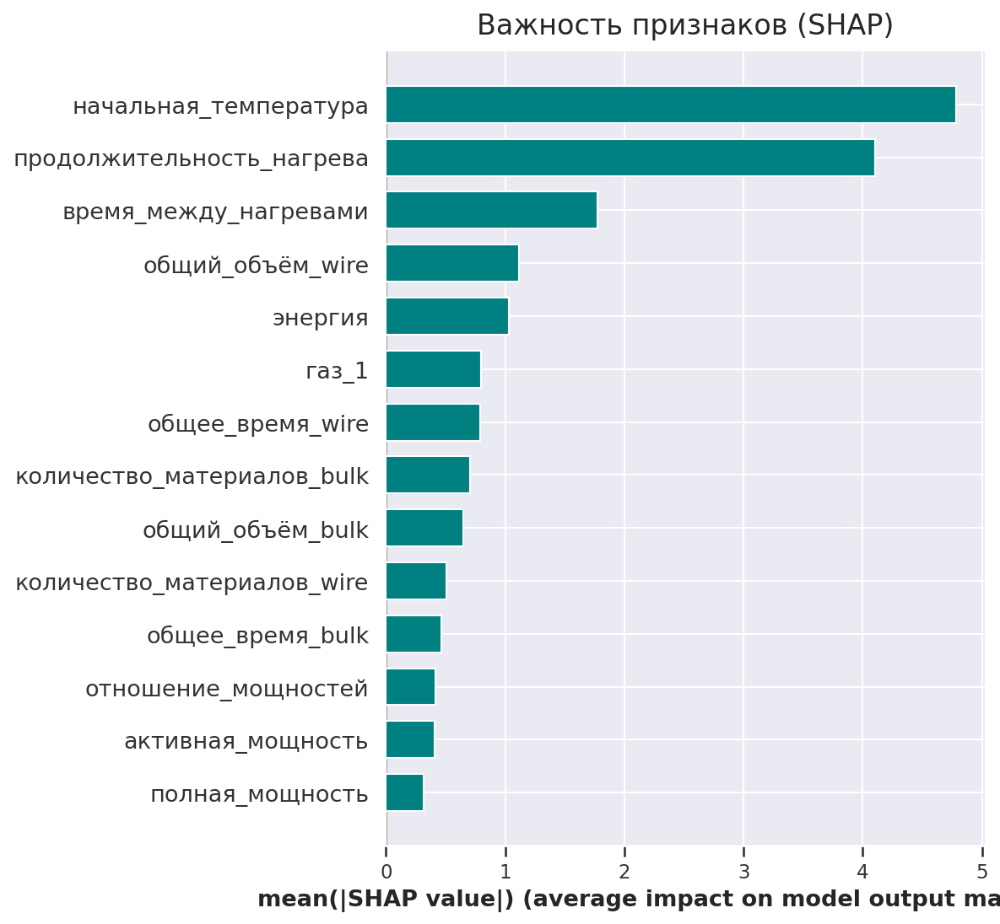

In [164]:
# визуализация значений Шепли
plt.figure(dpi=PLOT_DPI)
shap.summary_plot(shap_values, X_test, plot_type='bar', show=False, color='teal') 
plt.title('Важность признаков (SHAP)')
plt.show()

<font size="3">
    
Визуализация показывает, что наибольший вклад в предсказание целевого признака `конечная_температура` вносит признак `начальная_температура`.
    
Меньшее, но ощутимое влияние оказывают признаки `продолжительность_нагрева` и `время_между_нагревами`.
    
Остальные признаки также вносят свой вклад в предсказание, но их значимость оценивается моделью намного ниже.

Изучим зависимость целевого признака от начальной температуры стали:

In [165]:
def target_feature (df, target, feature):
    fig = px.scatter(
        df,
        x=feature,
        y=target,
        trendline='lowess',
        trendline_options=dict(frac=.5),
        trendline_color_override='darkblue',
    ).update_layout(
        width=1000,
        height=600,
        xaxis_title=feature,
        yaxis_title=target,
        title=dict(
            text=f'Зависимость {target} от {feature}',
            x=.5
            )
        )
    fig.show()

In [166]:
target_feature(steel_temp, 'конечная_температура', 'начальная_температура')

<font size="3">
    
**Вывод**
    
Между признаками `начальная_температура` и `конечная_температура` отмечается некоторая положительная зависимость, что логично, ведь начальные условия могут определять потенциал для повышения температуры. 
    
Вместе с тем, некоторая часть данных продемонстрировала отклонения от общей тенденции, когда начальная температура превышает конечную. Эти наблюдения могут отражать специфические технологические режимы или ошибки измерений, требующие дополнительного внимания при анализе и возможной доработки модели.

<div class="alert alert-success">
<h2> Комментарий ревьюера <a class="tocSkip"> </h2>

<b>Все отлично!👍:</b> 
    
Молодец, что не забываешь оценить важность признаков модели
    
    
* Дополнительно впоследствии можно заново пересобирать лучшую модель на ограниченном наборе признаков (а не заранее, чтобы была возможность контролировать спад качества), чтобы облегчить ее (может потребоваться заново подобрать параметры). Это может дать небольшой прирост в качестве за счет избавления от зашумленности, главное не переборщить.


<hr style="width: 100%; height: 2px; background-color: #99b9b6;">

<font size="3">

**Заключение:**

В рамках исследования была построена модель для предсказания конечной температуры стали на основе факторов, связанных с технологическим процессом. 
    
Модель достигла **MAE = 6.55** и **R² = 0.38** на тестовой выборке. 
<br>Наибольший вклад в предсказание целевого признака вносит `начальная_температура`. Также значимыми оказались `продолжительность_нагрева` и `время_между_нагревами`, что указывает на влияние временных аспектов обработки стали.

---
    
**Рекомендации:**
    
Для повышения качества прогноза температуры стали стоит рассмотреть возможность внедрения следующих мер:

- **увеличение обучающей выборки**: добавить новые признаки (характеристики материалов или условия внешней среды), а также увеличить количество объектов выборки;
    
- **исследование аномалий**: дополнительно исследовать партии с увеличенным технологическим процессом, получить у Заказчика комментарии по имеющимся нормативам и определить необходимость очистки данных от выбивающихся значений;

- **использование гибридных моделей**: рассмотреть комбинацию нейронный сетей и бустинговых моделей для повышения точности. Это может позволить лучше учесть нелинейные зависимости и сложные связи между признаками.

Данный комплекс мер поможет повысить качество прогноза температуры стали.

---

**Бизнес-рекомендации:**
    
- **снижение расходов**: полученная модель помогает понять, какие факторы больше всего влияют на конечную температуру. Это знание можно использовать для оптимизации энергозатрат, подбирая более эффективные режимы нагрева и охлаждения, особенно в случае продолжительных нагревов и интервалов между ними;
    
- **повышение качества продукции**: автоматизация контроля температуры и времени нагрева на основе предсказаний модели может улучшить однородность состава и качество стали, а также снизить риск брака партии из-за недогрева или перегрева металла;
    
- **системы мониторинга**: расширение системы мониторинга позволит улучшить точность модели и повысить её предсказательную силу: дополнительные датчики для регистрации химического состава, параметров сырья и внешних условий помогут достичь более качественного контроля над технологическим процессом.

<hr style="width: 100%; height: 2px; background-color: #99b9b6;">
    
## Общий вывод

<font size="3">
    
**Цель исследования** 
    
Разработка модели машинного обучения для предсказания температуры сплава стали с целью оптимизации потребления энергии в металлургическом производстве.
    
> **Загрузка и обработка данных**

- исследована предоставленная база данных SQLite;
- все 7 таблиц считаны в датафреймы для дальнейшего исследования;
- проведена проверка данных на полноту и качество, обработаны пропуски и дубликаты.
    
> **Исследовательский анализ**

- выполнен исследовательский анализ всех признаков имеющихся таблиц;
- определены и изучены аномальные значения;
- добавлены и изучены новые признаки для расширения тренировочной выборки;
- исследованные таблицы объединены по ключу в одну общую выборку.
    
> **Корреляционный анализ**   
- для изучения корреляции всех признаков датафрейма построена матрица корреляции phik;
- получен итоговый датасет для построения модели, включающий только значимые признаки для повышения информативности выборки.
    
> **Подготовка данных для обучения** 
- подготовлены обучающая и тестовая выборки.
    
> **Обучение моделей**     

Построены несколько моделей и проведена оптимизация гиперпараметров:
- RandomForestRegressor;
- CatBoostRegressor, 
- NeuralNetwork на основе Keras.
    
Модель **CatBoostRegressor** показала оптимальное соотношение скорости обучения и качества прогноза:

- метрика MAE на кросс-валидации - **6.144**;
- скорость обучения модели - **8.702** секунд.
    
> **Анализ важности признаков**  

Проведён анализ важности признаков для понимания ключевых факторов, влияющих на конечную температуру:
- основное влияние на целевой признак оказывает начальная температура стали;
- на результат также существенно влияют продолжительность нагрева и промежуток времени между нагревами;
- остальные признаки имеют менее значимый, но все же ощутимый вклад в предсказания модели.
    
---
    
**Рекомендации для заказчика:**

- **оптимизация**: за счёт более точного предсказания температуры плавления можно снизить энергозатраты и исключить ненужные этапы повторного нагрева;
- **дальнейший сбор данных**: для повышения точности модели стоит увеличить набор данных, особенно для партий с нестандартными условиями плавки, для лучшего понимания и охвата аномальных производственных режимов;
- **дополнительные признаки**: введение дополнительных факторов (например, характеристики сырья) может повысить точность и устойчивость предсказаний.

<div style="border:solid Chocolate 2px; padding: 40px">


<h2> Итоговый комментарий ревьюера <a class="tocSkip"> </h2>    
    
 
У меня сложилось отличное впечатление о проекте, тебе удалось справиться с таким выпускным проектом. Молодец! Подготовлены данные для анализа, изучены все параметры. Все красиво визуализировано, построено несколько моделей регрессии и оценено их качество. Осмысленная аналитика и дельная модельная работа - многое удалось как надо)
    
Отмечу отдельные положительные моменты проекта🙂:
    
- в ходе проекта встречались  функции, помогающие избавиться от дублирования кода;
- много красивых визуализаций в проекте и хорошая интерпретация;
- при обучении моделей использована валидация и поиск гиперпараметров.
    
Есть несколько моментов всего, на которые стоит ещё раз взглянуть, я указал их в моих комментариях по ходу проекта. Предлагаю тебе доработать проект по моим комментариям, чтобы довести его до совершенства.

    
 
</div>

<div style="border:solid Chocolate 2px; padding: 40px">


<h2> Итоговый комментарий ревьюера 2 <a class="tocSkip"> </h2>    
    
  
Теперь почти идеально, принимаю работу)
    
Если хочешь лучше разобраться в специальности, то предлагаю полезные материалы:   
-  <a href="https://academy.yandex.ru/handbook/ml/">Книга от ШАД</a>
    
- <a href="https://www.youtube.com/playlist?list=PLJ_CMbwA6bT-n1W0mgOlYwccZ-j6gBXqE">Лекции от Andrew Ng</a> 
    
- <a href="https://habr.com/ru/company/ods/blog/322626/">Открытый курс машинного обучения</a>
    
- Не все признаки приносят пользу при моделировании. Инструмент <a href="https://proglib.io/p/feature-selector">FeatureSelector</a> поможет тебе отобрать важные признаки и избавит от ручной обработки.  Также можешь посмотреть статью на <a href="https://www.kaggle.com/code/prashant111/comprehensive-guide-on-feature-selection/notebook">Kaggle</a>.
    
- Избежать утечки данных при кросс-валидации тебе поможет <a href="https://towardsdatascience.com/pipeline-columntransformer-and-featureunion-explained-f5491f815f">конвеерная обработка данных</a>.  
    
- Интерпретировать предсказания моделей поможет  <a href="https://habr.com/ru/post/428213/">SHAP</a>,   <a href="https://towardsdatascience.com/using-shap-values-to-explain-how-your-machine-learning-model-works-732b3f40e137">+ еще ссылка</a>.    
- Интересные способы <a href="https://github.com/DmitrySerg/otus-public/tree/master/OpenLessons/AnomalyDetection">обработки аномалий</a>.     
    
    
С интересом изучал твою работу, код и выводы. Что ещё для дальнейшего улучшения качества/скорости моделирования возможно сделать?
    
Опишу здесь некоторые идеи:
    
1. Качество данных на входе: ещё раз оценить аномалии, пропуски, проверить согласованность временных признаков.
2. Генерация новых полезных признаков (features engineering).
3. Оптимизация подбора гиперпараметров (OptunaSearchCV, RandomizedSearchCV, BayesSearchCV и т.д.)
4. Анализ остатков (разницы между прогнозом и истинным значением таргета): выявить, в каких случаях чаще всего ошибается, а в каких выдает наиболее точный результат... 
    
А главное, мы достигли цели нашего проекта: пройдены основные этапы построения модели регрессии для прогнозирования конечной температуры сплава с учетом ее качества.
    
Рад был тебе помочь)

Удачи!
  
</div>